In [1]:
import os
import numpy as np
import pandas as pd
from dateutil.parser import parse
from sklearn.preprocessing import scale, robust_scale, minmax_scale, maxabs_scale
import pandas_profiling as pp
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
from random import randint
from bars import *

import warnings
import numbers
import datetime
warnings.simplefilter(action='ignore', category=FutureWarning)
pd.options.mode.chained_assignment = None
read_path = 'E:/Old_Data/Jay/DIOB_data_A3_G7/'

In [2]:
# original add_vertical_barrier used "number of days"
# but, changed from "number of days" to "number of seconds"

def add_vertical_barrier(t_events, close, num_days=1):
    # Find index to closest to vertical barrier
    nearest_index = close.index.searchsorted(t_events + pd.Timedelta(seconds=num_days))

    # Exclude indexes which are outside the range of close price index
    nearest_index = nearest_index[nearest_index < close.shape[0]]
    
    last_index = len(test_df['mid_price']) - 1
    # added
    if len(t_events) - len(nearest_index) == 1:
        nearest_index = np.append(nearest_index, last_index)
    elif len(t_events) - len(nearest_index) == 2:
        nearest_index = np.append(nearest_index, last_index)
        nearest_index = np.append(nearest_index, last_index)
    elif len(t_events) - len(nearest_index) == 3:
        nearest_index = np.append(nearest_index, last_index)
        nearest_index = np.append(nearest_index, last_index)
        nearest_index = np.append(nearest_index, last_index)
    elif len(t_events) - len(nearest_index) == 4:
        nearest_index = np.append(nearest_index, last_index)
        nearest_index = np.append(nearest_index, last_index)
        nearest_index = np.append(nearest_index, last_index)
        nearest_index = np.append(nearest_index, last_index)
    elif len(t_events) - len(nearest_index) == 5:
        nearest_index = np.append(nearest_index, last_index)
        nearest_index = np.append(nearest_index, last_index)
        nearest_index = np.append(nearest_index, last_index)
        nearest_index = np.append(nearest_index, last_index)
        nearest_index = np.append(nearest_index, last_index)
    
    # Find price index closest to vertical barrier time stamp
    nearest_timestamp = close.index[nearest_index]
    filtered_events = t_events[:nearest_index.shape[0]]

    vertical_barriers = pd.Series(data=nearest_timestamp, index=filtered_events)
    return vertical_barriers

In [3]:
# data : DMA data
df_count = 0
count = 0
for i in os.listdir(read_path):
    count += 1 
    date = i[-12:-4]        
    print(date)
    df = pd.read_csv(read_path + i)
    df['date_time'] = df['time'].apply(lambda x: date[:4] + '-' + date[4:6] + '-' + date[6:] + ' ' +  x[:8] + '.' + x[9:])

    if df_count == 0:
        df_count += 1
        data = pd.DataFrame(columns=df.columns)

    data = data.merge(df, how='outer')

20160912
20160913
20160919
20160920
20160921
20160922
20160923
20160926
20160927
20160928
20160929
20160930
20161004
20161005
20161006
20161007
20161010
20161011
20161012
20161013
20161014
20161017
20161018
20161019
20161020
20161021
20161024
20161025
20161026
20161027
20161028
20161031
20161101
20161102
20161103
20161104
20161107
20161108
20161109


C:\Users\Jay\lib\site-packages\IPython\core\interactiveshell.py:2785: DtypeWarning: Columns (4) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


20161110
20161111
20161114
20161115
20161116
20161117
20161118
20161121
20161122
20161123
20161124
20161125
20161128
20161129
20161130
20161201
20161202
20161205
20161206
20161207
20161208
20161209
20161212
20161213
20161214
20161215
20161216
20161219
20161220
20161221
20161223
20161226
20161227
20161228
20161229


In [4]:
data = data[data['long_or_short'] != ' ']
data['date'] = data['date_time'].apply(lambda x: x[:4] + x[5:7] + x[8:10])
data['mid_price'] = (data['long_lvl_1_p'] + data['short_lvl_1_p']) / 2

In [5]:
dates = data['date'].sort_values(ascending=True).unique()
dates

array(['20160912', '20160913', '20160919', '20160920', '20160921',
       '20160922', '20160923', '20160926', '20160927', '20160928',
       '20160929', '20160930', '20161004', '20161005', '20161006',
       '20161007', '20161010', '20161011', '20161012', '20161013',
       '20161014', '20161017', '20161018', '20161019', '20161020',
       '20161021', '20161024', '20161025', '20161026', '20161027',
       '20161028', '20161031', '20161101', '20161102', '20161103',
       '20161104', '20161107', '20161108', '20161109', '20161110',
       '20161111', '20161114', '20161115', '20161116', '20161117',
       '20161118', '20161121', '20161122', '20161123', '20161124',
       '20161125', '20161128', '20161129', '20161130', '20161201',
       '20161202', '20161205', '20161206', '20161207', '20161208',
       '20161209', '20161212', '20161213', '20161214', '20161215',
       '20161216', '20161219', '20161220', '20161221', '20161223',
       '20161226', '20161227', '20161228', '20161229'], dtype=

## Imbalance Tick Bars postponed

### Get the Thresholds and record it

In [6]:
end_dates = []
marking_dates = []
marking_long_spread_threshold = []
marking_short_spread_threshold = []

for i in range(len(dates)):
    count = 0
    
    train_spread_array = np.array([])
    
    for j in dates[i:]:
        count += 1
        
        if count == 1:
            start_date = j
                    
        if count == 10:
            
            end_date = j
            end_dates.append(end_date)
            
            try:
                marking_date = dates[list(dates).index(j) + 1]

            except IndexError: 
                break
            
            print(end_date, marking_date)
            marking_dates.append(marking_date)
            
            # 여기서부터 데이터 값 추출해야함 #10일임 #.
            
            date = j
            df = data[(data['date'] >= start_date) & (data['date'] <= end_date)]
            df['short_time'] = df['time'].apply(lambda x: x[0:8])
            df = df.reset_index(drop=True)
            
            ##################################################
            spreads= [0]  # index starts at 1, therefore, the initial_array will have 0.
            ask_exe_q = 0
            bid_exe_q = 0
            current_long_lvl_1_q = 0
            current_long_lvl_2_q = 0
            current_long_lvl_3_q = 0
            current_long_lvl_4_q = 0
            current_long_lvl_5_q = 0

            current_short_lvl_1_q = 0
            current_short_lvl_2_q = 0
            current_short_lvl_3_q = 0
            current_short_lvl_4_q = 0
            current_short_lvl_5_q = 0

            previous_long_lvl_1_q = 0
            previous_long_lvl_2_q = 0
            previous_long_lvl_3_q = 0
            previous_long_lvl_4_q = 0
            previous_long_lvl_5_q = 0 

            previous_short_lvl_1_q = 0
            previous_short_lvl_2_q = 0
            previous_short_lvl_3_q = 0
            previous_short_lvl_4_q = 0
            previous_short_lvl_5_q = 0
            ##################################################
            
            for idx in df.index + 1:
                
                if idx == len(df):
                    break
                    
                exe_q = df.get_value(idx, 'exe_q')
                long_or_short = df.get_value(idx, 'long_or_short')
                
                if long_or_short == 2:
                    ask_exe_q = exe_q
                    bid_exe_q = 0
                elif long_or_short == 1:
                    ask_exe_q = 0
                    bid_exe_q = exe_q
                
                current_long_lvl_1_q = int(df.get_value(idx, 'long_lvl_1_q'))
                current_long_lvl_2_q = int(df.get_value(idx, 'long_lvl_2_q'))
                current_long_lvl_3_q = int(df.get_value(idx, 'long_lvl_3_q'))
                current_long_lvl_4_q = int(df.get_value(idx, 'long_lvl_4_q'))
                current_long_lvl_5_q = int(df.get_value(idx, 'long_lvl_5_q'))

                current_short_lvl_1_q = int(df.get_value(idx, 'short_lvl_1_q'))
                current_short_lvl_2_q = int(df.get_value(idx, 'short_lvl_2_q'))
                current_short_lvl_3_q = int(df.get_value(idx, 'short_lvl_3_q'))
                current_short_lvl_4_q = int(df.get_value(idx, 'short_lvl_4_q'))
                current_short_lvl_5_q = int(df.get_value(idx, 'short_lvl_5_q'))

                previous_long_lvl_1_q = int(df.get_value(idx - 1, 'long_lvl_1_q'))
                previous_long_lvl_2_q = int(df.get_value(idx - 1, 'long_lvl_2_q'))
                previous_long_lvl_3_q = int(df.get_value(idx - 1, 'long_lvl_3_q'))
                previous_long_lvl_4_q = int(df.get_value(idx - 1, 'long_lvl_4_q'))
                previous_long_lvl_5_q = int(df.get_value(idx - 1, 'long_lvl_5_q'))

                previous_short_lvl_1_q = int(df.get_value(idx - 1, 'short_lvl_1_q'))
                previous_short_lvl_2_q = int(df.get_value(idx - 1, 'short_lvl_2_q'))
                previous_short_lvl_3_q = int(df.get_value(idx - 1, 'short_lvl_3_q'))
                previous_short_lvl_4_q = int(df.get_value(idx - 1, 'short_lvl_4_q'))
                previous_short_lvl_5_q = int(df.get_value(idx - 1, 'short_lvl_5_q'))

                netAsk = (current_long_lvl_1_q - previous_long_lvl_1_q) + \
                (current_long_lvl_2_q - previous_long_lvl_2_q) + \
                (current_long_lvl_3_q - previous_long_lvl_3_q) + \
                (current_long_lvl_4_q - previous_long_lvl_4_q) + \
                (current_long_lvl_5_q - previous_long_lvl_5_q) - ask_exe_q

                netBid = (current_short_lvl_1_q - previous_short_lvl_1_q) + \
                (current_short_lvl_2_q - previous_short_lvl_2_q) + \
                (current_short_lvl_3_q - previous_short_lvl_3_q) + \
                (current_short_lvl_4_q - previous_short_lvl_4_q) + \
                (current_short_lvl_5_q - previous_short_lvl_5_q) - bid_exe_q  
                
                spread = netBid - netAsk
                
                spreads.append(spread)
                
            df['spreads'] = spreads
            df['rolling_spreads_mean'] = df['spreads'].rolling(1000).mean()
            df['rolling_spreads_mean'] = df['rolling_spreads_mean'].replace(np.nan, 0)
            
            train_spread_array = np.concatenate((train_spread_array, 
                                                 np.array(df['rolling_spreads_mean'])))
            
            long_spread_threshold = np.percentile(train_spread_array, 97.50)
            short_spread_threshold = np.percentile(train_spread_array, 2.50)
            
            marking_long_spread_threshold.append(long_spread_threshold)
            marking_short_spread_threshold.append(short_spread_threshold)
            
            break
    if len(dates[i:]) <= 10:
        break
        
#     if end_date >= '20151001':
#         break

20160928 20160929
20160929 20160930
20160930 20161004
20161004 20161005
20161005 20161006
20161006 20161007
20161007 20161010
20161010 20161011
20161011 20161012
20161012 20161013
20161013 20161014
20161014 20161017
20161017 20161018
20161018 20161019
20161019 20161020
20161020 20161021
20161021 20161024
20161024 20161025
20161025 20161026
20161026 20161027
20161027 20161028
20161028 20161031
20161031 20161101
20161101 20161102
20161102 20161103
20161103 20161104
20161104 20161107
20161107 20161108
20161108 20161109
20161109 20161110
20161110 20161111
20161111 20161114
20161114 20161115
20161115 20161116
20161116 20161117
20161117 20161118
20161118 20161121
20161121 20161122
20161122 20161123
20161123 20161124
20161124 20161125
20161125 20161128
20161128 20161129
20161129 20161130
20161130 20161201
20161201 20161202
20161202 20161205
20161205 20161206
20161206 20161207
20161207 20161208
20161208 20161209
20161209 20161212
20161212 20161213
20161213 20161214
20161214 20161215
20161215 2

In [7]:
train_parameters = pd.concat([pd.Series(marking_dates, name='prd_date'), 
                              pd.Series(marking_long_spread_threshold, name='prd_long_thresh'),
                              pd.Series(marking_short_spread_threshold, name='prd_short_thresh')], axis=1)
train_parameters

,prd_date,prd_long_thresh,prd_short_thresh
0,20160929,0.537000,-0.542000
1,20160930,0.551000,-0.567000
2,20161004,0.556000,-0.575000
3,20161005,0.542000,-0.563000
4,20161006,0.546000,-0.567000
5,20161007,0.542000,-0.562000
6,20161010,0.535000,-0.547000
7,20161011,0.524000,-0.541000
8,20161012,0.514000,-0.523000
9,20161013,0.497000,-0.509000


20160929 0.537 -0.542


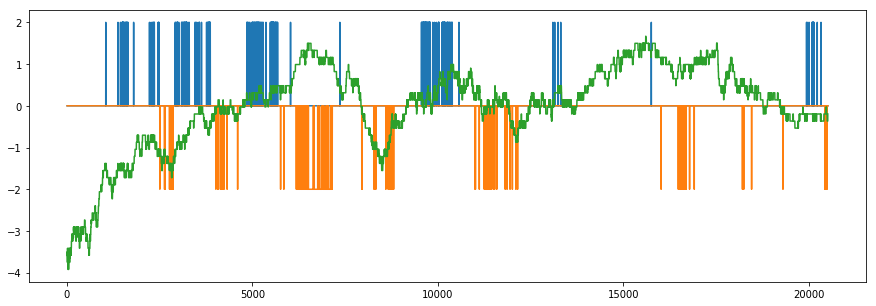

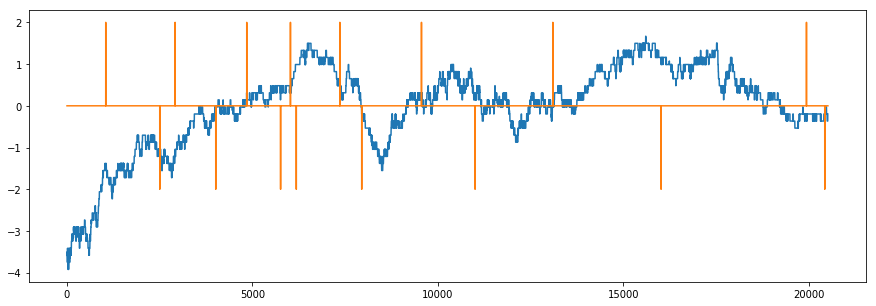

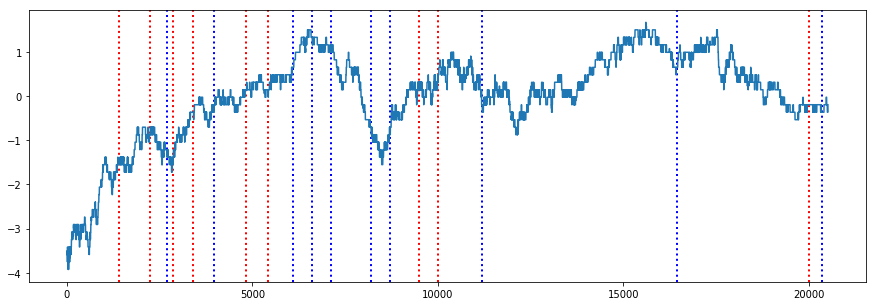

# Long  26075 26095 26065 26090
# Long Entry: 2016-09-29 09:04:04.474951 # Long Exit: 2016-09-29 09:06:11.368232 # Long_upper_threshold_profit: 20
#######################################################################################################
# Long  26095 26115 26085 26105
# Long Entry: 2016-09-29 09:08:00.534051 # Long Exit: 2016-09-29 09:15:03.197704 # Long_upper_threshold_profit: 20
#######################################################################################################
# Long  26080 26100 26070 26110
# Long Entry: 2016-09-29 09:11:35.083664 # Long Exit: 2016-09-29 09:13:55.668607 # Long_upper_threshold_profit: 20
#######################################################################################################
# Long  26110 26130 26100 26110
# Long Entry: 2016-09-29 09:14:31.124149 # Long Exit: 2016-09-29 09:14:34.223986 # Long_lower_threshold_profit: -10
###################################################################################################

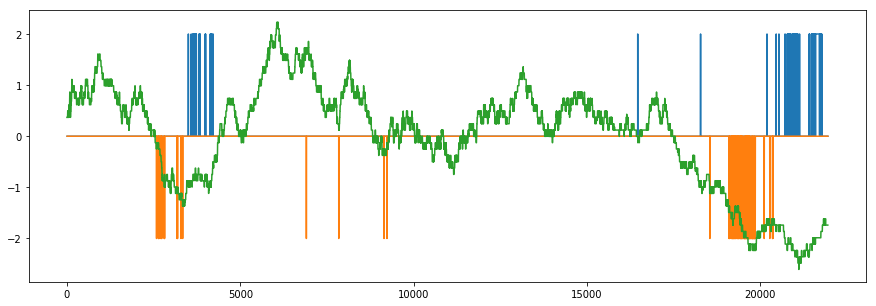

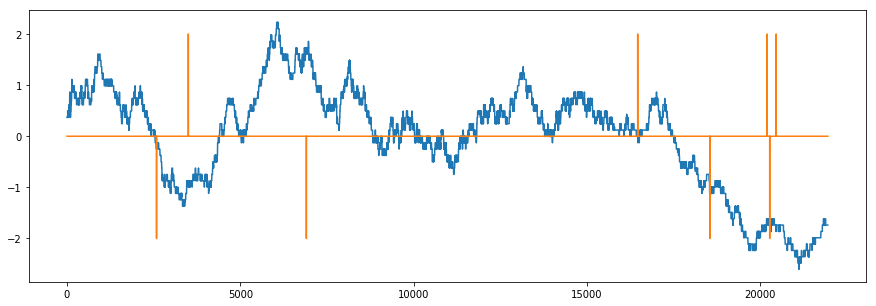

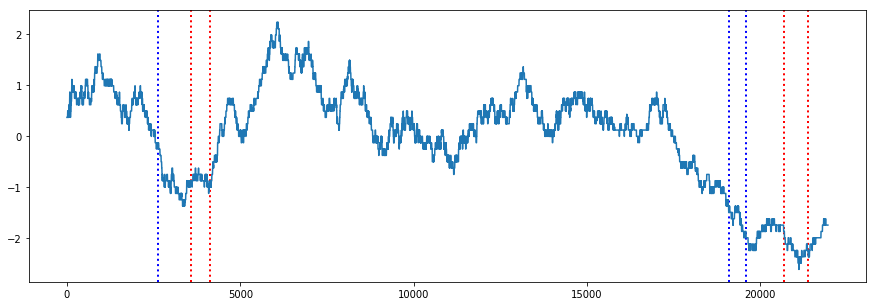

# Long  25850 25870 25840 25880
# Long Entry: 2016-09-30 09:12:54.047638 # Long Exit: 2016-09-30 09:18:58.330733 # Long_upper_threshold_profit: 20
#######################################################################################################
# Long  25845 25865 25835 25900
# Long Entry: 2016-09-30 09:17:14.939999 # Long Exit: 2016-09-30 09:18:24.201604 # Long_upper_threshold_profit: 20
#######################################################################################################
# Long  25810 25830 25800 25785
# Long Entry: 2016-09-30 15:20:28.025077 # Long Exit: 2016-09-30 15:20:29.336673 # Long_lower_threshold_profit: -10
#######################################################################################################
# Long  25795 25815 25785 25820
# Long Entry: 2016-09-30 15:30:03.917302 # Long Exit: 2016-09-30 15:33:58.908266 # Long_upper_threshold_profit: 20
###################################################################################################

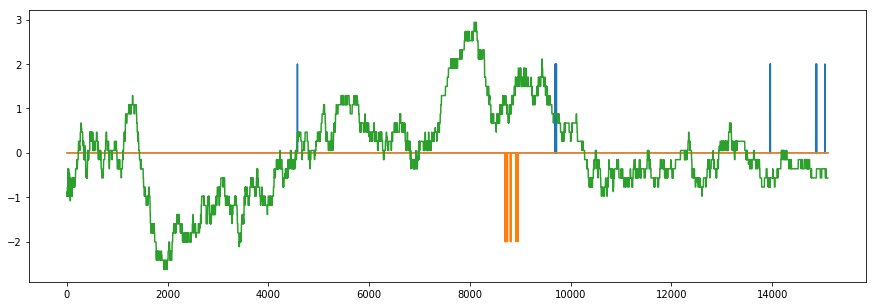

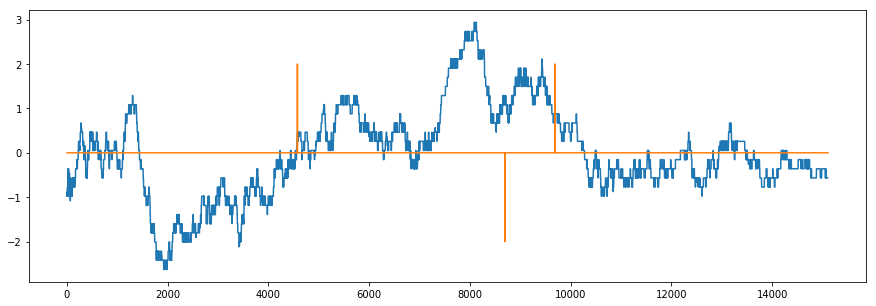

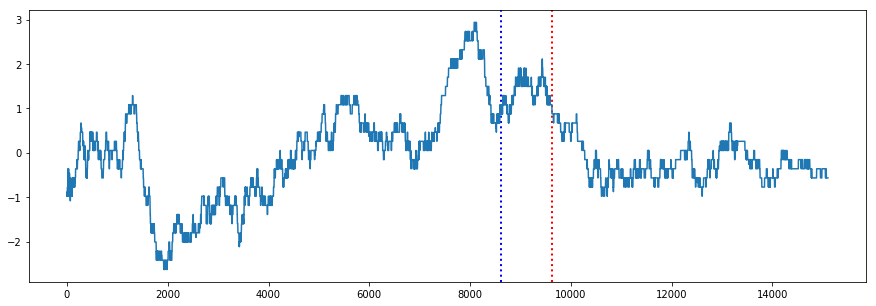

# Long  25995 26015 25985 25980
# Long Entry: 2016-10-04 11:15:00.609944 # Long Exit: 2016-10-04 11:15:12.466373 # Long_lower_threshold_profit: -10
#######################################################################################################
# Short  25990 26000 25970 26005
# Short Entry: 2016-10-04 10:45:02.860904 # Short Exit: 2016-10-04 10:45:58.534985 # Short_upper_threshold_profit: -10
#######################################################################################################
LONG P&L: -10 SHORT P&L: -10 TOTAL P&L: -20
#######################################################################################################
###############
Cum_Long_profit:  40
Cum_Short_profit:  -125
###############
20161005 0.542 -0.563


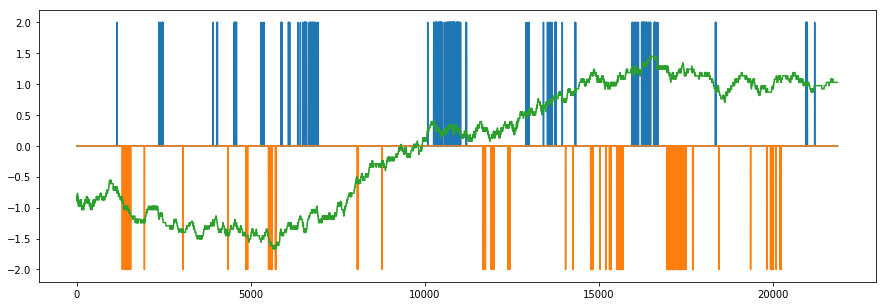

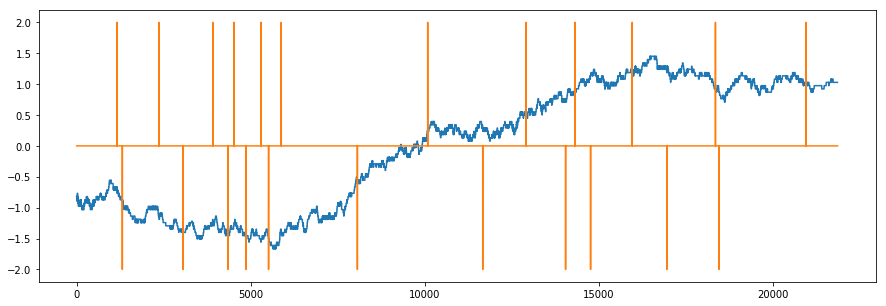

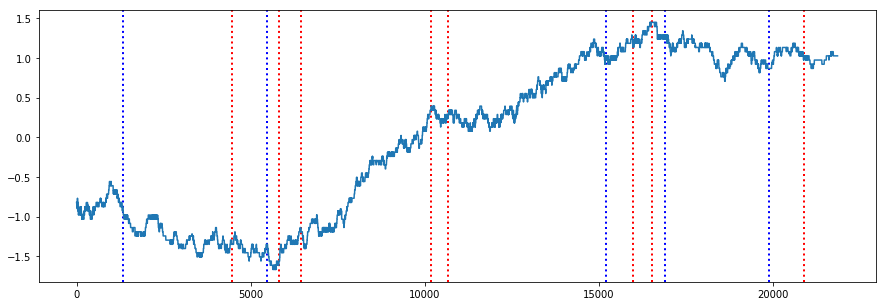

# Long  25735 25755 25725 25725
# Long Entry: 2016-10-05 09:23:09.314562 # Long Exit: 2016-10-05 09:26:12.229837 # Long_lower_threshold_profit: -10
#######################################################################################################
# Long  25710 25730 25700 25735
# Long Entry: 2016-10-05 09:43:17.225415 # Long Exit: 2016-10-05 09:43:47.725132 # Long_upper_threshold_profit: 20
#######################################################################################################
# Long  25750 25770 25740 25745
# Long Entry: 2016-10-05 09:53:26.824584 # Long Exit: 2016-10-05 09:53:54.298606 # Long_lower_threshold_profit: -10
#######################################################################################################
# Long  25895 25915 25885 25870
# Long Entry: 2016-10-05 10:16:59.630712 # Long Exit: 2016-10-05 10:17:13.931712 # Long_lower_threshold_profit: -10
#################################################################################################

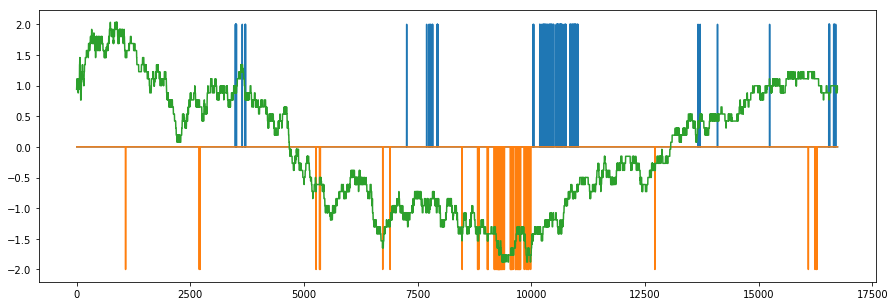

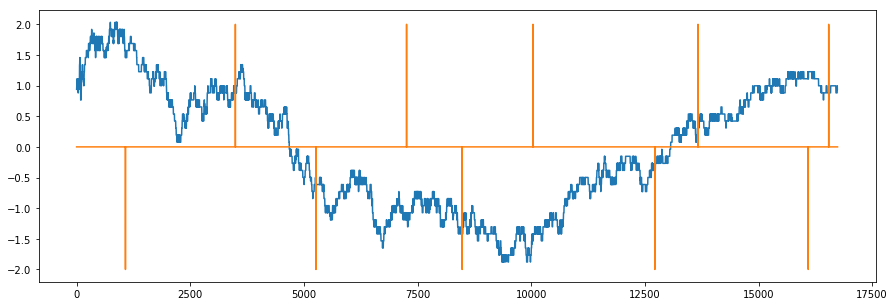

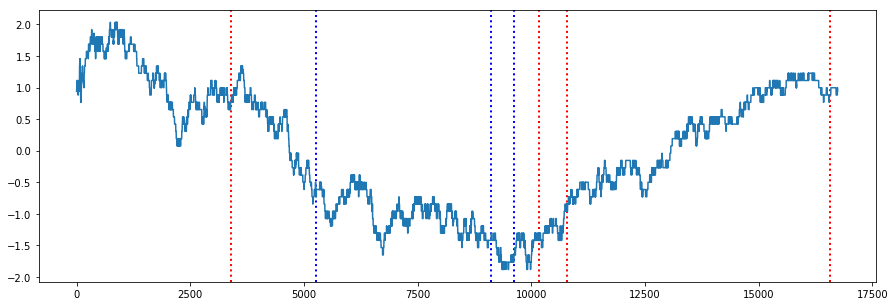

# Long  26125 26145 26115 26125
# Long Entry: 2016-10-06 09:19:59.284130 # Long Exit: 2016-10-06 09:21:21.771072 # Long_upper_threshold_profit: 20
#######################################################################################################
# Long  26035 26055 26025 26030
# Long Entry: 2016-10-06 11:33:01.608674 # Long Exit: 2016-10-06 11:33:01.608674 # Long_lower_threshold_profit: -10
#######################################################################################################
# Long  26050 26070 26040 26065
# Long Entry: 2016-10-06 11:55:55.084788 # Long Exit: 2016-10-06 12:04:15.884184 # Long_time_threshold_profit: 15
#######################################################################################################
# Long  26130 26150 26120 26110
# Long Entry: 2016-10-06 15:31:23.944545 # Long Exit: 2016-10-06 15:45:00.222435 # Long_lower_threshold_profit: -10
###################################################################################################

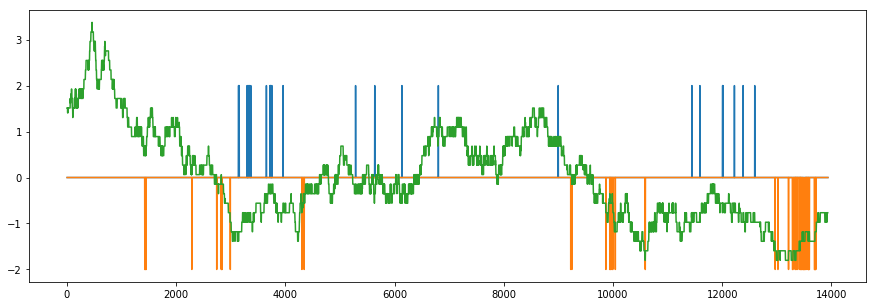

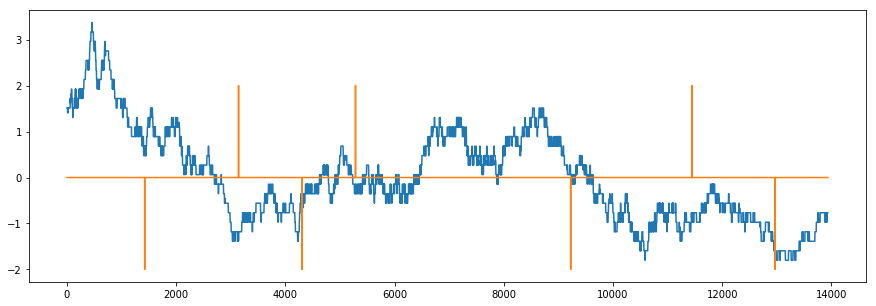

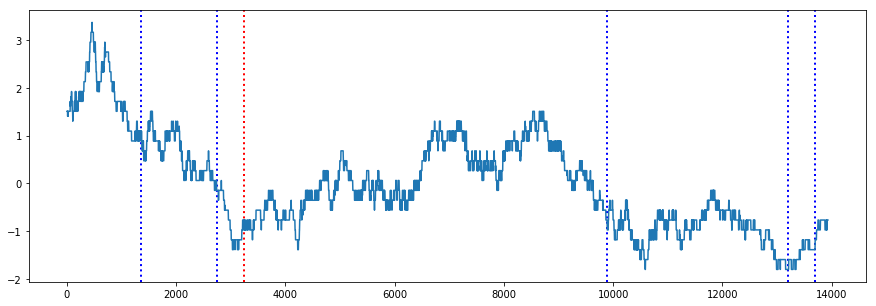

# Long  26060 26080 26050 26065
# Long Entry: 2016-10-07 09:32:30.060775 # Long Exit: 2016-10-07 09:32:30.061861 # Long_lower_threshold_profit: -10
#######################################################################################################
# Short  26100 26110 26080 26100
# Short Entry: 2016-10-07 09:08:01.970351 # Short Exit: 2016-10-07 09:08:38.154701 # Short_upper_threshold_profit: -10
#######################################################################################################
# Short  26075 26085 26055 26065
# Short Entry: 2016-10-07 09:29:04.680697 # Short Exit: 2016-10-07 09:31:41.984676 # Short_lower_threshold_profit: 20
#######################################################################################################
# Short  26050 26060 26030 26055
# Short Entry: 2016-10-07 12:33:43.490479 # Short Exit: 2016-10-07 12:33:46.402853 # Short_upper_threshold_profit: -10
#####################################################################################

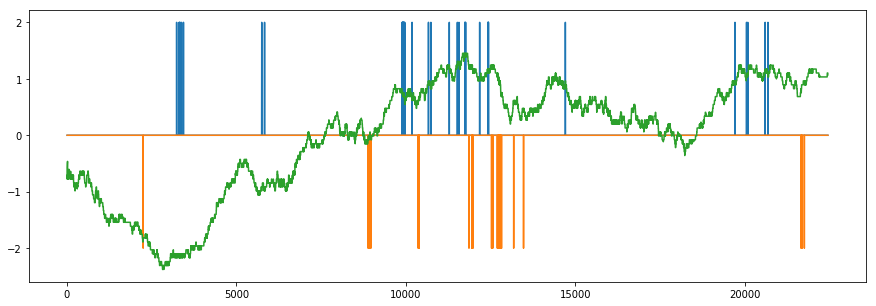

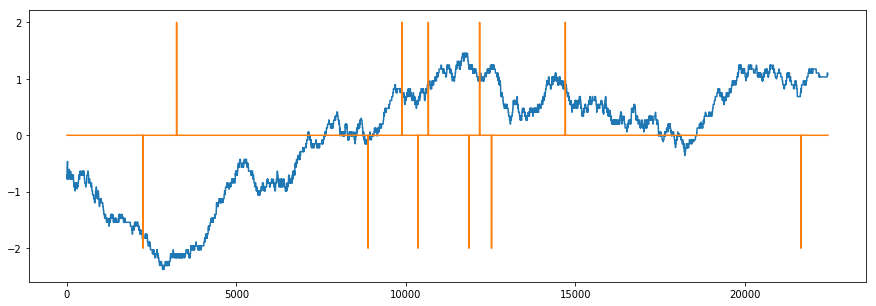

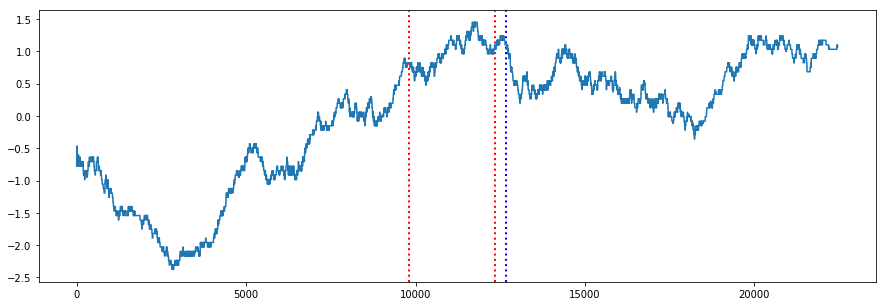

# Long  26070 26090 26060 26065
# Long Entry: 2016-10-10 09:48:52.108399 # Long Exit: 2016-10-10 09:49:16.241138 # Long_lower_threshold_profit: -10
#######################################################################################################
# Long  26090 26110 26080 26075
# Long Entry: 2016-10-10 10:21:50.792910 # Long Exit: 2016-10-10 10:22:44.900363 # Long_lower_threshold_profit: -10
#######################################################################################################
# Short  26085 26095 26065 26050
# Short Entry: 2016-10-10 10:29:30.136793 # Short Exit: 2016-10-10 10:30:23.498435 # Short_lower_threshold_profit: 20
#######################################################################################################
LONG P&L: -20 SHORT P&L: 20 TOTAL P&L: 0
#######################################################################################################
###############
Cum_Long_profit:  -25
Cum_Short_profit:  -205
###############
20161011 0.524 -0.

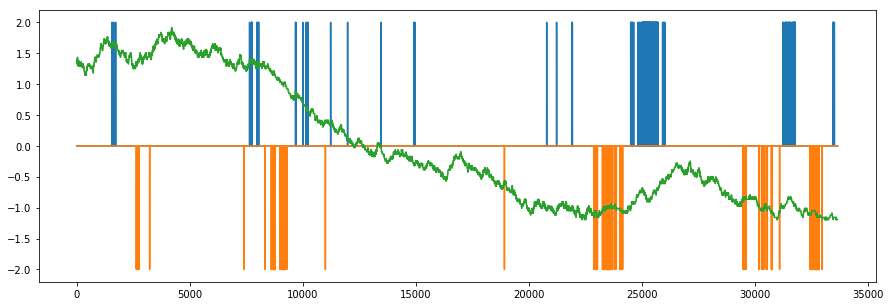

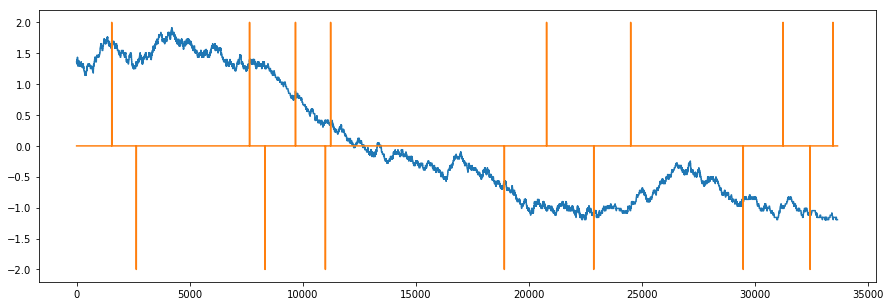

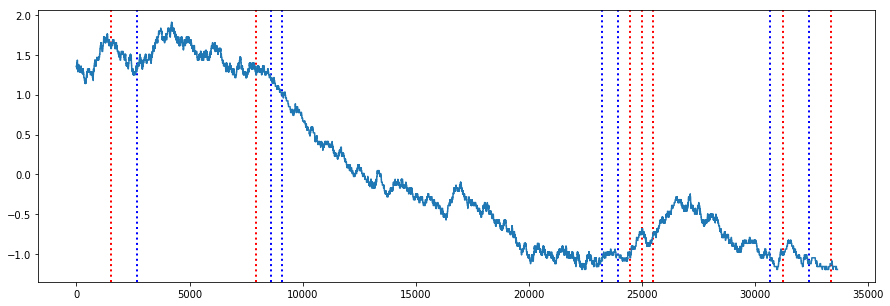

# Long  26070 26090 26060 26035
# Long Entry: 2016-10-11 09:04:01.258014 # Long Exit: 2016-10-11 09:06:03.530682 # Long_lower_threshold_profit: -10
#######################################################################################################
# Long  26030 26050 26020 26025
# Long Entry: 2016-10-11 10:28:05.713607 # Long Exit: 2016-10-11 10:28:36.391750 # Long_lower_threshold_profit: -10
#######################################################################################################
# Long  25710 25730 25700 25740
# Long Entry: 2016-10-11 13:23:43.699716 # Long Exit: 2016-10-11 13:29:32.723475 # Long_upper_threshold_profit: 20
#######################################################################################################
# Long  25755 25775 25745 25735
# Long Entry: 2016-10-11 13:30:26.773654 # Long Exit: 2016-10-11 13:30:54.987186 # Long_lower_threshold_profit: -10
#################################################################################################

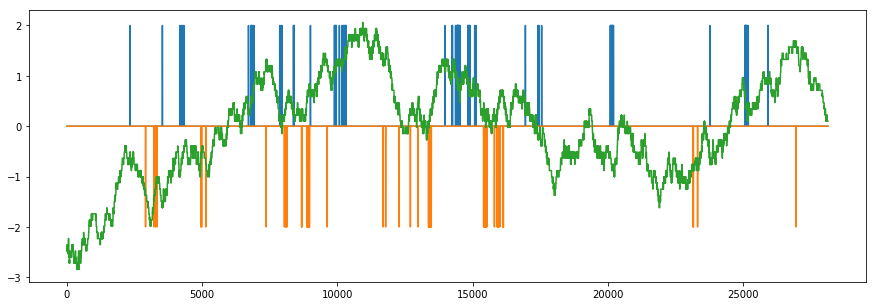

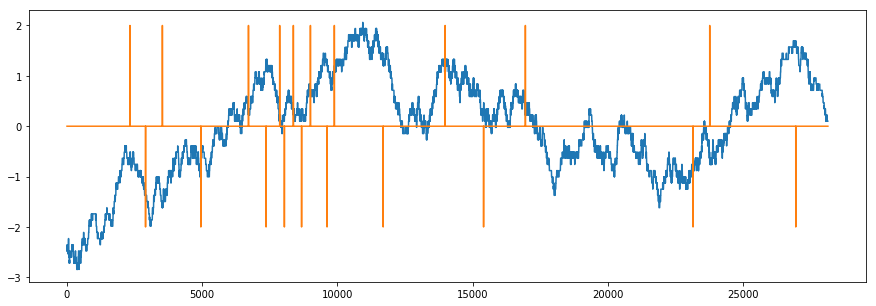

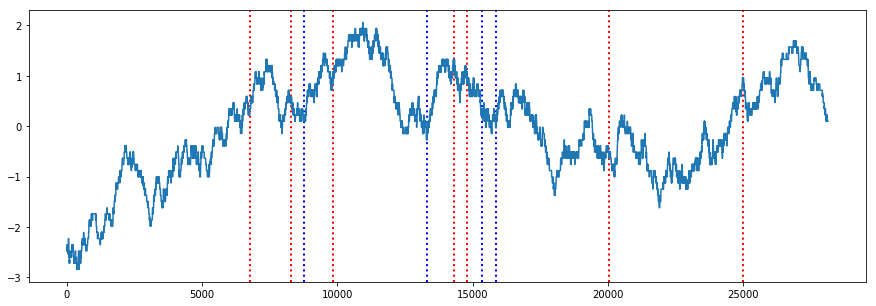

# Long  25665 25685 25655 25660
# Long Entry: 2016-10-12 09:33:59.348901 # Long Exit: 2016-10-12 09:35:46.368402 # Long_upper_threshold_profit: 20
#######################################################################################################
# Long  25680 25700 25670 25680
# Long Entry: 2016-10-12 09:44:24.645180 # Long Exit: 2016-10-12 09:44:25.168690 # Long_lower_threshold_profit: -10
#######################################################################################################
# Long  25695 25715 25685 25730
# Long Entry: 2016-10-12 09:57:40.264679 # Long Exit: 2016-10-12 10:03:07.623629 # Long_upper_threshold_profit: 20
#######################################################################################################
# Long  25710 25730 25700 25680
# Long Entry: 2016-10-12 10:34:20.834262 # Long Exit: 2016-10-12 10:34:40.118979 # Long_lower_threshold_profit: -10
##################################################################################################

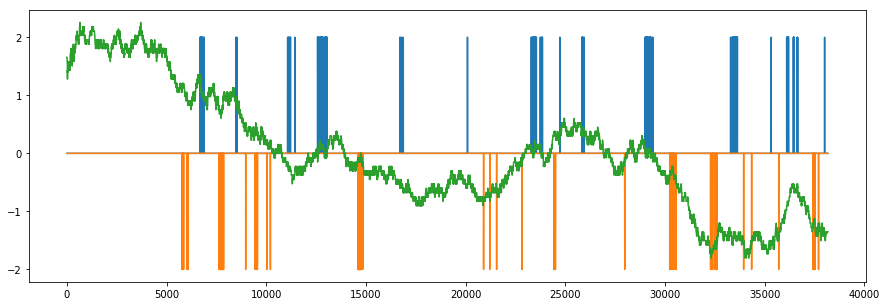

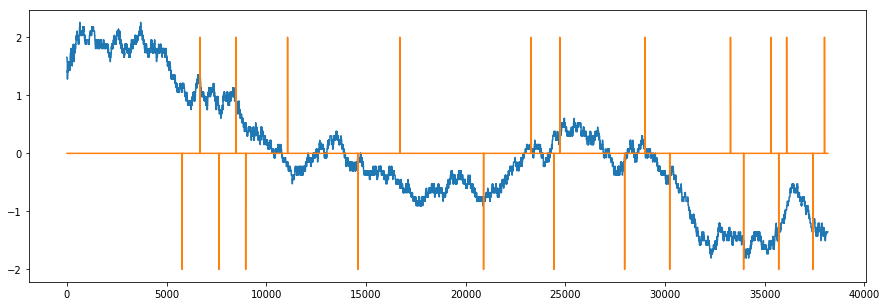

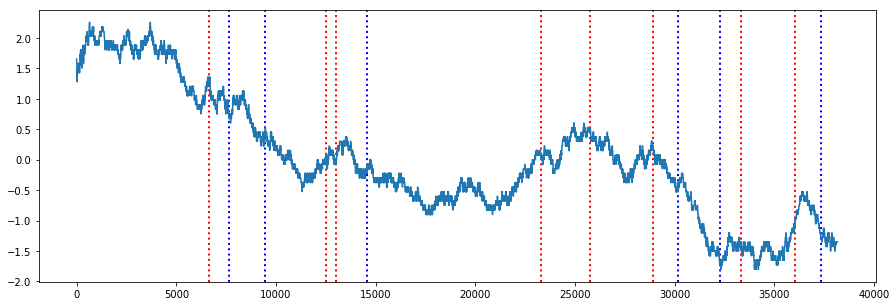

# Long  25610 25630 25600 25590
# Long Entry: 2016-10-13 09:46:12.061116 # Long Exit: 2016-10-13 09:46:53.551247 # Long_lower_threshold_profit: -10
#######################################################################################################
# Long  25530 25550 25520 25540
# Long Entry: 2016-10-13 10:36:31.972290 # Long Exit: 2016-10-13 10:37:12.624420 # Long_lower_threshold_profit: -10
#######################################################################################################
# Long  25525 25545 25515 25535
# Long Entry: 2016-10-13 10:41:32.015235 # Long Exit: 2016-10-13 10:43:12.466992 # Long_upper_threshold_profit: 20
#######################################################################################################
# Long  25535 25555 25525 25535
# Long Entry: 2016-10-13 12:22:29.730483 # Long Exit: 2016-10-13 12:22:47.874458 # Long_lower_threshold_profit: -10
#################################################################################################

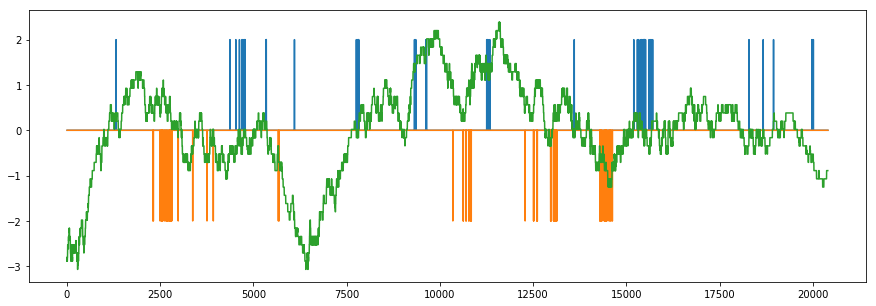

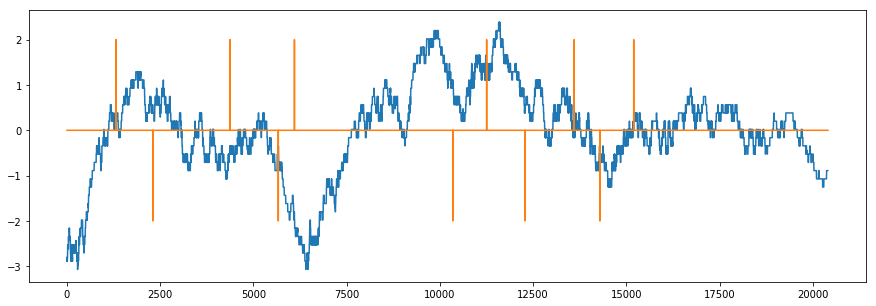

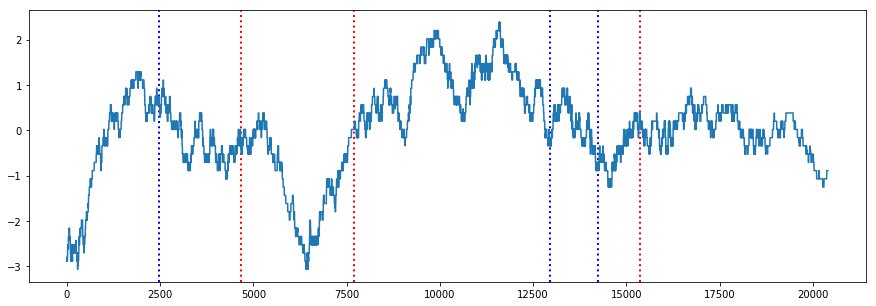

# Long  25585 25605 25575 25590
# Long Entry: 2016-10-14 09:29:46.523408 # Long Exit: 2016-10-14 09:29:46.542816 # Long_lower_threshold_profit: -10
#######################################################################################################
# Long  25595 25615 25585 25595
# Long Entry: 2016-10-14 10:07:02.735861 # Long Exit: 2016-10-14 10:07:22.382540 # Long_lower_threshold_profit: -10
#######################################################################################################
# Long  25600 25620 25590 25580
# Long Entry: 2016-10-14 12:00:27.096688 # Long Exit: 2016-10-14 12:00:27.140517 # Long_lower_threshold_profit: -10
#######################################################################################################
# Short  25600 25610 25580 25590
# Short Entry: 2016-10-14 09:08:59.331562 # Short Exit: 2016-10-14 09:08:59.334943 # Short_upper_threshold_profit: -10
############################################################################################

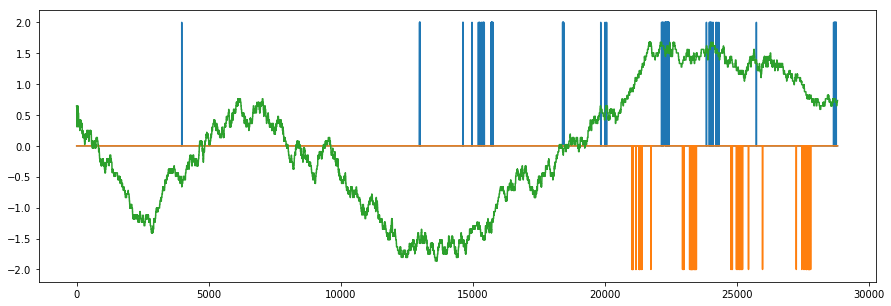

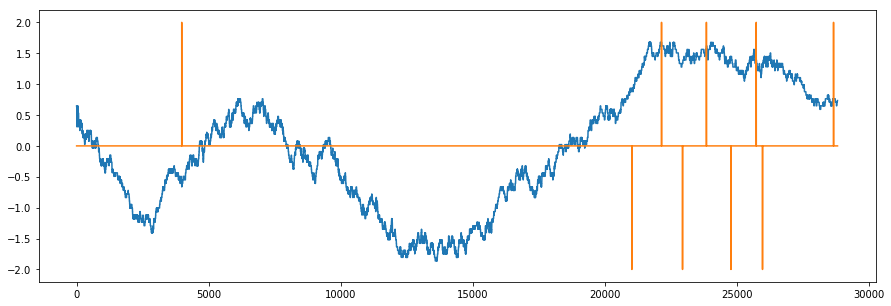

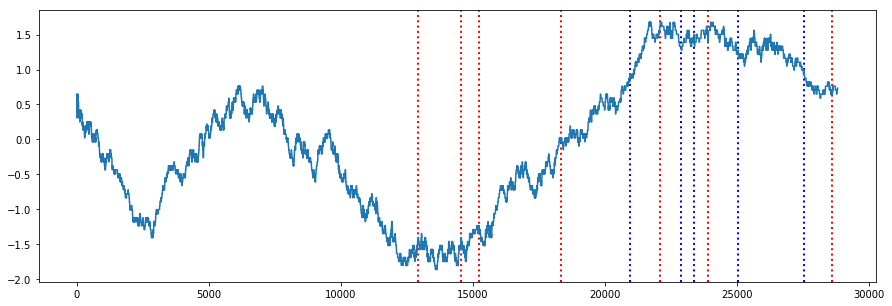

# Long  25435 25455 25425 25415
# Long Entry: 2016-10-17 10:24:00.166559 # Long Exit: 2016-10-17 10:24:00.166559 # Long_lower_threshold_profit: -10
#######################################################################################################
# Long  25425 25445 25415 25440
# Long Entry: 2016-10-17 10:39:05.635445 # Long Exit: 2016-10-17 10:45:00.835816 # Long_upper_threshold_profit: 20
#######################################################################################################
# Long  25450 25470 25440 25440
# Long Entry: 2016-10-17 10:46:45.956548 # Long Exit: 2016-10-17 10:46:52.242831 # Long_lower_threshold_profit: -10
#######################################################################################################
# Long  25560 25580 25550 25565
# Long Entry: 2016-10-17 11:21:06.333544 # Long Exit: 2016-10-17 11:21:45.796588 # Long_lower_threshold_profit: -10
#################################################################################################

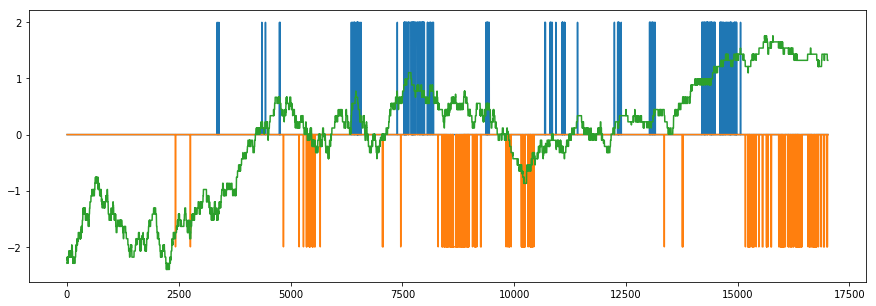

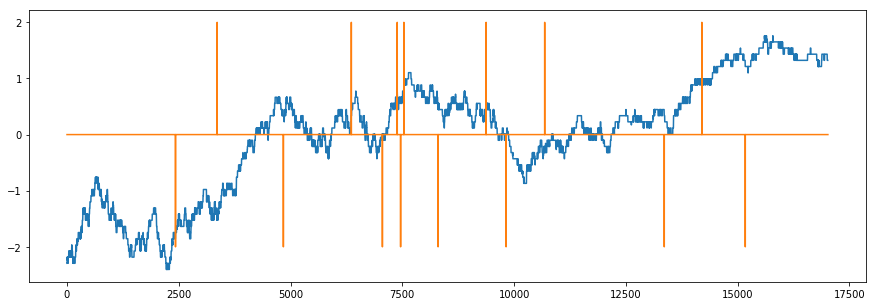

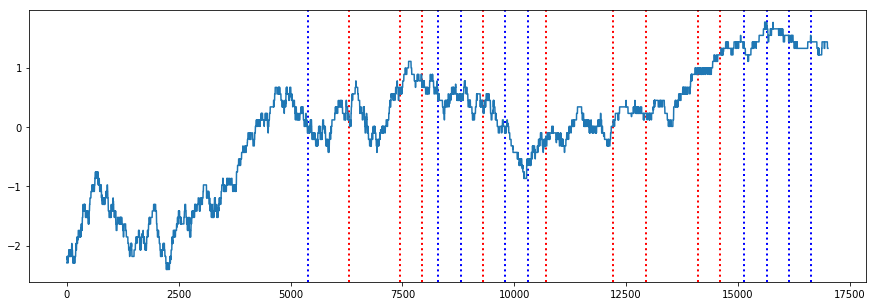

# Long  25750 25770 25740 25735
# Long Entry: 2016-10-18 10:03:58.238340 # Long Exit: 2016-10-18 10:06:01.565055 # Long_upper_threshold_profit: 20
#######################################################################################################
# Long  25775 25795 25765 25765
# Long Entry: 2016-10-18 10:23:16.992697 # Long Exit: 2016-10-18 10:23:59.702842 # Long_lower_threshold_profit: -10
#######################################################################################################
# Long  25775 25795 25765 25770
# Long Entry: 2016-10-18 10:31:00.580476 # Long Exit: 2016-10-18 10:31:30.199297 # Long_lower_threshold_profit: -10
#######################################################################################################
# Long  25760 25780 25750 25750
# Long Entry: 2016-10-18 11:04:51.599895 # Long Exit: 2016-10-18 11:04:53.648715 # Long_lower_threshold_profit: -10
#################################################################################################

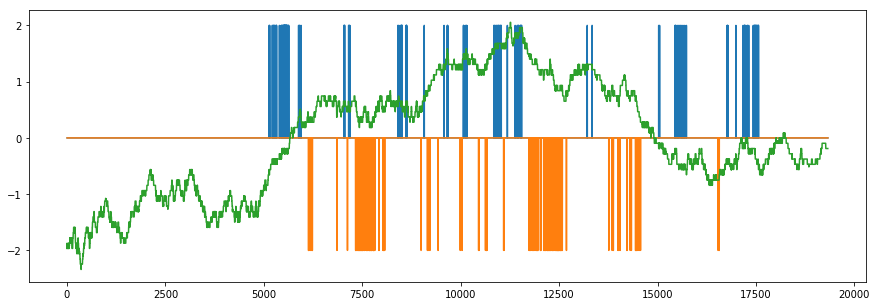

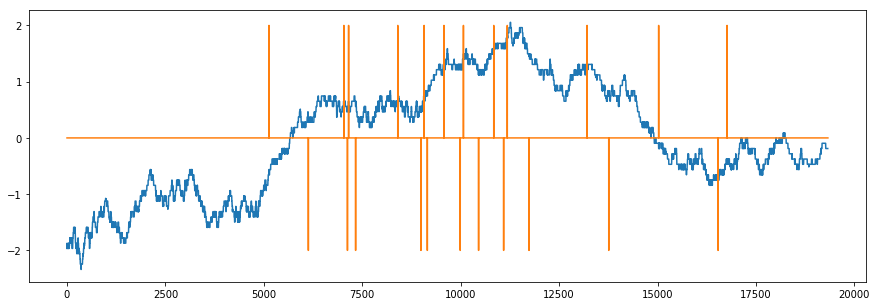

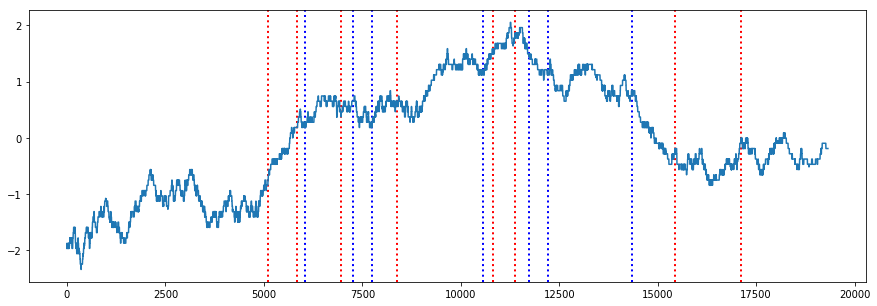

# Long  25820 25840 25810 25895
# Long Entry: 2016-10-19 10:04:55.437372 # Long Exit: 2016-10-19 10:06:00.412601 # Long_upper_threshold_profit: 20
#######################################################################################################
# Long  25870 25890 25860 25885
# Long Entry: 2016-10-19 10:08:06.201965 # Long Exit: 2016-10-19 10:11:23.165617 # Long_upper_threshold_profit: 20
#######################################################################################################
# Long  25885 25905 25875 25885
# Long Entry: 2016-10-19 10:20:11.216104 # Long Exit: 2016-10-19 10:20:34.229394 # Long_lower_threshold_profit: -10
#######################################################################################################
# Long  25890 25910 25880 25875
# Long Entry: 2016-10-19 10:55:45.374712 # Long Exit: 2016-10-19 11:01:04.202738 # Long_lower_threshold_profit: -10
##################################################################################################

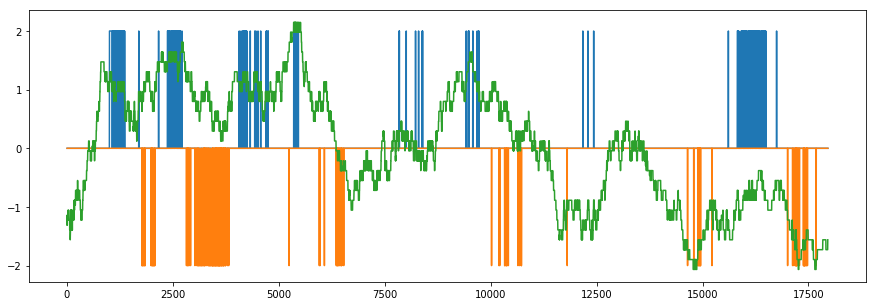

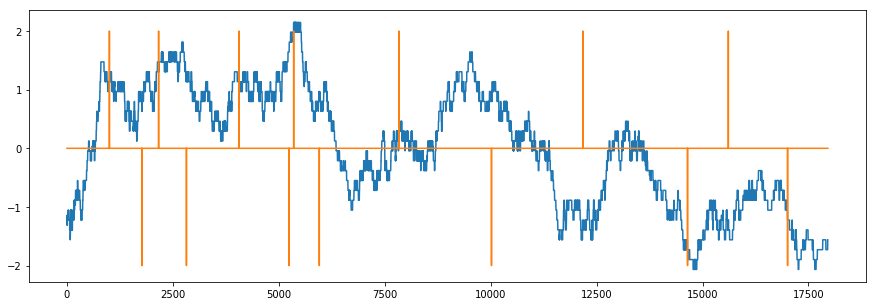

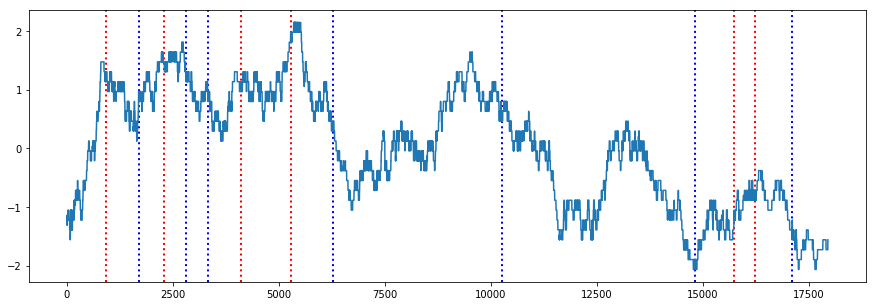

# Long  25935 25955 25925 25940
# Long Entry: 2016-10-20 09:02:50.185682 # Long Exit: 2016-10-20 09:02:56.623039 # Long_lower_threshold_profit: -10
#######################################################################################################
# Long  25945 25965 25935 25930
# Long Entry: 2016-10-20 09:10:28.199537 # Long Exit: 2016-10-20 09:10:41.357278 # Long_lower_threshold_profit: -10
#######################################################################################################
# Long  25930 25950 25920 25925
# Long Entry: 2016-10-20 09:33:35.441628 # Long Exit: 2016-10-20 09:36:46.062116 # Long_lower_threshold_profit: -10
#######################################################################################################
# Long  25955 25975 25945 25885
# Long Entry: 2016-10-20 09:55:37.859815 # Long Exit: 2016-10-20 09:56:08.565106 # Long_lower_threshold_profit: -10
################################################################################################

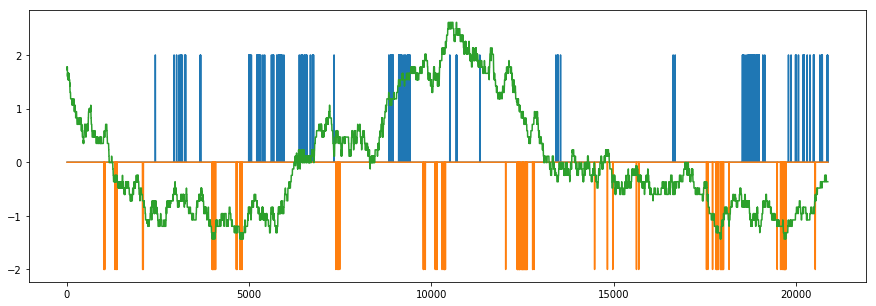

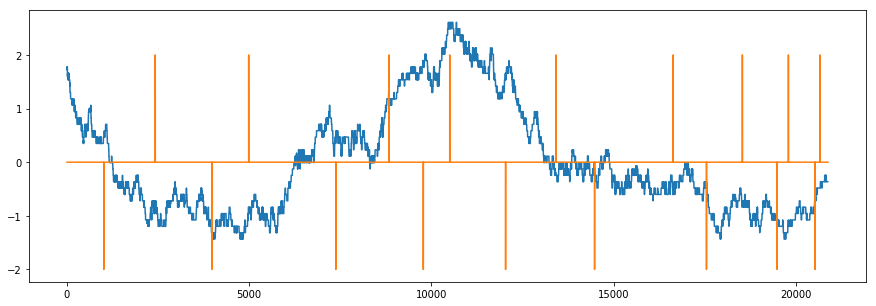

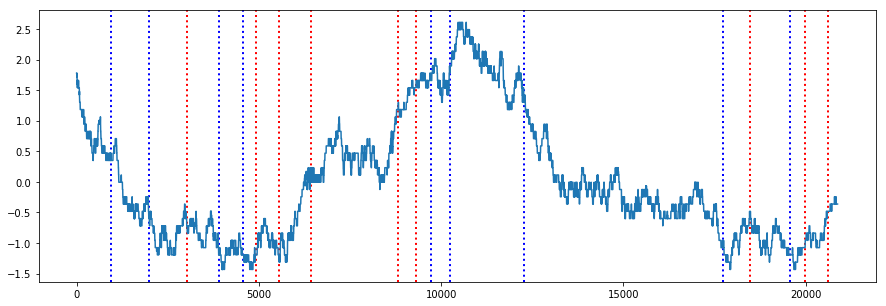

# Long  25750 25770 25740 25735
# Long Entry: 2016-10-21 09:10:04.205680 # Long Exit: 2016-10-21 09:10:04.250305 # Long_lower_threshold_profit: -10
#######################################################################################################
# Long  25730 25750 25720 25730
# Long Entry: 2016-10-21 09:30:01.696194 # Long Exit: 2016-10-21 09:32:22.683629 # Long_upper_threshold_profit: 20
#######################################################################################################
# Long  25730 25750 25720 25795
# Long Entry: 2016-10-21 09:42:09.035065 # Long Exit: 2016-10-21 09:47:58.372678 # Long_upper_threshold_profit: 20
#######################################################################################################
# Long  25785 25805 25775 25785
# Long Entry: 2016-10-21 09:48:46.340144 # Long Exit: 2016-10-21 09:48:55.951905 # Long_upper_threshold_profit: 20
###################################################################################################

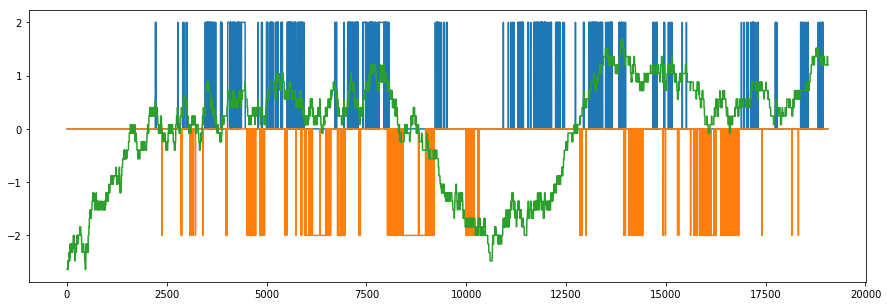

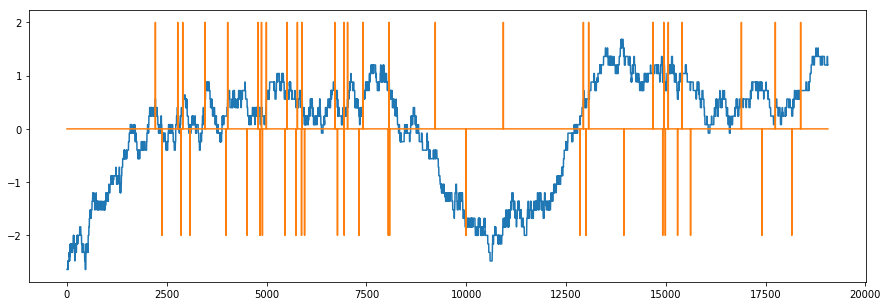

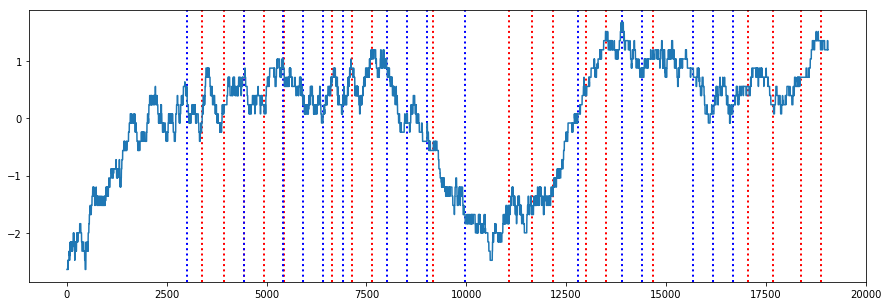

# Long  25905 25925 25895 25920
# Long Entry: 2016-10-24 09:19:32.212301 # Long Exit: 2016-10-24 09:20:01.206635 # Long_upper_threshold_profit: 20
#######################################################################################################
# Long  25920 25940 25910 25930
# Long Entry: 2016-10-24 09:24:28.454684 # Long Exit: 2016-10-24 09:32:50.123889 # Long_time_threshold_profit: 10
#######################################################################################################
# Long  25935 25955 25925 25920
# Long Entry: 2016-10-24 09:32:40.644908 # Long Exit: 2016-10-24 09:32:53.368131 # Long_lower_threshold_profit: -10
#######################################################################################################
# Long  25920 25940 25910 25925
# Long Entry: 2016-10-24 09:46:39.771888 # Long Exit: 2016-10-24 09:49:32.073200 # Long_upper_threshold_profit: 20
####################################################################################################

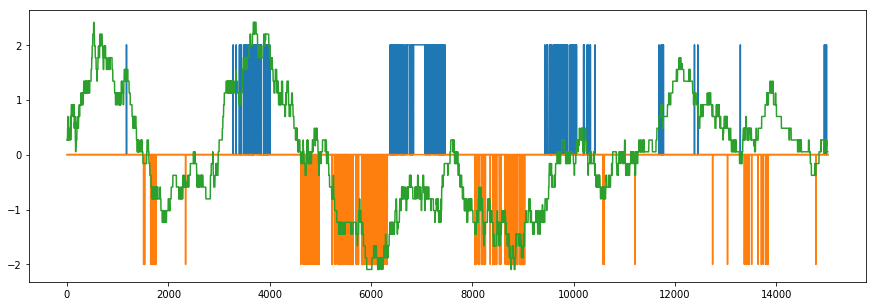

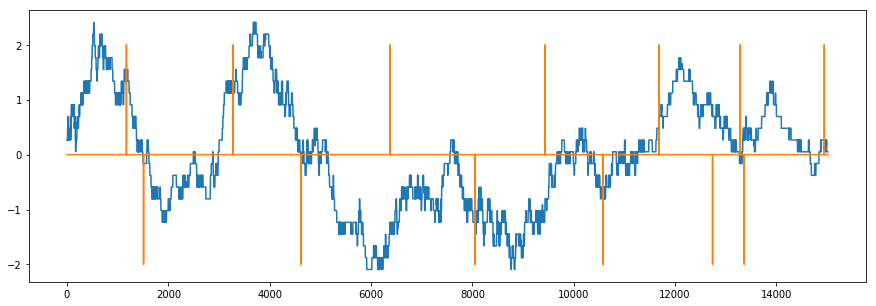

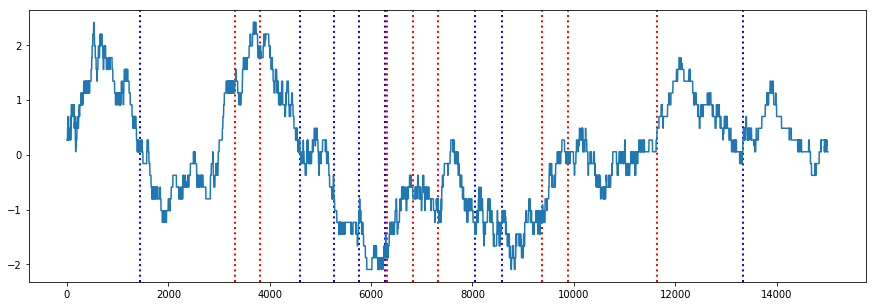

# Long  25915 25935 25905 25900
# Long Entry: 2016-10-25 09:23:08.172104 # Long Exit: 2016-10-25 09:23:38.176669 # Long_upper_threshold_profit: 20
#######################################################################################################
# Long  25925 25945 25915 25895
# Long Entry: 2016-10-25 09:23:47.729786 # Long Exit: 2016-10-25 09:24:22.998061 # Long_lower_threshold_profit: -10
#######################################################################################################
# Long  25840 25860 25830 25860
# Long Entry: 2016-10-25 09:56:10.523919 # Long Exit: 2016-10-25 09:59:09.331823 # Long_upper_threshold_profit: 20
#######################################################################################################
# Long  25870 25890 25860 25860
# Long Entry: 2016-10-25 10:03:47.761587 # Long Exit: 2016-10-25 10:04:01.524213 # Long_lower_threshold_profit: -10
##################################################################################################

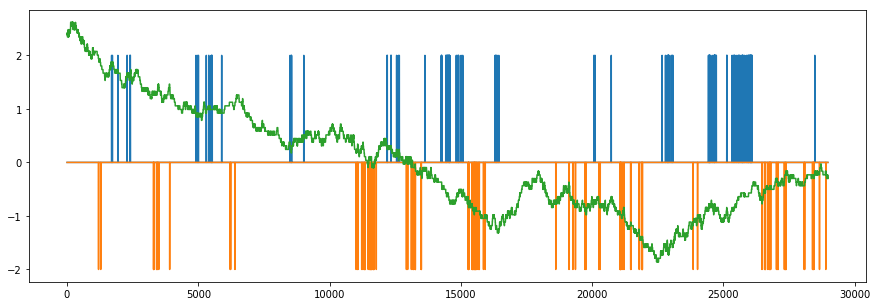

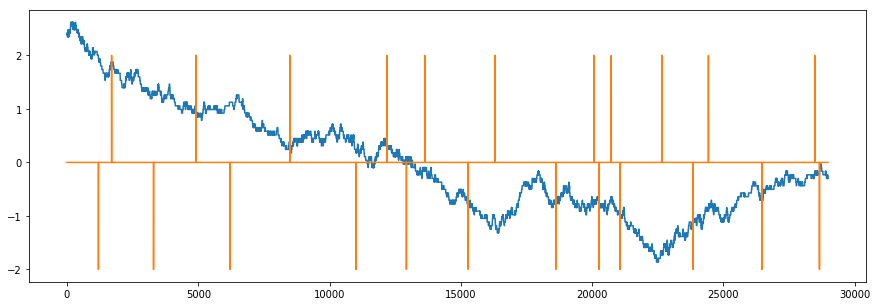

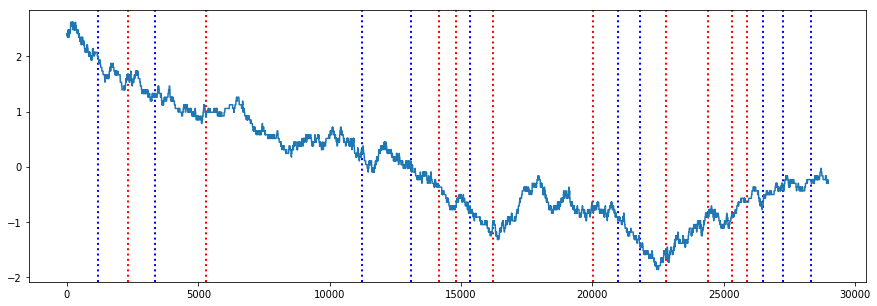

# Long  25705 25725 25695 25675
# Long Entry: 2016-10-26 09:06:33.575529 # Long Exit: 2016-10-26 09:06:33.587112 # Long_lower_threshold_profit: -10
#######################################################################################################
# Long  25650 25670 25640 25655
# Long Entry: 2016-10-26 09:23:32.849557 # Long Exit: 2016-10-26 09:31:53.441408 # Long_time_threshold_profit: 5
#######################################################################################################
# Long  25555 25575 25545 25535
# Long Entry: 2016-10-26 11:05:55.002449 # Long Exit: 2016-10-26 11:08:59.815735 # Long_lower_threshold_profit: -10
#######################################################################################################
# Long  25530 25550 25520 25515
# Long Entry: 2016-10-26 11:11:22.448014 # Long Exit: 2016-10-26 11:17:49.670173 # Long_lower_threshold_profit: -10
###################################################################################################

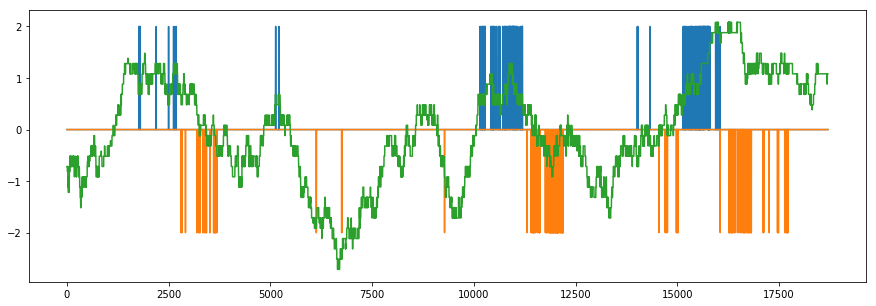

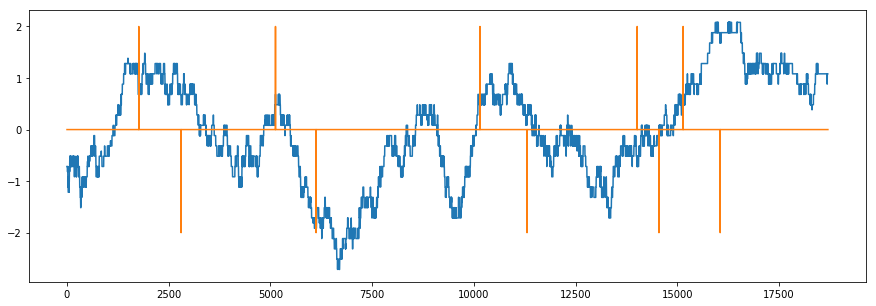

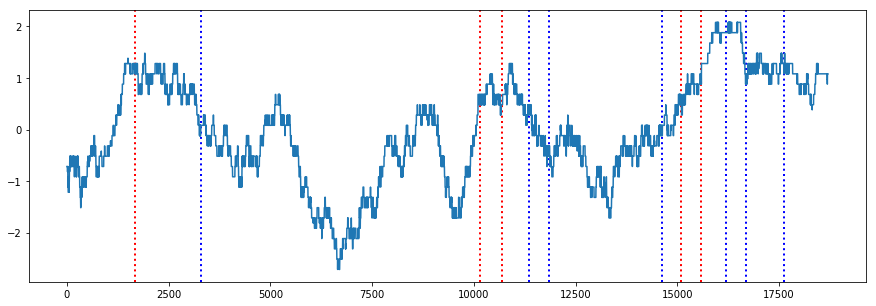

# Long  25690 25710 25680 25675
# Long Entry: 2016-10-27 09:06:08.469828 # Long Exit: 2016-10-27 09:06:27.629427 # Long_lower_threshold_profit: -10
#######################################################################################################
# Long  25675 25695 25665 25665
# Long Entry: 2016-10-27 10:53:44.518270 # Long Exit: 2016-10-27 10:55:46.129190 # Long_lower_threshold_profit: -10
#######################################################################################################
# Long  25675 25695 25665 25665
# Long Entry: 2016-10-27 10:55:58.283013 # Long Exit: 2016-10-27 11:01:26.191488 # Long_lower_threshold_profit: -10
#######################################################################################################
# Long  25675 25695 25665 25680
# Long Entry: 2016-10-27 14:02:17.034780 # Long Exit: 2016-10-27 14:02:30.115670 # Long_lower_threshold_profit: -10
################################################################################################

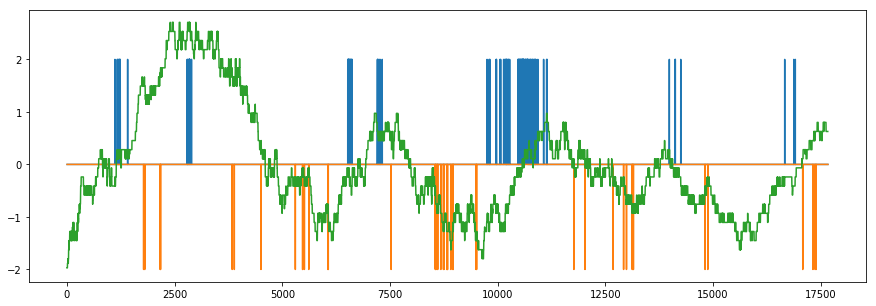

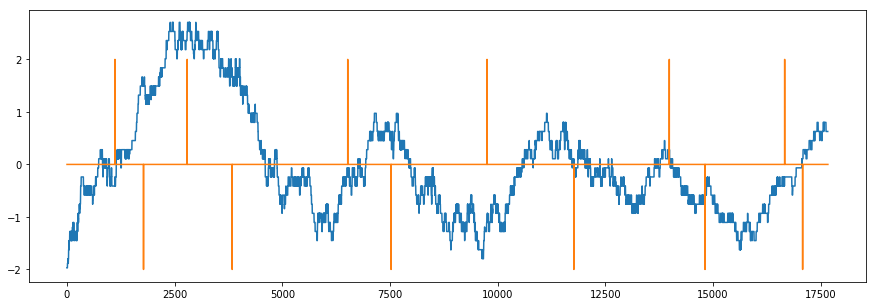

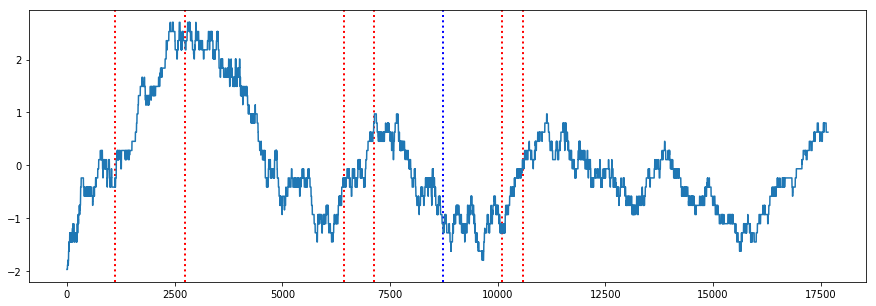

# Long  25670 25690 25660 25745
# Long Entry: 2016-10-28 09:04:14.002516 # Long Exit: 2016-10-28 09:08:23.712983 # Long_upper_threshold_profit: 20
#######################################################################################################
# Long  25750 25770 25740 25740
# Long Entry: 2016-10-28 09:12:01.994516 # Long Exit: 2016-10-28 09:12:05.496899 # Long_lower_threshold_profit: -10
#######################################################################################################
# Long  25675 25695 25665 25690
# Long Entry: 2016-10-28 09:44:58.710751 # Long Exit: 2016-10-28 09:52:03.356840 # Long_upper_threshold_profit: 20
#######################################################################################################
# Long  25700 25720 25690 25700
# Long Entry: 2016-10-28 09:52:17.724100 # Long Exit: 2016-10-28 09:52:36.625084 # Long_lower_threshold_profit: -10
##################################################################################################

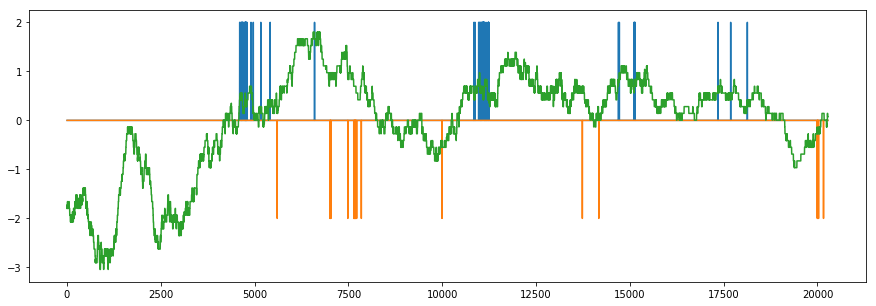

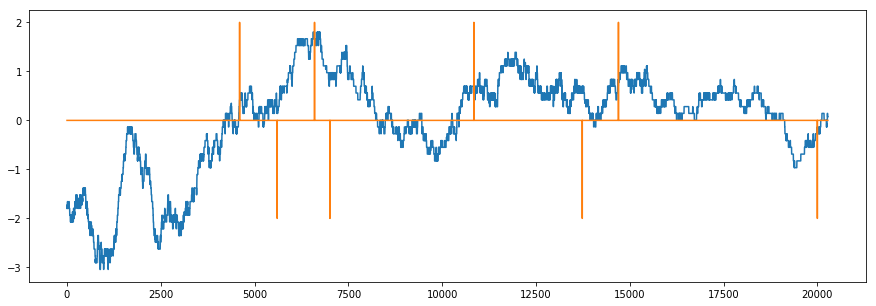

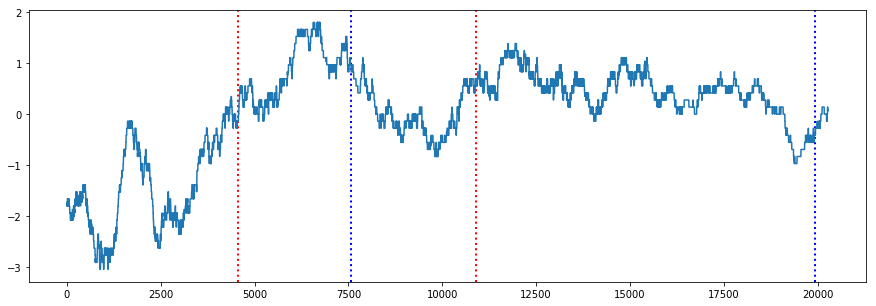

# Long  25635 25655 25625 25645
# Long Entry: 2016-10-31 09:13:33.588771 # Long Exit: 2016-10-31 09:13:49.167444 # Long_upper_threshold_profit: 20
#######################################################################################################
# Long  25660 25680 25650 25675
# Long Entry: 2016-10-31 10:28:06.940026 # Long Exit: 2016-10-31 10:31:14.169840 # Long_lower_threshold_profit: -10
#######################################################################################################
# Short  25670 25680 25650 25655
# Short Entry: 2016-10-31 09:47:03.641241 # Short Exit: 2016-10-31 09:52:35.748375 # Short_upper_threshold_profit: -10
#######################################################################################################
# Short  25620 25630 25600 25650
# Short Entry: 2016-10-31 15:31:35.306295 # Short Exit: 2016-10-31 15:31:39.290659 # Short_upper_threshold_profit: -10
#########################################################################################

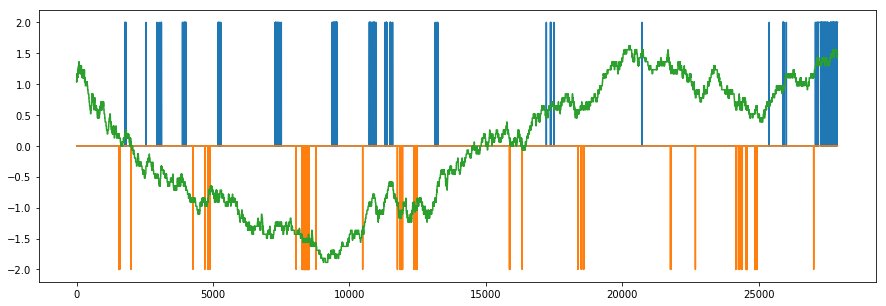

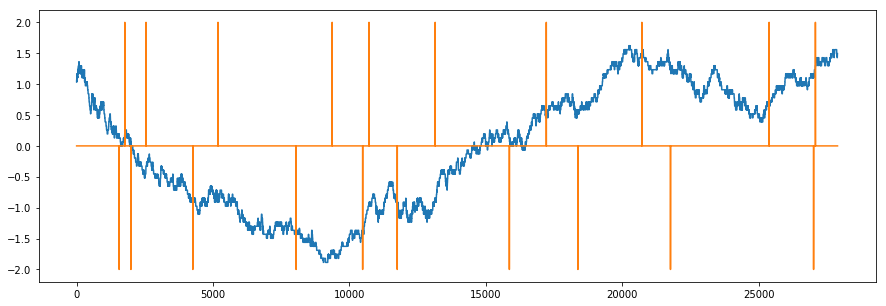

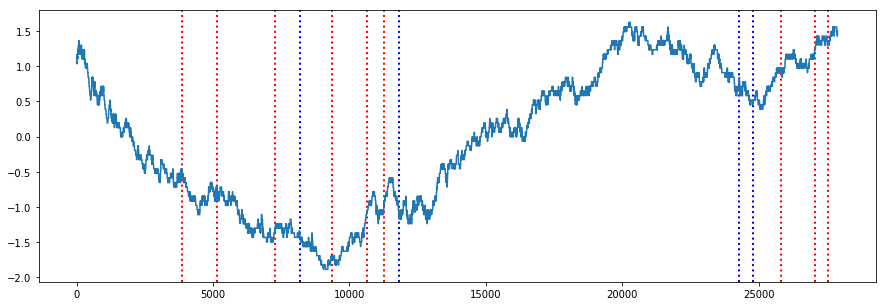

# Long  25495 25515 25485 25455
# Long Entry: 2016-11-01 09:08:48.036608 # Long Exit: 2016-11-01 09:08:48.044778 # Long_lower_threshold_profit: -10
#######################################################################################################
# Long  25470 25490 25460 25425
# Long Entry: 2016-11-01 09:12:40.772483 # Long Exit: 2016-11-01 09:12:40.772483 # Long_lower_threshold_profit: -10
#######################################################################################################
# Long  25425 25445 25415 25415
# Long Entry: 2016-11-01 09:28:39.471985 # Long Exit: 2016-11-01 09:31:05.781682 # Long_lower_threshold_profit: -10
#######################################################################################################
# Long  25395 25415 25385 25415
# Long Entry: 2016-11-01 09:52:16.208338 # Long Exit: 2016-11-01 10:00:10.760035 # Long_upper_threshold_profit: 20
#################################################################################################

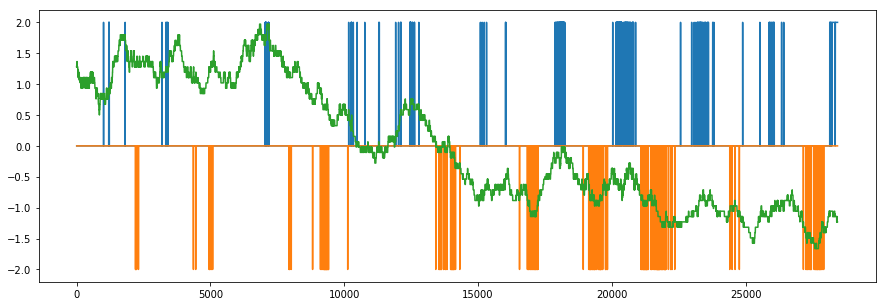

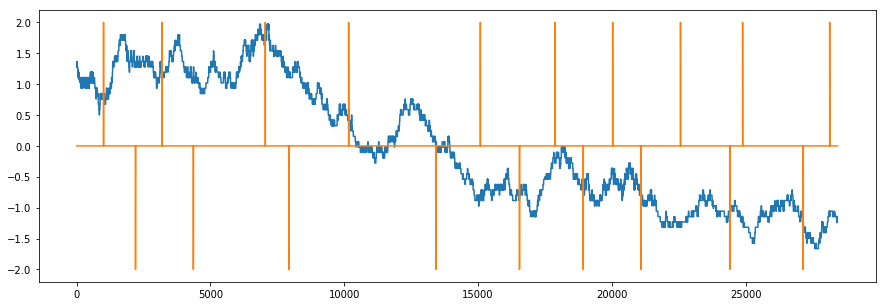

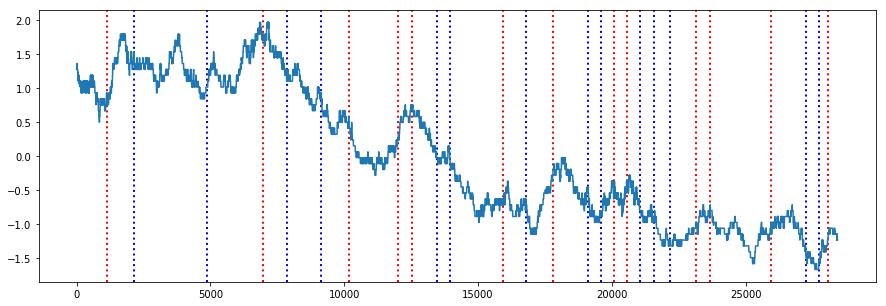

# Long  25435 25455 25425 25455
# Long Entry: 2016-11-02 09:01:46.521302 # Long Exit: 2016-11-02 09:02:22.593594 # Long_upper_threshold_profit: 20
#######################################################################################################
# Long  25480 25500 25470 25465
# Long Entry: 2016-11-02 09:48:49.729853 # Long Exit: 2016-11-02 09:49:15.405024 # Long_lower_threshold_profit: -10
#######################################################################################################
# Long  25410 25430 25400 25385
# Long Entry: 2016-11-02 10:25:50.570697 # Long Exit: 2016-11-02 10:25:53.316271 # Long_lower_threshold_profit: -10
#######################################################################################################
# Long  25395 25415 25385 25415
# Long Entry: 2016-11-02 10:36:28.181781 # Long Exit: 2016-11-02 10:37:33.455147 # Long_upper_threshold_profit: 20
##################################################################################################

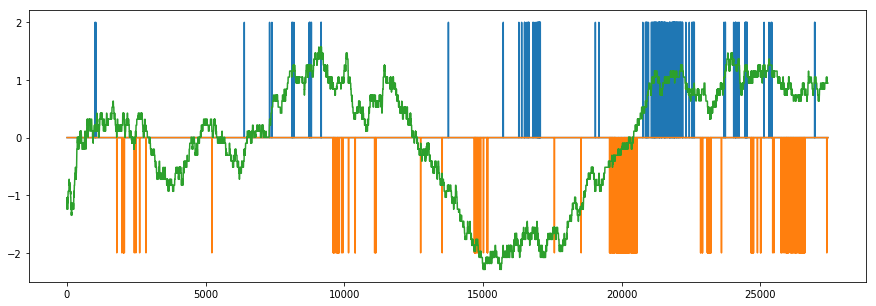

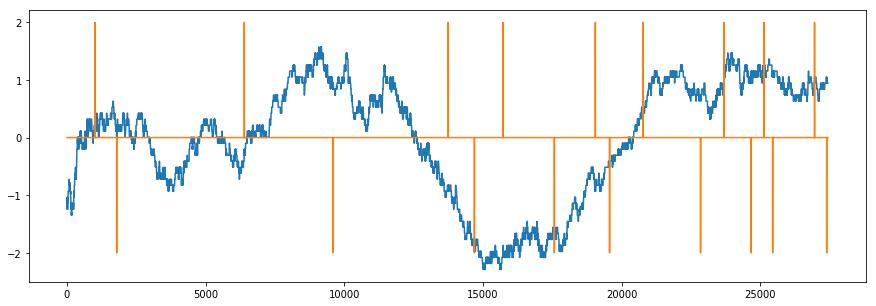

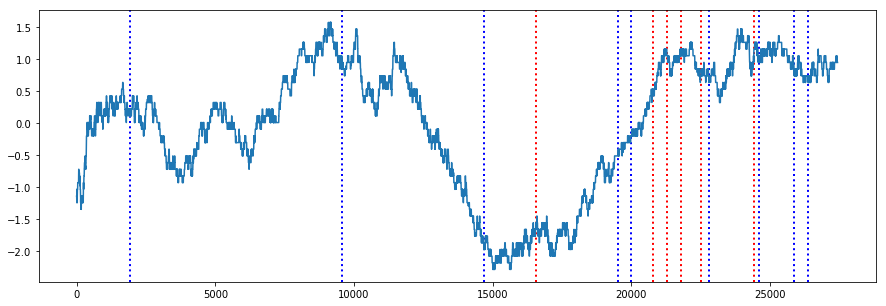

# Long  25245 25265 25235 25240
# Long Entry: 2016-11-03 12:22:48.840937 # Long Exit: 2016-11-03 12:24:24.519346 # Long_lower_threshold_profit: -10
#######################################################################################################
# Long  25350 25370 25340 25360
# Long Entry: 2016-11-03 13:29:02.824645 # Long Exit: 2016-11-03 13:29:46.270626 # Long_upper_threshold_profit: 20
#######################################################################################################
# Long  25380 25400 25370 25355
# Long Entry: 2016-11-03 13:30:11.020974 # Long Exit: 2016-11-03 13:30:11.244421 # Long_lower_threshold_profit: -10
#######################################################################################################
# Long  25375 25395 25365 25355
# Long Entry: 2016-11-03 13:32:19.873981 # Long Exit: 2016-11-03 13:32:54.268307 # Long_lower_threshold_profit: -10
#################################################################################################

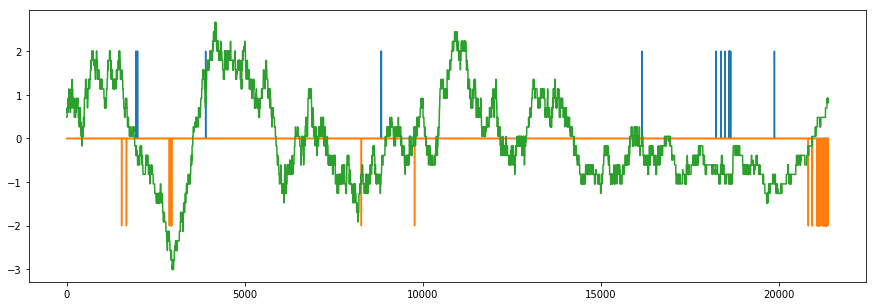

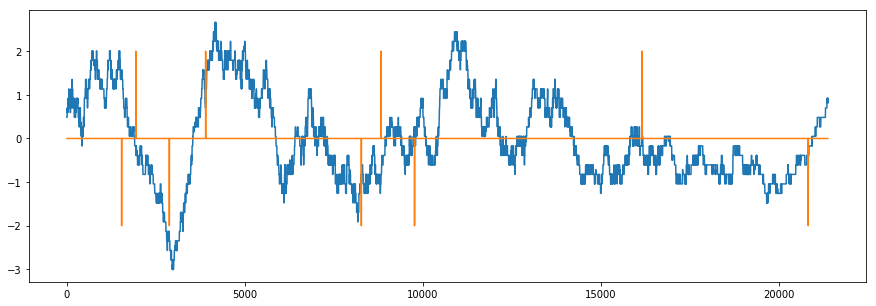

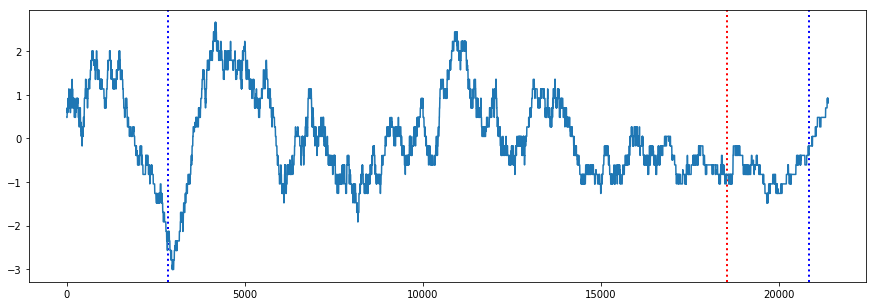

# Long  25280 25300 25270 25285
# Long Entry: 2016-11-04 14:20:05.317516 # Long Exit: 2016-11-04 14:24:20.346503 # Long_lower_threshold_profit: -10
#######################################################################################################
# Short  25240 25250 25220 25320
# Short Entry: 2016-11-04 09:14:58.476743 # Short Exit: 2016-11-04 09:14:58.476743 # Short_upper_threshold_profit: -10
#######################################################################################################
# Short  25285 25295 25265 25305
# Short Entry: 2016-11-04 15:30:00.674147 # Short Exit: 2016-11-04 15:30:00.695628 # Short_upper_threshold_profit: -10
#######################################################################################################
LONG P&L: -10 SHORT P&L: -20 TOTAL P&L: -30
#######################################################################################################
###############
Cum_Long_profit:  -290
Cum_Short_profit:  -970
###############
20161107 

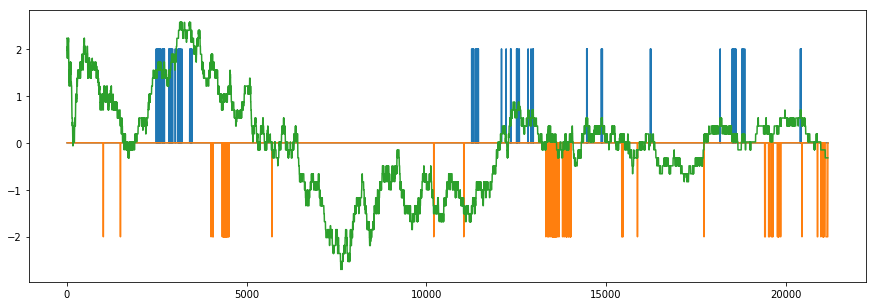

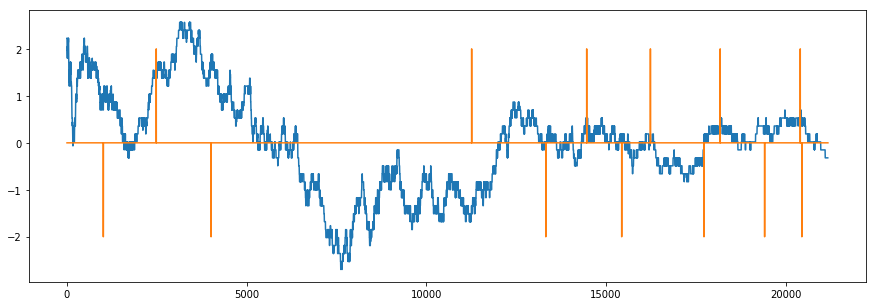

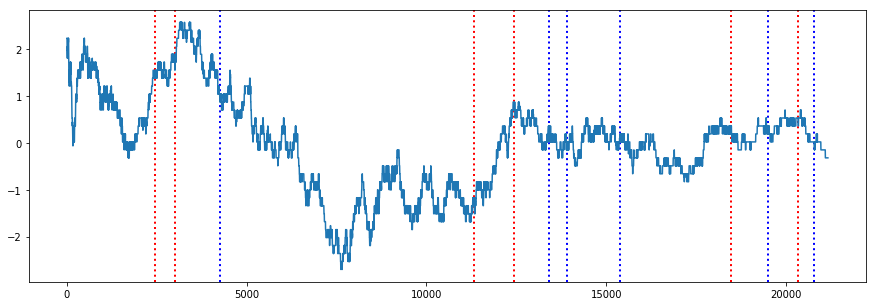

# Long  25555 25575 25545 25540
# Long Entry: 2016-11-07 09:04:02.694183 # Long Exit: 2016-11-07 09:05:23.580537 # Long_upper_threshold_profit: 20
#######################################################################################################
# Long  25565 25585 25555 25540
# Long Entry: 2016-11-07 09:05:16.863994 # Long Exit: 2016-11-07 09:05:32.020043 # Long_upper_threshold_profit: 20
#######################################################################################################
# Long  25480 25500 25470 25480
# Long Entry: 2016-11-07 10:30:48.695133 # Long Exit: 2016-11-07 10:30:48.695133 # Long_lower_threshold_profit: -10
#######################################################################################################
# Long  25535 25555 25525 25510
# Long Entry: 2016-11-07 10:45:44.500274 # Long Exit: 2016-11-07 10:45:48.919174 # Long_lower_threshold_profit: -10
##################################################################################################

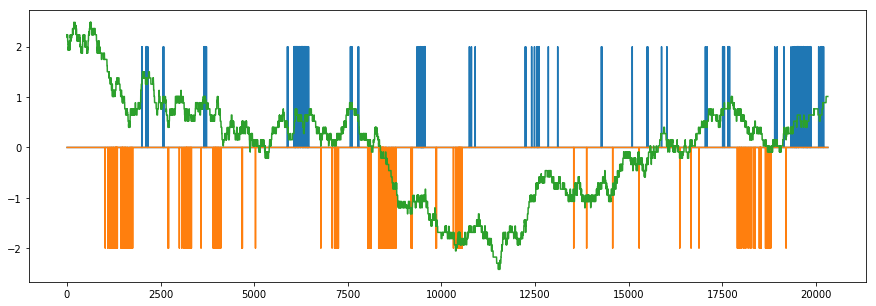

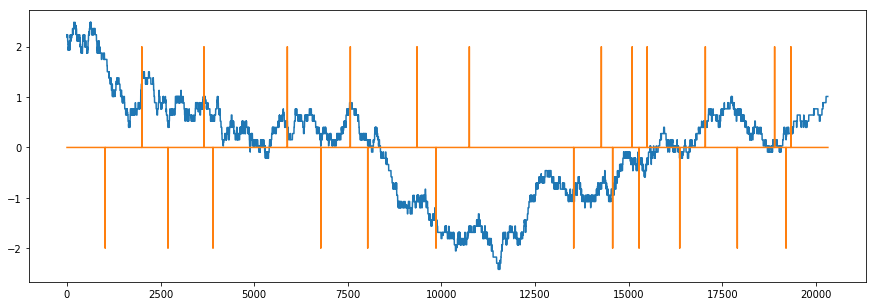

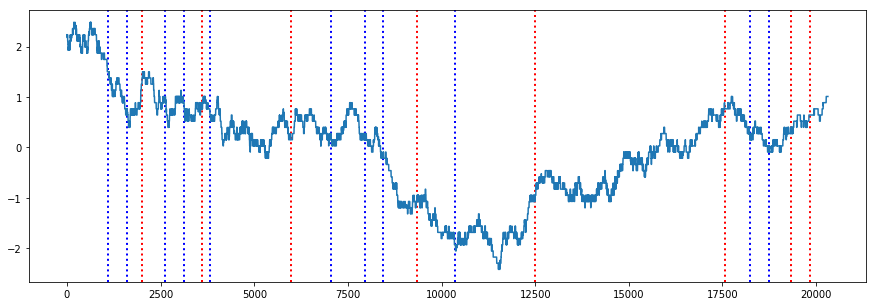

# Long  25595 25615 25585 25565
# Long Entry: 2016-11-08 09:05:27.538849 # Long Exit: 2016-11-08 09:05:38.229369 # Long_lower_threshold_profit: -10
#######################################################################################################
# Long  25575 25595 25565 25540
# Long Entry: 2016-11-08 09:17:44.848901 # Long Exit: 2016-11-08 09:17:51.931095 # Long_lower_threshold_profit: -10
#######################################################################################################
# Long  25550 25570 25540 25555
# Long Entry: 2016-11-08 09:45:46.554410 # Long Exit: 2016-11-08 09:45:52.471053 # Long_lower_threshold_profit: -10
#######################################################################################################
# Long  25495 25515 25485 25465
# Long Entry: 2016-11-08 10:39:17.830281 # Long Exit: 2016-11-08 10:39:44.706315 # Long_lower_threshold_profit: -10
################################################################################################

C:\Users\Jay\lib\site-packages\IPython\core\interactiveshell.py:2785: DtypeWarning: Columns (4) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


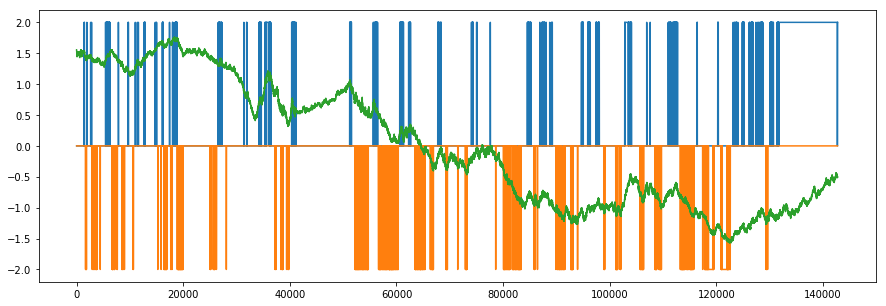

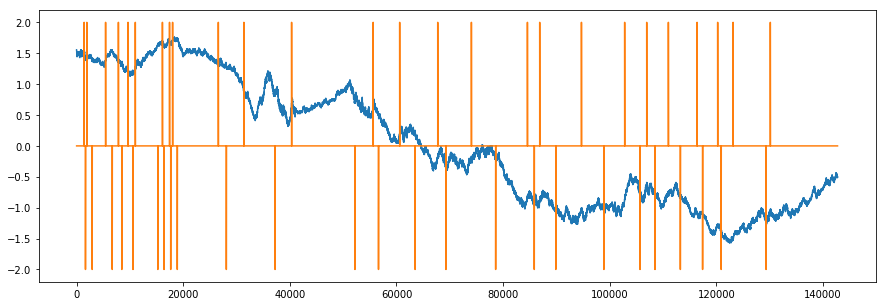

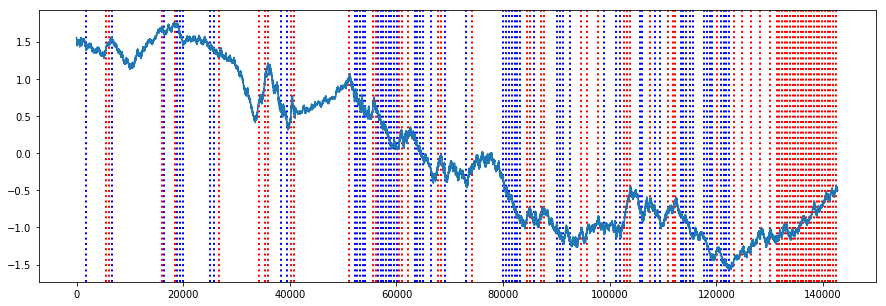

# Long  25635 25655 25625 25650
# Long Entry: 2016-11-09 09:26:02.406903 # Long Exit: 2016-11-09 09:27:11.393398 # Long_upper_threshold_profit: 20
#######################################################################################################
# Long  25655 25675 25645 25640
# Long Entry: 2016-11-09 09:27:36.887121 # Long Exit: 2016-11-09 09:29:55.474940 # Long_upper_threshold_profit: 20
#######################################################################################################
# Long  25720 25740 25710 25725
# Long Entry: 2016-11-09 10:01:19.067289 # Long Exit: 2016-11-09 10:01:32.839141 # Long_lower_threshold_profit: -10
#######################################################################################################
# Long  25735 25755 25725 25675
# Long Entry: 2016-11-09 10:10:28.668744 # Long Exit: 2016-11-09 10:10:29.173672 # Long_lower_threshold_profit: -10
##################################################################################################

# Short Entry: 2016-11-09 11:10:26.976444 # Short Exit: 2016-11-09 11:10:26.976444 # Short_upper_threshold_profit: -10
#######################################################################################################
# Short  25405 25415 25385 25330
# Short Entry: 2016-11-09 11:11:42.758811 # Short Exit: 2016-11-09 11:11:42.975655 # Short_upper_threshold_profit: -10
#######################################################################################################
# Short  25375 25385 25355 25310
# Short Entry: 2016-11-09 11:12:41.354056 # Short Exit: 2016-11-09 11:12:41.463341 # Short_upper_threshold_profit: -10
#######################################################################################################
# Short  25375 25385 25355 25315
# Short Entry: 2016-11-09 11:13:22.743565 # Short Exit: 2016-11-09 11:13:23.984624 # Short_upper_threshold_profit: -10
#######################################################################################################
# Short  

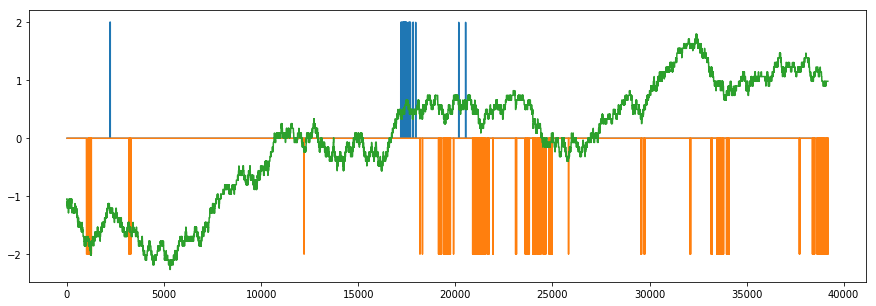

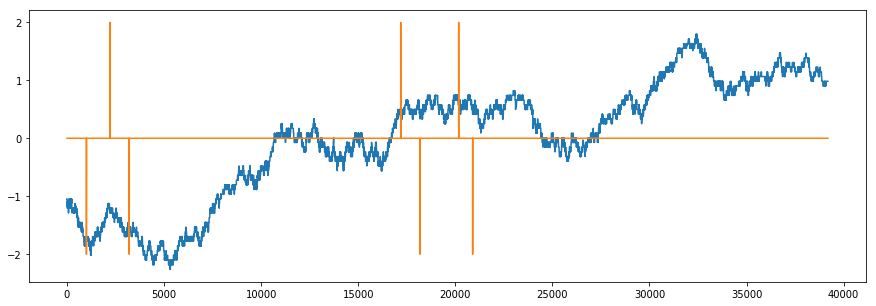

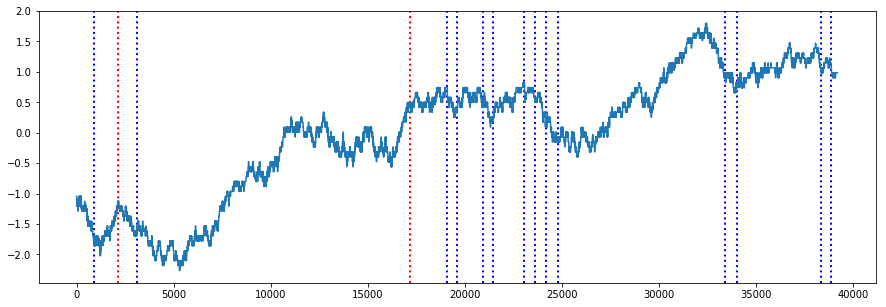

# Long  25385 25405 25375 25335
# Long Entry: 2016-11-10 09:03:55.474387 # Long Exit: 2016-11-10 09:03:55.482458 # Long_lower_threshold_profit: -10
#######################################################################################################
# Long  25485 25505 25475 25480
# Long Entry: 2016-11-10 10:37:53.779010 # Long Exit: 2016-11-10 10:38:01.232643 # Long_lower_threshold_profit: -10
#######################################################################################################
# Short  25335 25345 25315 25355
# Short Entry: 2016-11-10 09:01:18.988154 # Short Exit: 2016-11-10 09:01:19.038182 # Short_upper_threshold_profit: -10
#######################################################################################################
# Short  25355 25365 25335 25335
# Short Entry: 2016-11-10 09:07:22.081156 # Short Exit: 2016-11-10 09:07:41.261495 # Short_upper_threshold_profit: -10
########################################################################################

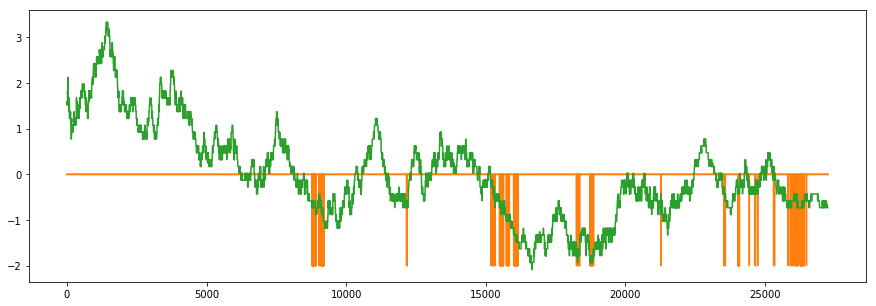

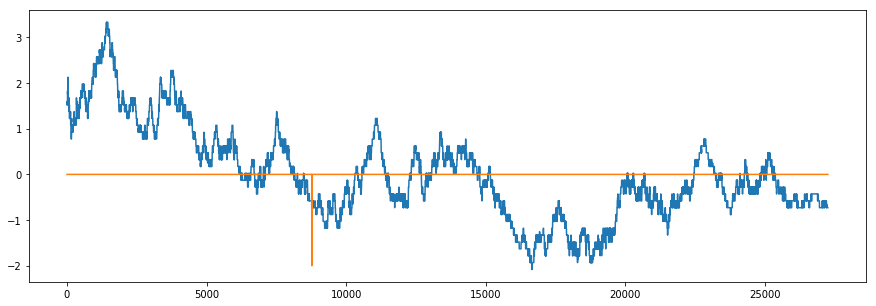

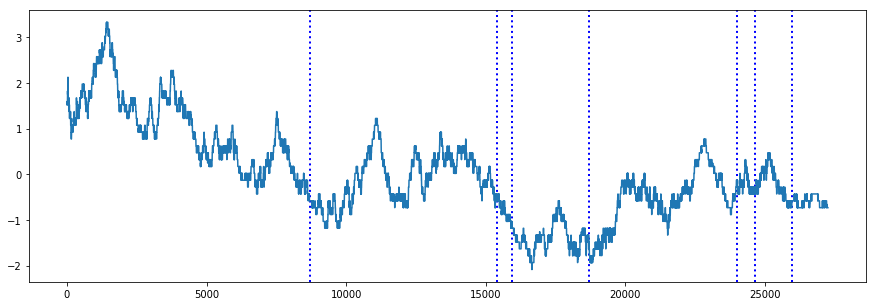

# Short  25265 25275 25245 25250
# Short Entry: 2016-11-11 09:48:02.226319 # Short Exit: 2016-11-11 09:50:32.377706 # Short_upper_threshold_profit: -10
#######################################################################################################
# Short  25265 25275 25245 25230
# Short Entry: 2016-11-11 10:57:50.704650 # Short Exit: 2016-11-11 10:58:26.494557 # Short_upper_threshold_profit: -10
#######################################################################################################
# Short  25245 25255 25225 25240
# Short Entry: 2016-11-11 11:03:00.613354 # Short Exit: 2016-11-11 11:03:00.621031 # Short_upper_threshold_profit: -10
#######################################################################################################
# Short  25240 25250 25220 25245
# Short Entry: 2016-11-11 11:33:52.397137 # Short Exit: 2016-11-11 11:42:33.594707 # Short_time_threshold_profit: -5
##################################################################################

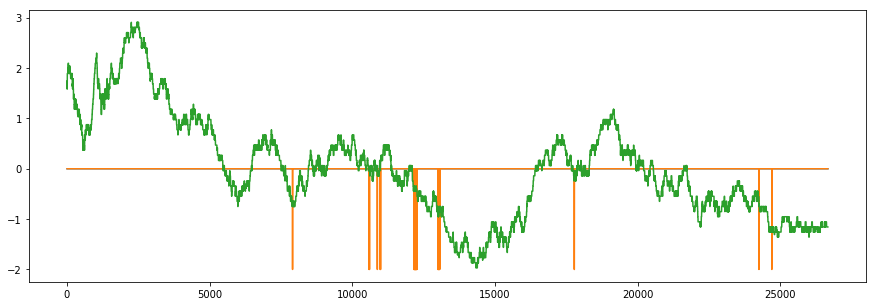

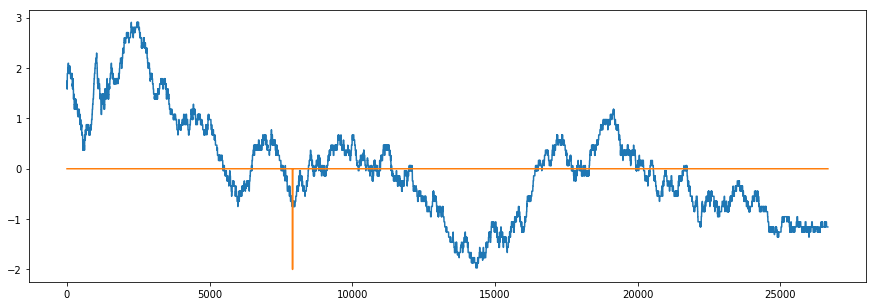

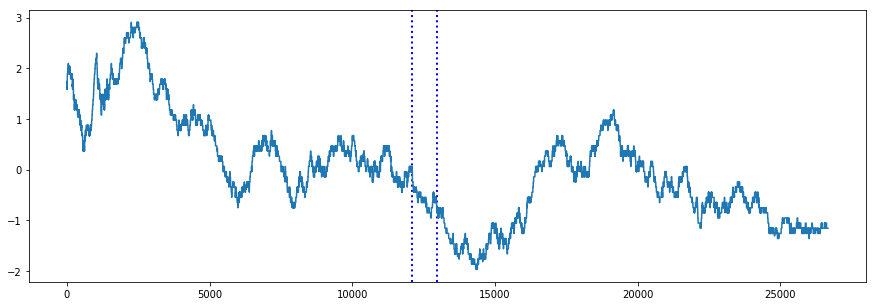

# Short  25130 25140 25110 25110
# Short Entry: 2016-11-14 10:41:25.185877 # Short Exit: 2016-11-14 10:41:45.194678 # Short_upper_threshold_profit: -10
#######################################################################################################
# Short  25095 25105 25075 25050
# Short Entry: 2016-11-14 10:51:46.887946 # Short Exit: 2016-11-14 10:55:15.294538 # Short_lower_threshold_profit: 20
#######################################################################################################
LONG P&L: 0.0 SHORT P&L: 10 TOTAL P&L: 10.0
#######################################################################################################
###############
Cum_Long_profit:  405.0
Cum_Short_profit:  -1695
###############
20161115 1.33 -0.583


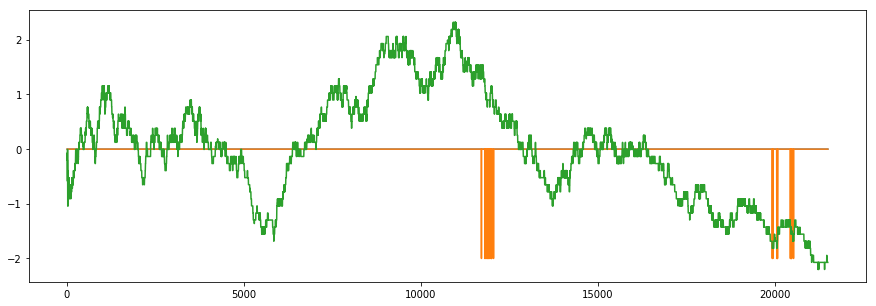

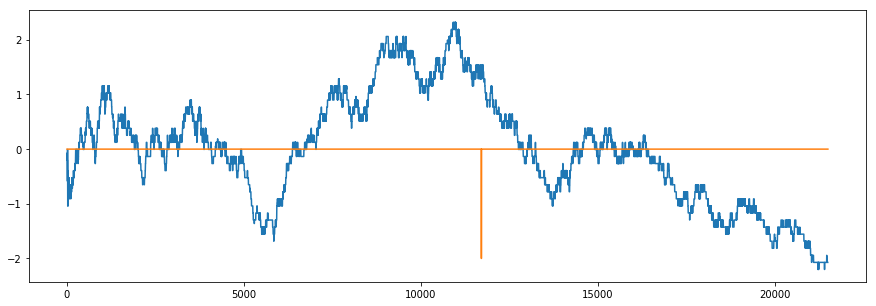

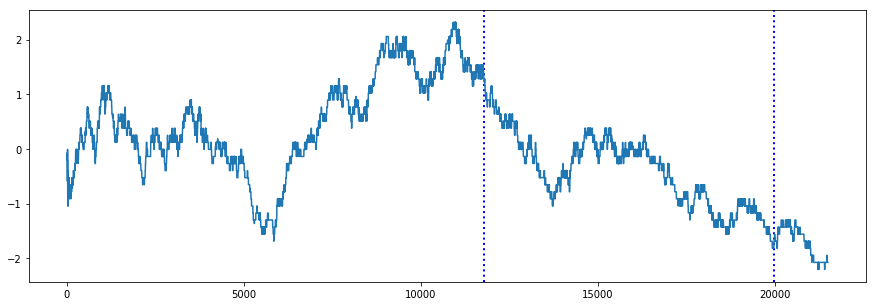

# Short  25090 25100 25070 25065
# Short Entry: 2016-11-15 11:00:00.203182 # Short Exit: 2016-11-15 11:04:18.721372 # Short_lower_threshold_profit: 20
#######################################################################################################
# Short  24970 24980 24950 24990
# Short Entry: 2016-11-15 15:12:07.678354 # Short Exit: 2016-11-15 15:12:17.145504 # Short_upper_threshold_profit: -10
#######################################################################################################
LONG P&L: 0.0 SHORT P&L: 10 TOTAL P&L: 10.0
#######################################################################################################
###############
Cum_Long_profit:  405.0
Cum_Short_profit:  -1685
###############
20161116 1.35 -0.576


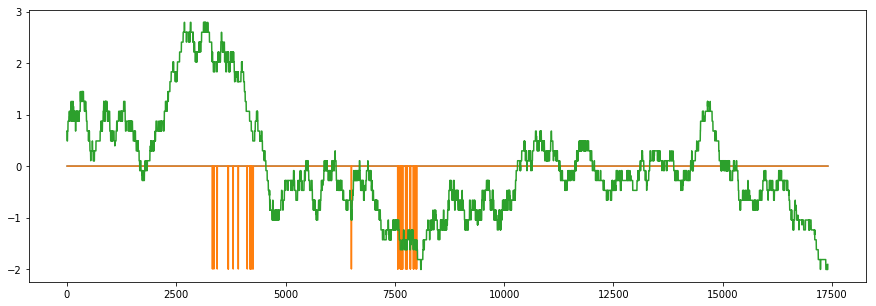

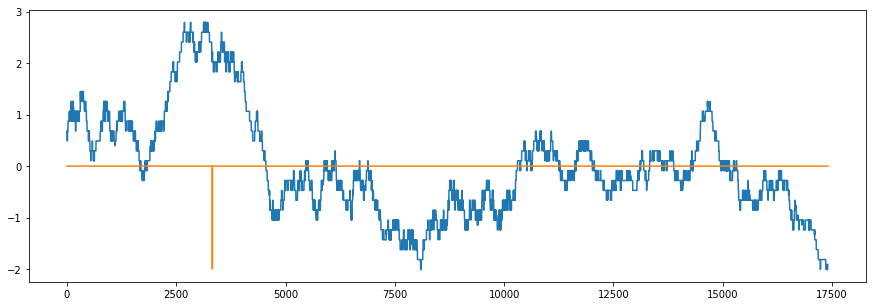

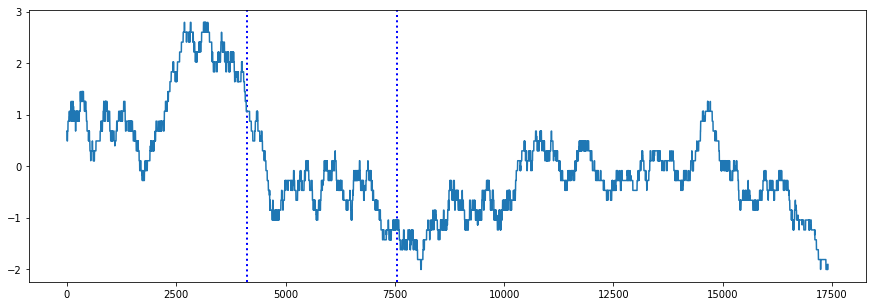

# Short  25120 25130 25100 25085
# Short Entry: 2016-11-16 09:33:59.208592 # Short Exit: 2016-11-16 09:36:40.286644 # Short_lower_threshold_profit: 20
#######################################################################################################
# Short  25065 25075 25045 25050
# Short Entry: 2016-11-16 10:11:36.048009 # Short Exit: 2016-11-16 10:19:57.708493 # Short_time_threshold_profit: 15
#######################################################################################################
LONG P&L: 0.0 SHORT P&L: 35 TOTAL P&L: 35.0
#######################################################################################################
###############
Cum_Long_profit:  405.0
Cum_Short_profit:  -1650
###############
20161117 1.37 -0.571


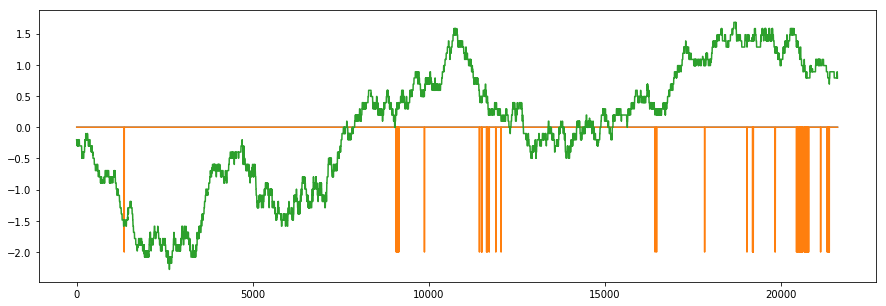

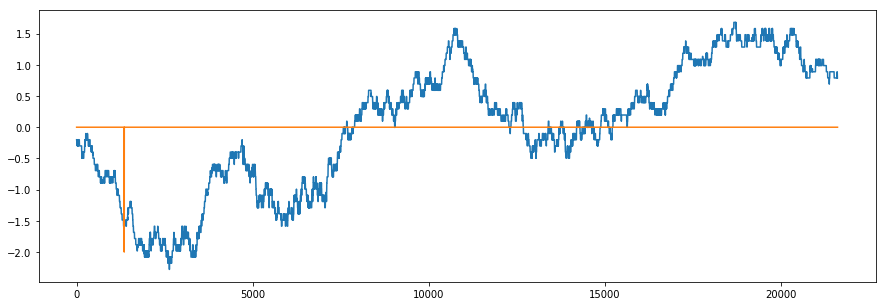

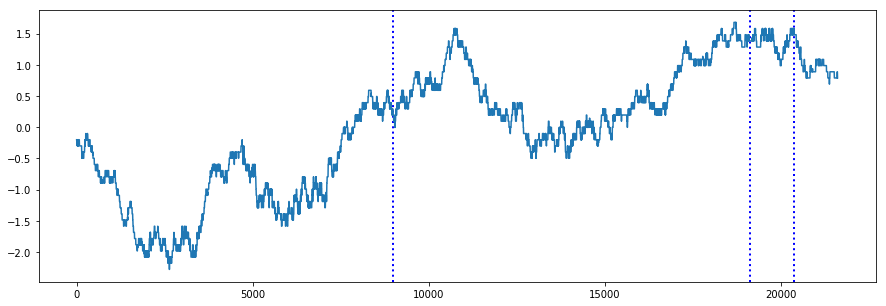

# Short  25005 25015 24985 25040
# Short Entry: 2016-11-17 10:44:45.470827 # Short Exit: 2016-11-17 10:45:04.474671 # Short_upper_threshold_profit: -10
#######################################################################################################
# Short  25065 25075 25045 25070
# Short Entry: 2016-11-17 15:04:37.558652 # Short Exit: 2016-11-17 15:10:43.500861 # Short_upper_threshold_profit: -10
#######################################################################################################
# Short  25070 25080 25050 25065
# Short Entry: 2016-11-17 15:54:30.655865 # Short Exit: 2016-11-17 16:02:51.971494 # Short_time_threshold_profit: 5
#######################################################################################################
LONG P&L: 0.0 SHORT P&L: -15 TOTAL P&L: -15.0
#######################################################################################################
###############
Cum_Long_profit:  405.0
Cum_Short_profit:  -1665
###############
2016

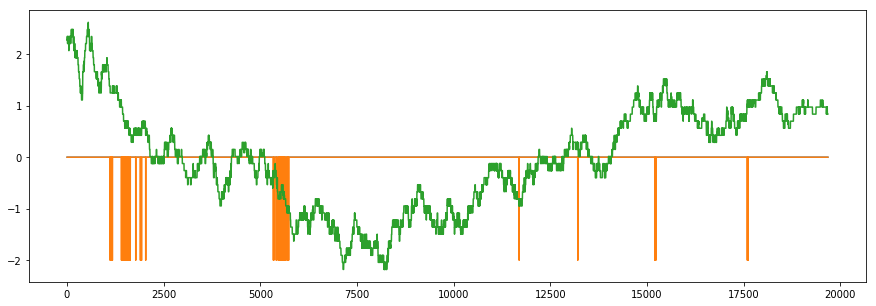

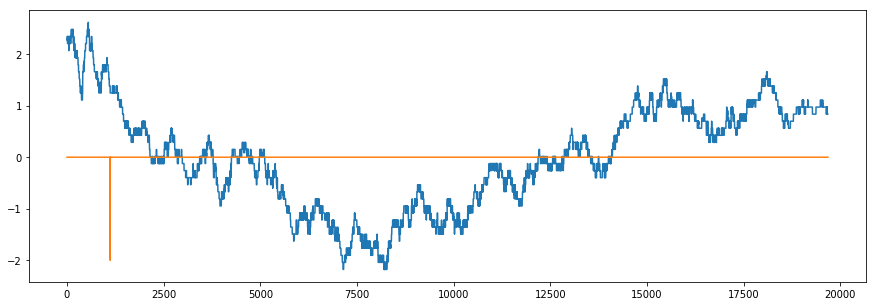

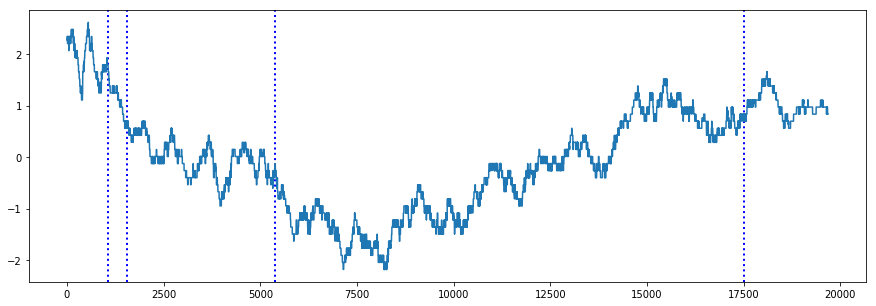

# Short  25075 25085 25055 25025
# Short Entry: 2016-11-18 09:03:17.934297 # Short Exit: 2016-11-18 09:05:58.164226 # Short_lower_threshold_profit: 20
#######################################################################################################
# Short  25035 25045 25015 25015
# Short Entry: 2016-11-18 09:06:21.795907 # Short Exit: 2016-11-18 09:09:00.580275 # Short_lower_threshold_profit: 20
#######################################################################################################
# Short  25000 25010 24980 24970
# Short Entry: 2016-11-18 09:45:01.369446 # Short Exit: 2016-11-18 09:45:01.413718 # Short_upper_threshold_profit: -10
#######################################################################################################
# Short  25040 25050 25020 25055
# Short Entry: 2016-11-18 14:41:07.983671 # Short Exit: 2016-11-18 14:43:58.932245 # Short_upper_threshold_profit: -10
##################################################################################

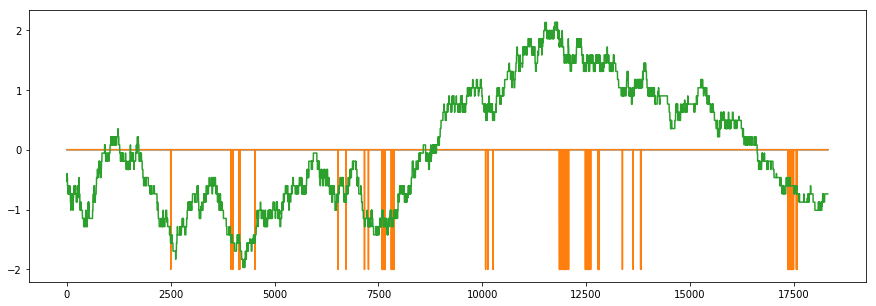

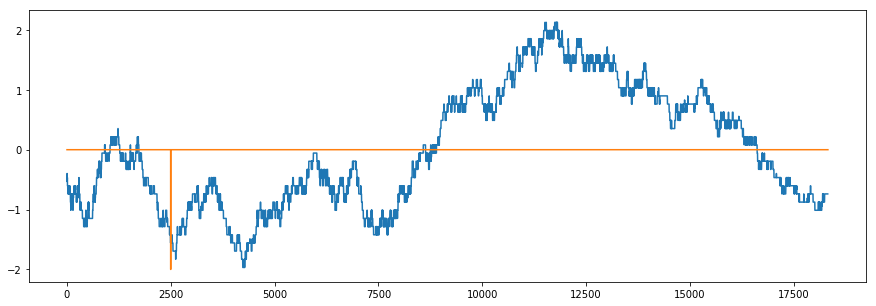

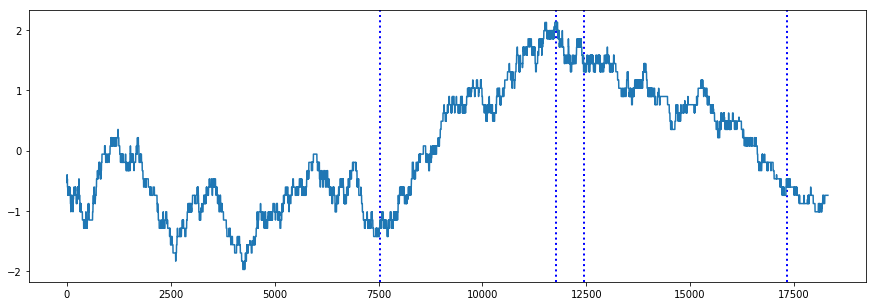

# Short  24950 24960 24930 24965
# Short Entry: 2016-11-21 10:24:26.641882 # Short Exit: 2016-11-21 10:24:26.653044 # Short_upper_threshold_profit: -10
#######################################################################################################
# Short  25075 25085 25055 25060
# Short Entry: 2016-11-21 11:24:00.884419 # Short Exit: 2016-11-21 11:28:25.792659 # Short_lower_threshold_profit: 20
#######################################################################################################
# Short  25045 25055 25025 25060
# Short Entry: 2016-11-21 11:43:25.331306 # Short Exit: 2016-11-21 11:43:25.405669 # Short_upper_threshold_profit: -10
#######################################################################################################
# Short  24975 24985 24955 24975
# Short Entry: 2016-11-21 15:15:36.191457 # Short Exit: 2016-11-21 15:15:36.512693 # Short_upper_threshold_profit: -10
#################################################################################

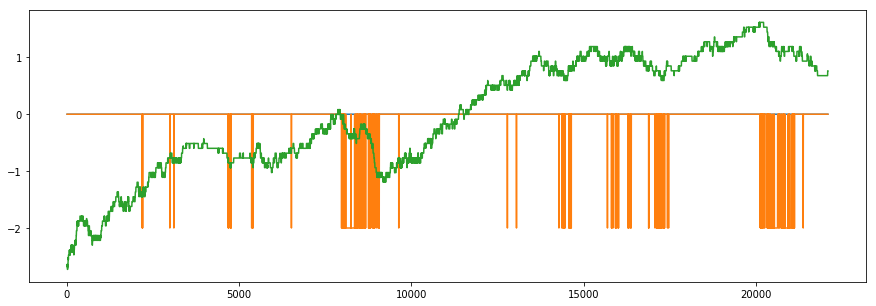

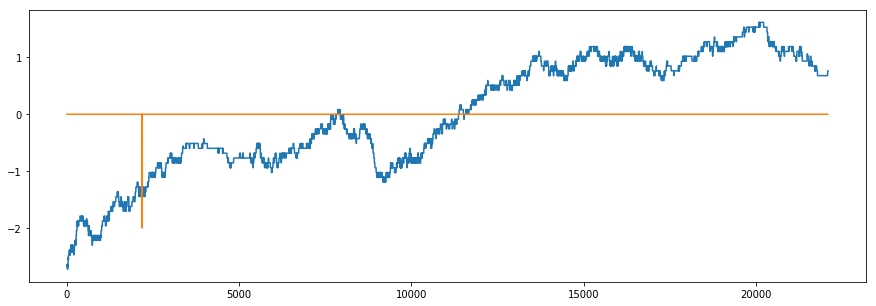

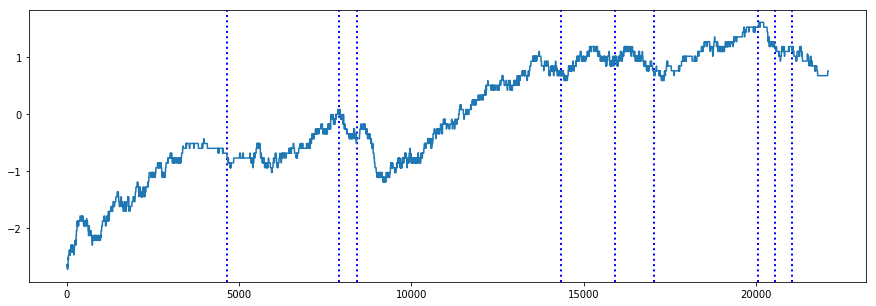

# Short  25160 25170 25140 25155
# Short Entry: 2016-11-22 09:16:35.398105 # Short Exit: 2016-11-22 09:17:02.351972 # Short_upper_threshold_profit: -10
#######################################################################################################
# Short  25205 25215 25185 25185
# Short Entry: 2016-11-22 09:52:37.558825 # Short Exit: 2016-11-22 09:52:40.079009 # Short_upper_threshold_profit: -10
#######################################################################################################
# Short  25180 25190 25160 25185
# Short Entry: 2016-11-22 10:01:18.149308 # Short Exit: 2016-11-22 10:03:23.651317 # Short_upper_threshold_profit: -10
#######################################################################################################
# Short  25245 25255 25225 25265
# Short Entry: 2016-11-22 11:26:42.872007 # Short Exit: 2016-11-22 11:26:42.872007 # Short_upper_threshold_profit: -10
################################################################################

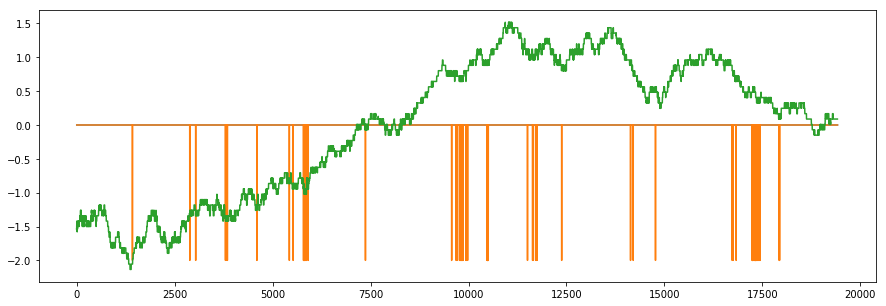

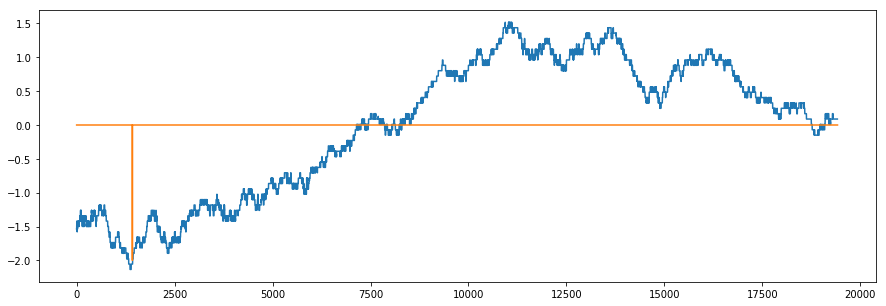

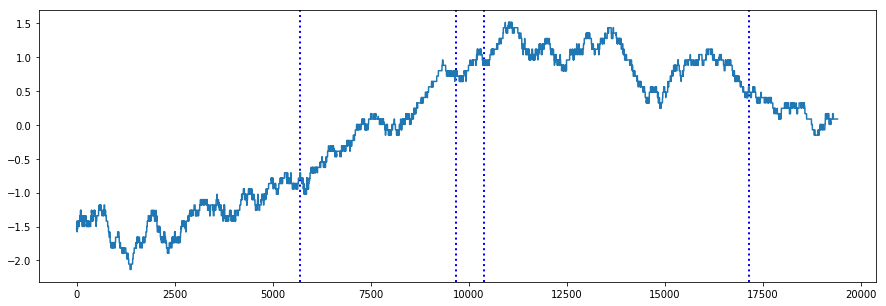

# Short  25320 25330 25300 25330
# Short Entry: 2016-11-23 10:15:12.017751 # Short Exit: 2016-11-23 10:19:40.796889 # Short_upper_threshold_profit: -10
#######################################################################################################
# Short  25415 25425 25395 25425
# Short Entry: 2016-11-23 11:13:17.920476 # Short Exit: 2016-11-23 11:21:02.474771 # Short_upper_threshold_profit: -10
#######################################################################################################
# Short  25420 25430 25400 25450
# Short Entry: 2016-11-23 11:26:17.959244 # Short Exit: 2016-11-23 11:26:30.846622 # Short_upper_threshold_profit: -10
#######################################################################################################
# Short  25400 25410 25380 25395
# Short Entry: 2016-11-23 14:48:35.195598 # Short Exit: 2016-11-23 14:56:58.278702 # Short_time_threshold_profit: 5
###################################################################################

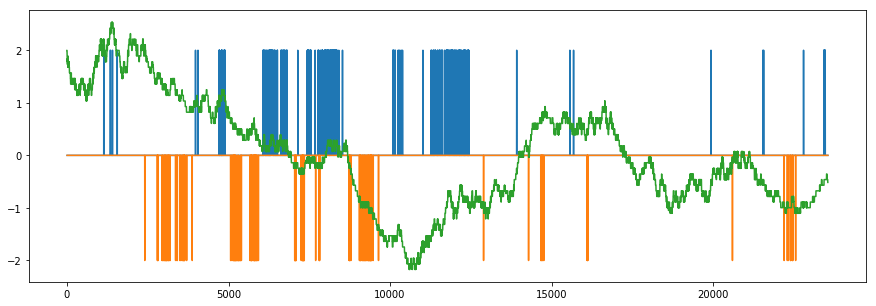

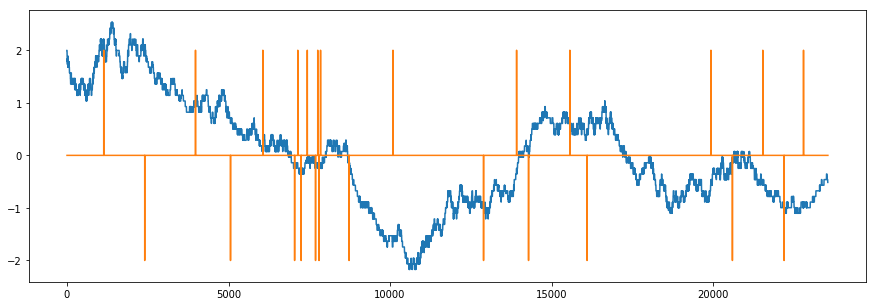

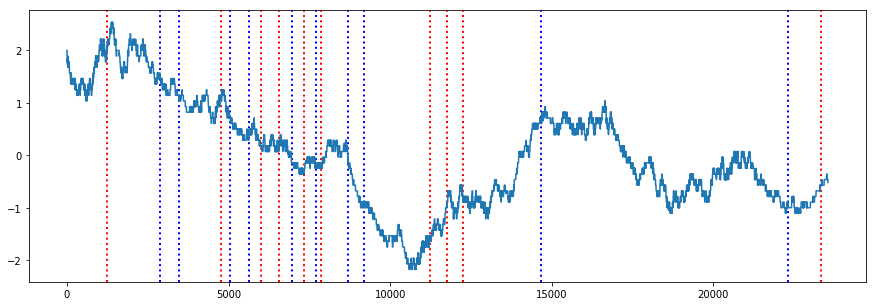

# Long  25365 25385 25355 25365
# Long Entry: 2016-11-24 09:04:55.672331 # Long Exit: 2016-11-24 09:05:10.464865 # Long_upper_threshold_profit: 20
#######################################################################################################
# Long  25320 25340 25310 25285
# Long Entry: 2016-11-24 09:40:30.879246 # Long Exit: 2016-11-24 09:41:38.495538 # Long_lower_threshold_profit: -10
#######################################################################################################
# Long  25280 25300 25270 25280
# Long Entry: 2016-11-24 09:54:01.524795 # Long Exit: 2016-11-24 09:54:21.558035 # Long_lower_threshold_profit: -10
#######################################################################################################
# Long  25275 25295 25265 25250
# Long Entry: 2016-11-24 10:01:43.738660 # Long Exit: 2016-11-24 10:06:01.003690 # Long_lower_threshold_profit: -10
#################################################################################################

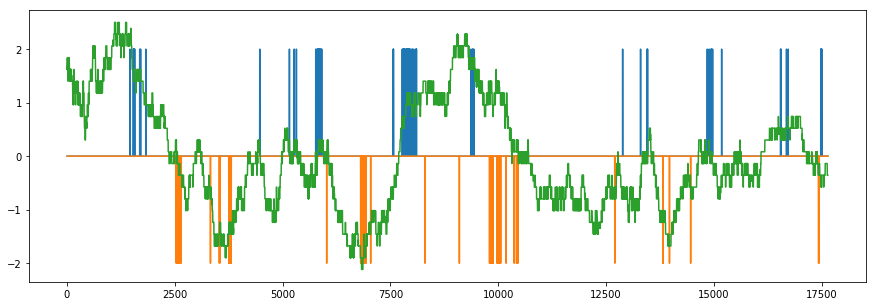

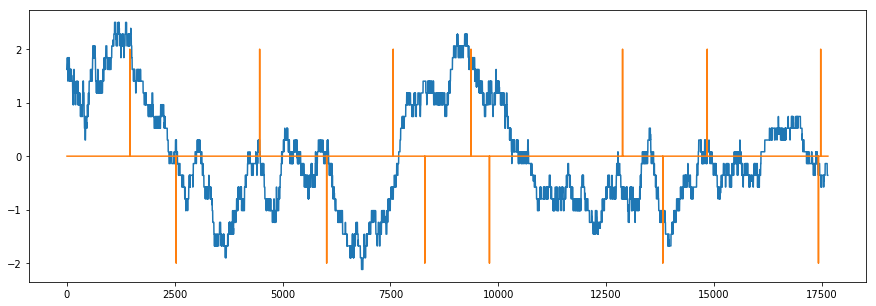

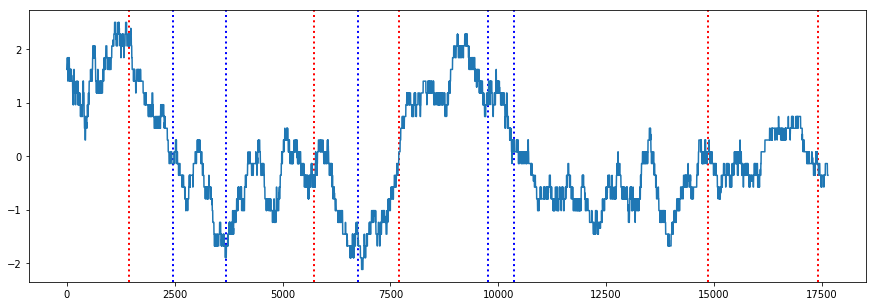

# Long  25290 25310 25280 25260
# Long Entry: 2016-11-25 09:09:18.152230 # Long Exit: 2016-11-25 09:10:23.310245 # Long_lower_threshold_profit: -10
#######################################################################################################
# Long  25230 25250 25220 25235
# Long Entry: 2016-11-25 10:08:07.620111 # Long Exit: 2016-11-25 10:16:29.675465 # Long_time_threshold_profit: 5
#######################################################################################################
# Long  25245 25265 25235 25260
# Long Entry: 2016-11-25 10:36:53.956592 # Long Exit: 2016-11-25 10:37:04.271673 # Long_upper_threshold_profit: 20
#######################################################################################################
# Long  25245 25265 25235 25230
# Long Entry: 2016-11-25 13:47:57.532945 # Long Exit: 2016-11-25 13:49:59.856946 # Long_lower_threshold_profit: -10
####################################################################################################

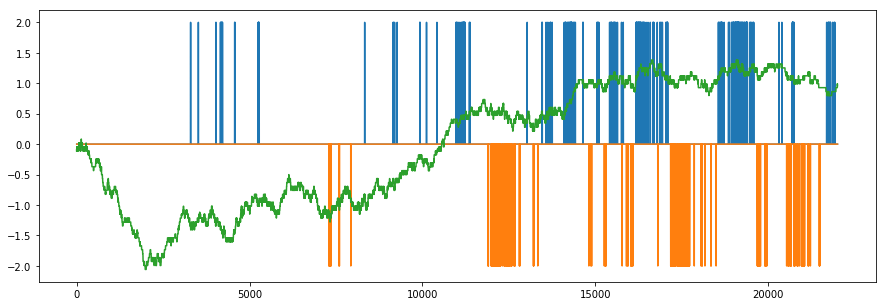

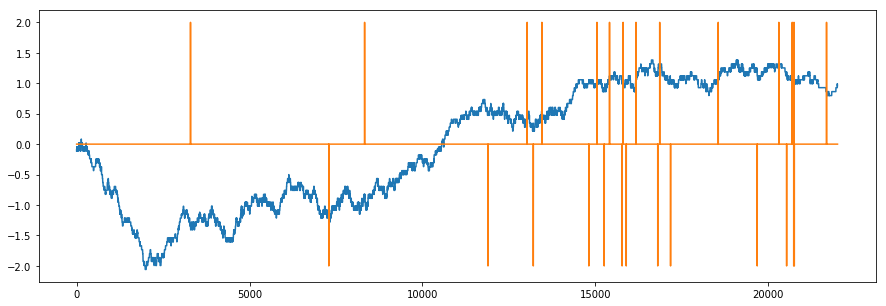

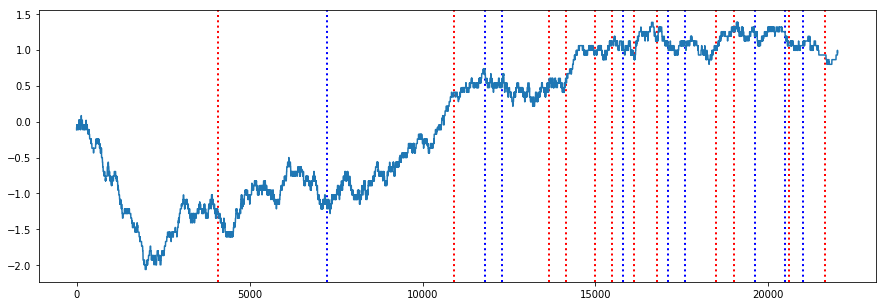

# Long  25145 25165 25135 25170
# Long Entry: 2016-11-28 09:13:08.804963 # Long Exit: 2016-11-28 09:19:02.027111 # Long_upper_threshold_profit: 20
#######################################################################################################
# Long  25275 25295 25265 25275
# Long Entry: 2016-11-28 10:34:00.815489 # Long Exit: 2016-11-28 10:39:20.818758 # Long_upper_threshold_profit: 20
#######################################################################################################
# Long  25280 25300 25270 25280
# Long Entry: 2016-11-28 11:09:50.609188 # Long Exit: 2016-11-28 11:18:11.089756 # Long_time_threshold_profit: 0
#######################################################################################################
# Long  25290 25310 25280 25315
# Long Entry: 2016-11-28 11:21:08.763904 # Long Exit: 2016-11-28 11:22:53.576188 # Long_upper_threshold_profit: 20
######################################################################################################

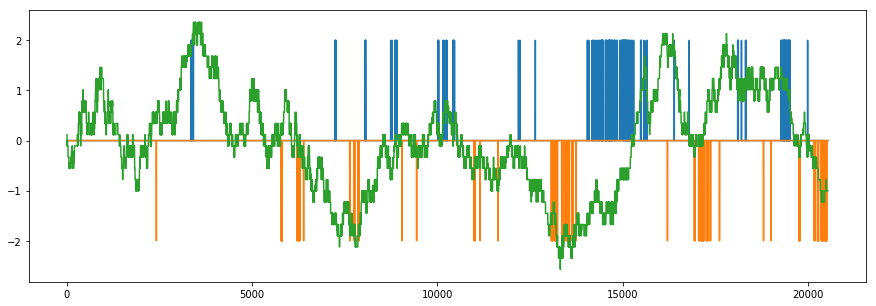

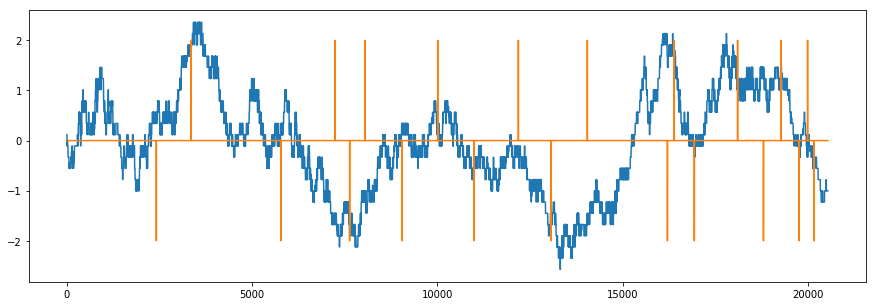

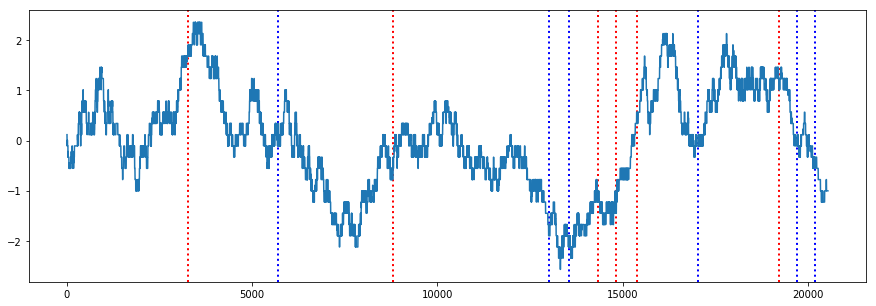

# Long  25350 25370 25340 25310
# Long Entry: 2016-11-29 09:21:22.952497 # Long Exit: 2016-11-29 09:23:27.376498 # Long_lower_threshold_profit: -10
#######################################################################################################
# Long  25300 25320 25290 25310
# Long Entry: 2016-11-29 10:35:59.462487 # Long Exit: 2016-11-29 10:44:28.050867 # Long_time_threshold_profit: 10
#######################################################################################################
# Long  25290 25310 25280 25275
# Long Entry: 2016-11-29 14:01:25.267346 # Long Exit: 2016-11-29 14:01:25.284189 # Long_lower_threshold_profit: -10
#######################################################################################################
# Long  25280 25300 25270 25295
# Long Entry: 2016-11-29 14:21:07.283011 # Long Exit: 2016-11-29 14:29:47.793426 # Long_time_threshold_profit: 15
####################################################################################################

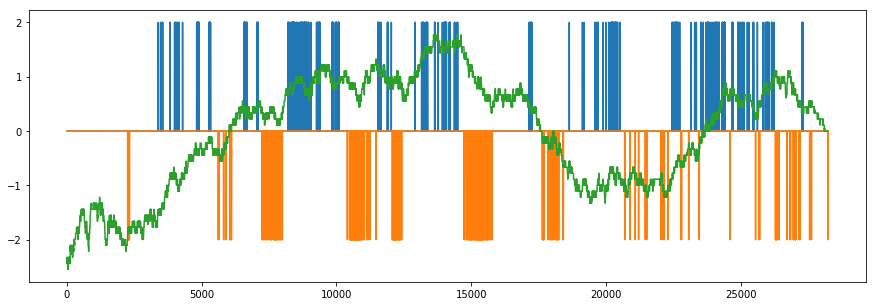

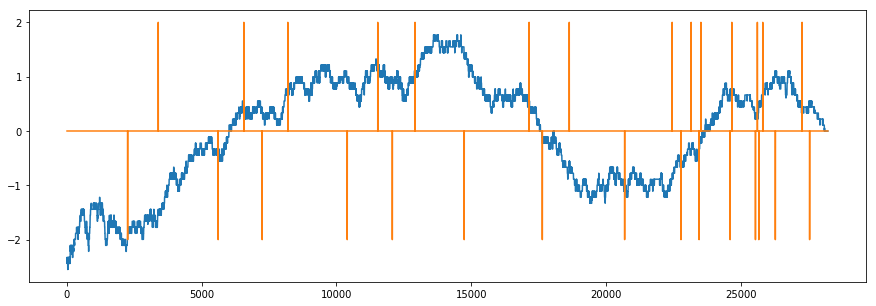

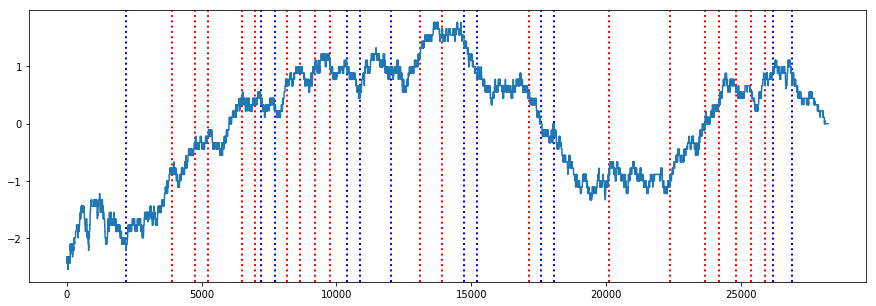

# Long  25380 25400 25370 25390
# Long Entry: 2016-11-30 09:36:03.389300 # Long Exit: 2016-11-30 09:39:41.732159 # Long_upper_threshold_profit: 20
#######################################################################################################
# Long  25400 25420 25390 25400
# Long Entry: 2016-11-30 09:39:37.517504 # Long Exit: 2016-11-30 09:39:46.380934 # Long_lower_threshold_profit: -10
#######################################################################################################
# Long  25405 25425 25395 25425
# Long Entry: 2016-11-30 09:42:02.998874 # Long Exit: 2016-11-30 09:49:38.350331 # Long_upper_threshold_profit: 20
#######################################################################################################
# Long  25435 25455 25425 25420
# Long Entry: 2016-11-30 09:50:34.006944 # Long Exit: 2016-11-30 09:50:56.091202 # Long_lower_threshold_profit: -10
##################################################################################################

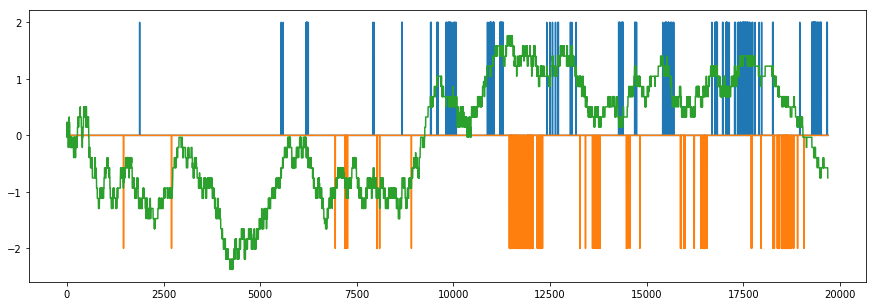

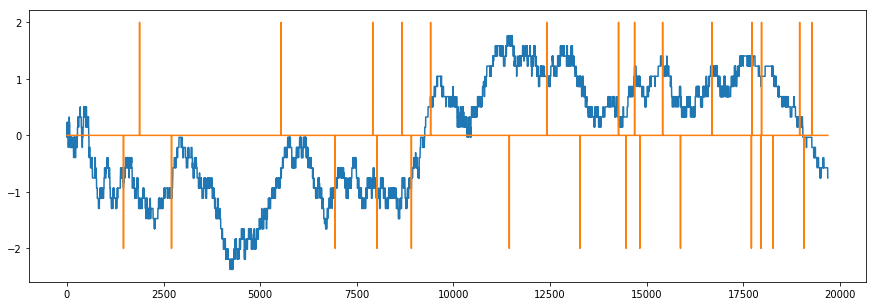

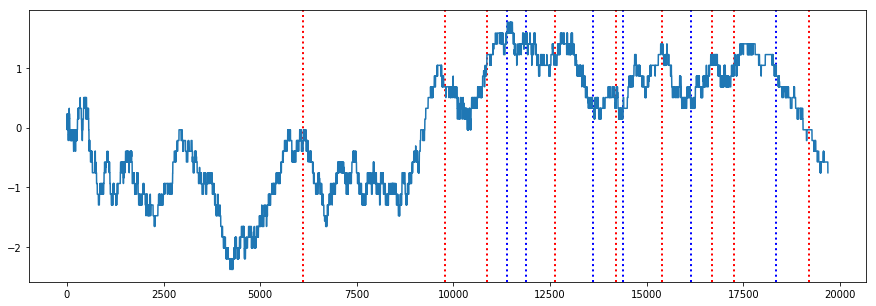

# Long  25450 25470 25440 25415
# Long Entry: 2016-12-01 10:03:00.378178 # Long Exit: 2016-12-01 10:03:37.979523 # Long_lower_threshold_profit: -10
#######################################################################################################
# Long  25475 25495 25465 25455
# Long Entry: 2016-12-01 10:55:54.597314 # Long Exit: 2016-12-01 10:56:06.853223 # Long_lower_threshold_profit: -10
#######################################################################################################
# Long  25485 25505 25475 25490
# Long Entry: 2016-12-01 11:19:01.911016 # Long Exit: 2016-12-01 11:27:27.144403 # Long_time_threshold_profit: 5
#######################################################################################################
# Long  25490 25510 25480 25490
# Long Entry: 2016-12-01 12:01:55.219074 # Long Exit: 2016-12-01 12:03:01.338634 # Long_lower_threshold_profit: -10
###################################################################################################

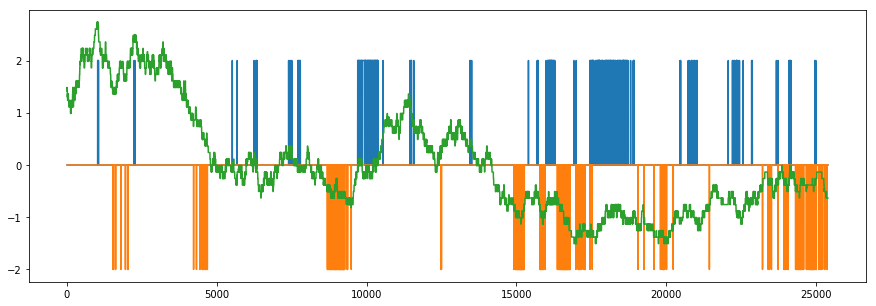

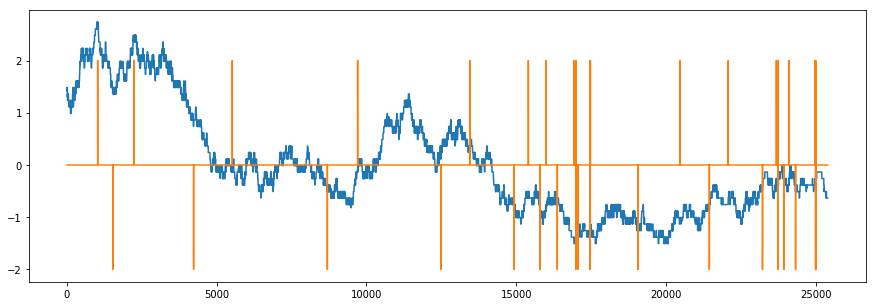

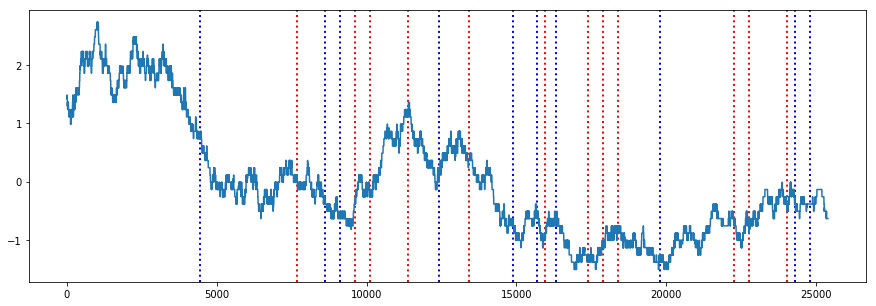

# Long  25290 25310 25280 25290
# Long Entry: 2016-12-02 09:46:46.743250 # Long Exit: 2016-12-02 09:47:10.456770 # Long_lower_threshold_profit: -10
#######################################################################################################
# Long  25275 25295 25265 25285
# Long Entry: 2016-12-02 10:09:26.761230 # Long Exit: 2016-12-02 10:17:46.989350 # Long_time_threshold_profit: 10
#######################################################################################################
# Long  25285 25305 25275 25315
# Long Entry: 2016-12-02 10:15:01.294006 # Long Exit: 2016-12-02 10:19:14.284926 # Long_upper_threshold_profit: 20
#######################################################################################################
# Long  25340 25360 25330 25295
# Long Entry: 2016-12-02 10:21:03.557754 # Long Exit: 2016-12-02 10:21:03.558491 # Long_lower_threshold_profit: -10
###################################################################################################

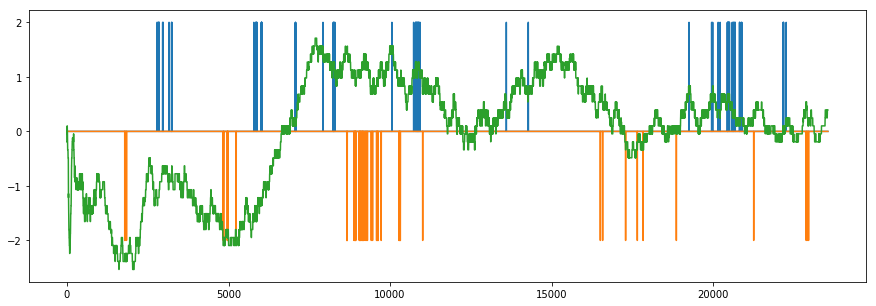

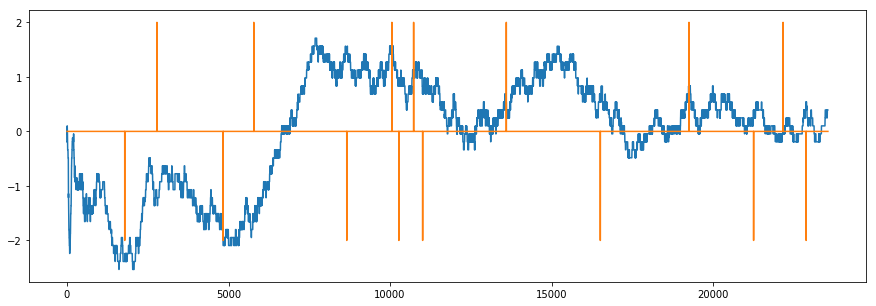

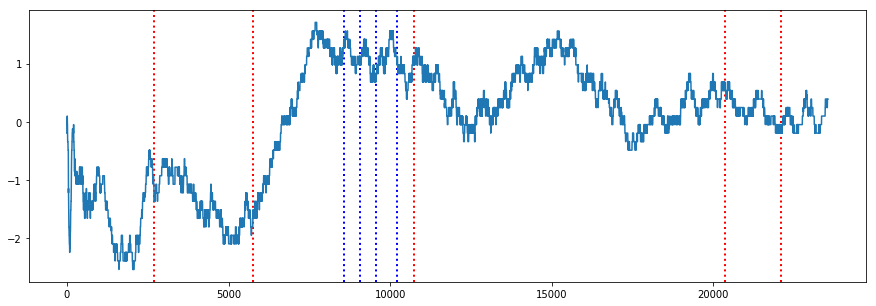

# Long  25200 25220 25190 25195
# Long Entry: 2016-12-05 09:08:00.906133 # Long Exit: 2016-12-05 09:08:00.968405 # Long_lower_threshold_profit: -10
#######################################################################################################
# Long  25175 25195 25165 25280
# Long Entry: 2016-12-05 09:36:32.262388 # Long Exit: 2016-12-05 09:39:45.207498 # Long_upper_threshold_profit: 20
#######################################################################################################
# Long  25270 25290 25260 25265
# Long Entry: 2016-12-05 10:08:44.954476 # Long Exit: 2016-12-05 10:11:32.385280 # Long_lower_threshold_profit: -10
#######################################################################################################
# Long  25255 25275 25245 25245
# Long Entry: 2016-12-05 14:02:24.996588 # Long Exit: 2016-12-05 14:04:57.709683 # Long_lower_threshold_profit: -10
#################################################################################################

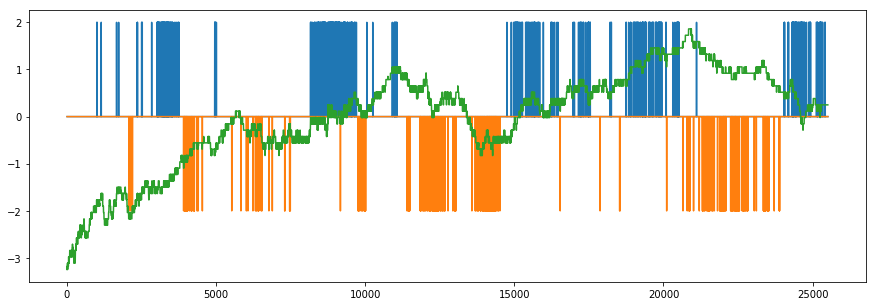

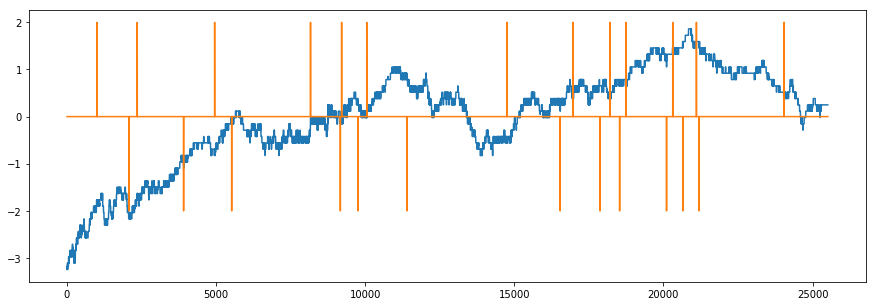

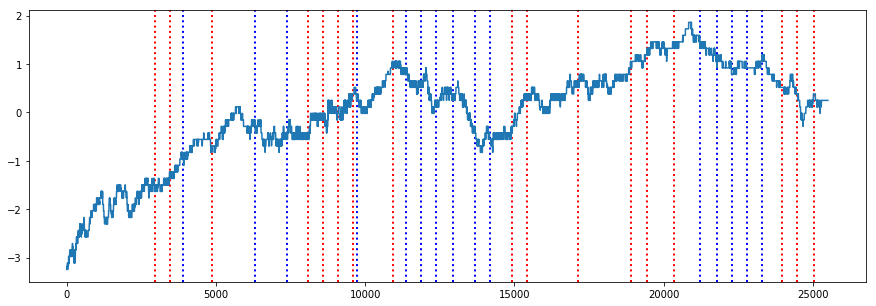

# Long  25480 25500 25470 25510
# Long Entry: 2016-12-06 09:11:57.930162 # Long Exit: 2016-12-06 09:16:24.015513 # Long_upper_threshold_profit: 20
#######################################################################################################
# Long  25490 25510 25480 25505
# Long Entry: 2016-12-06 09:15:25.816518 # Long Exit: 2016-12-06 09:18:00.461146 # Long_upper_threshold_profit: 20
#######################################################################################################
# Long  25510 25530 25500 25520
# Long Entry: 2016-12-06 09:23:04.182803 # Long Exit: 2016-12-06 09:28:09.588599 # Long_upper_threshold_profit: 20
#######################################################################################################
# Long  25515 25535 25505 25545
# Long Entry: 2016-12-06 09:58:58.970392 # Long Exit: 2016-12-06 10:02:42.582993 # Long_upper_threshold_profit: 20
####################################################################################################

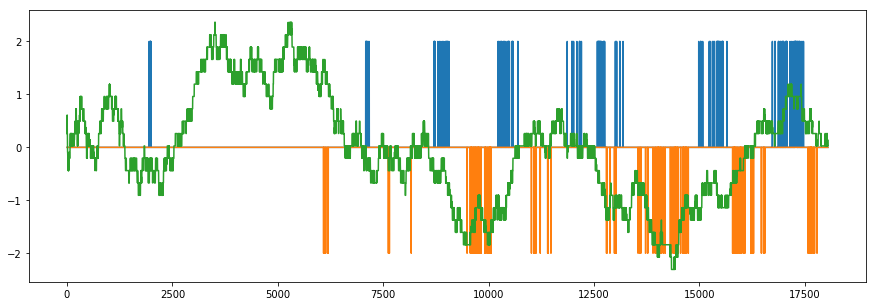

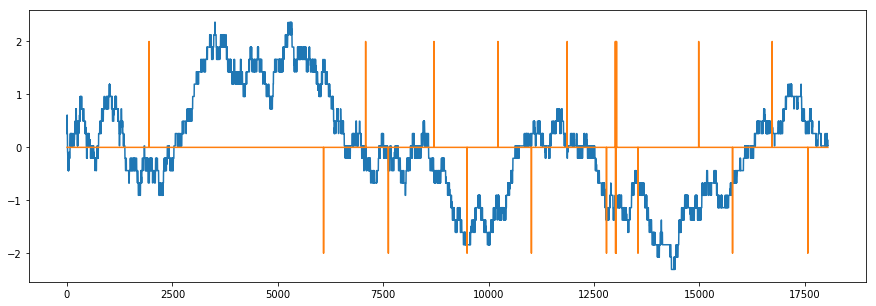

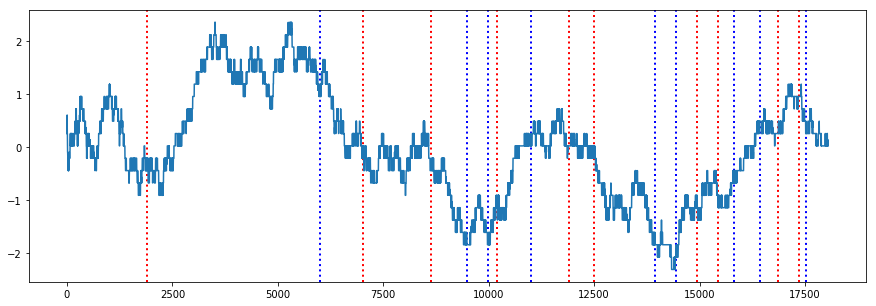

# Long  25605 25625 25595 25610
# Long Entry: 2016-12-07 09:11:12.098644 # Long Exit: 2016-12-07 09:11:52.772335 # Long_lower_threshold_profit: -10
#######################################################################################################
# Long  25610 25630 25600 25605
# Long Entry: 2016-12-07 10:22:21.450865 # Long Exit: 2016-12-07 10:22:36.803537 # Long_lower_threshold_profit: -10
#######################################################################################################
# Long  25605 25625 25595 25600
# Long Entry: 2016-12-07 10:54:48.974420 # Long Exit: 2016-12-07 10:56:00.233919 # Long_lower_threshold_profit: -10
#######################################################################################################
# Long  25595 25615 25585 25595
# Long Entry: 2016-12-07 11:15:37.602465 # Long Exit: 2016-12-07 11:15:45.103183 # Long_lower_threshold_profit: -10
################################################################################################

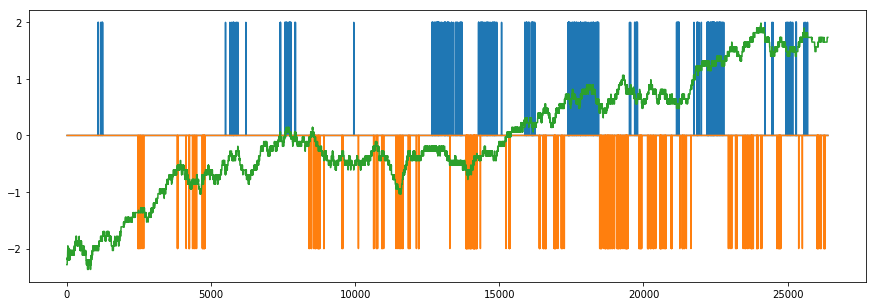

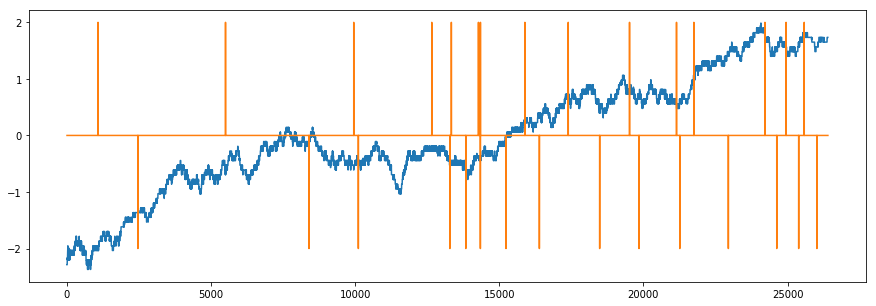

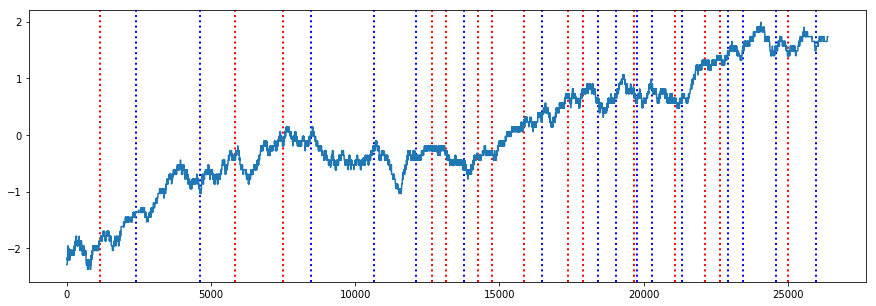

# Long  25865 25885 25855 25885
# Long Entry: 2016-12-08 09:05:00.965692 # Long Exit: 2016-12-08 09:11:23.984934 # Long_upper_threshold_profit: 20
#######################################################################################################
# Long  25955 25975 25945 25955
# Long Entry: 2016-12-08 09:44:32.285986 # Long Exit: 2016-12-08 09:44:32.285986 # Long_lower_threshold_profit: -10
#######################################################################################################
# Long  25965 25985 25955 25965
# Long Entry: 2016-12-08 10:00:13.879275 # Long Exit: 2016-12-08 10:08:40.780046 # Long_time_threshold_profit: 0
#######################################################################################################
# Long  25960 25980 25950 25960
# Long Entry: 2016-12-08 11:22:02.300982 # Long Exit: 2016-12-08 11:26:26.473594 # Long_lower_threshold_profit: -10
####################################################################################################

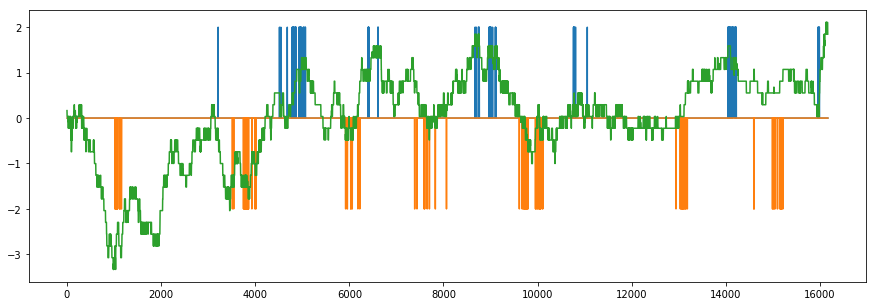

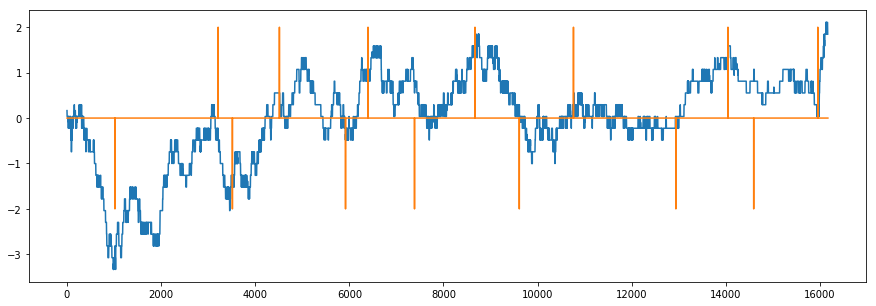

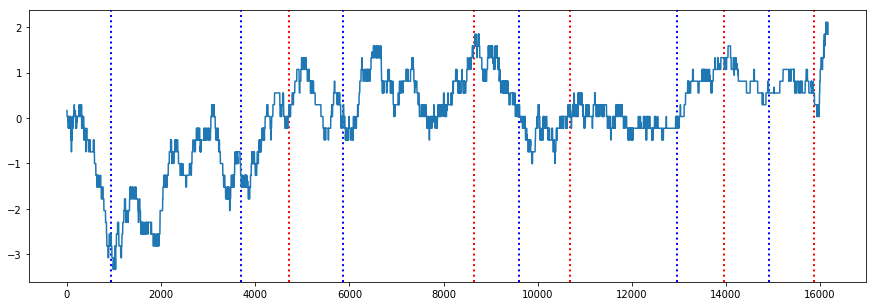

# Long  25790 25810 25780 25785
# Long Entry: 2016-12-09 09:28:07.365788 # Long Exit: 2016-12-09 09:28:44.602701 # Long_lower_threshold_profit: -10
#######################################################################################################
# Long  25815 25835 25805 25805
# Long Entry: 2016-12-09 10:39:39.002978 # Long Exit: 2016-12-09 10:39:46.055252 # Long_lower_threshold_profit: -10
#######################################################################################################
# Long  25790 25810 25780 25780
# Long Entry: 2016-12-09 11:30:06.635018 # Long Exit: 2016-12-09 11:30:06.655452 # Long_lower_threshold_profit: -10
#######################################################################################################
# Long  25810 25830 25800 25805
# Long Entry: 2016-12-09 14:34:26.544084 # Long Exit: 2016-12-09 14:34:36.094938 # Long_lower_threshold_profit: -10
################################################################################################

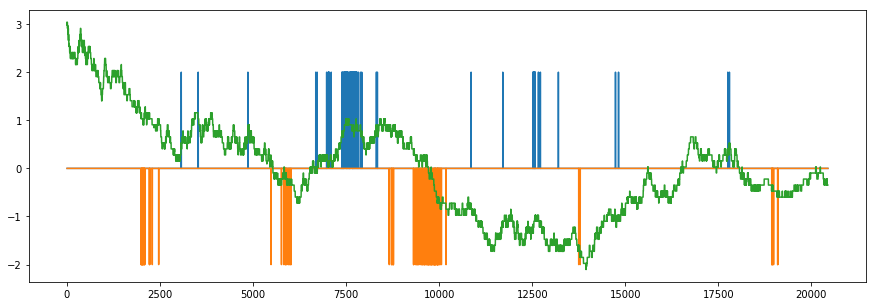

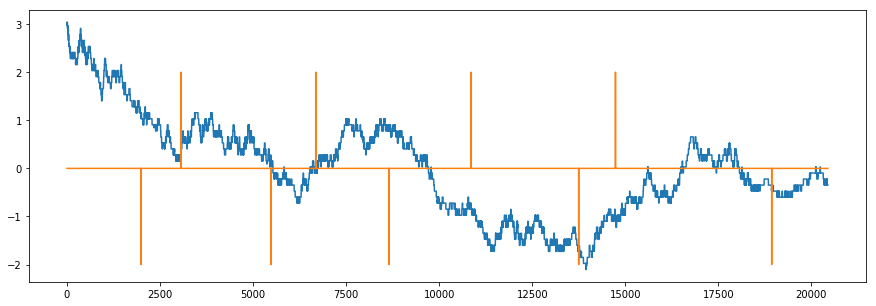

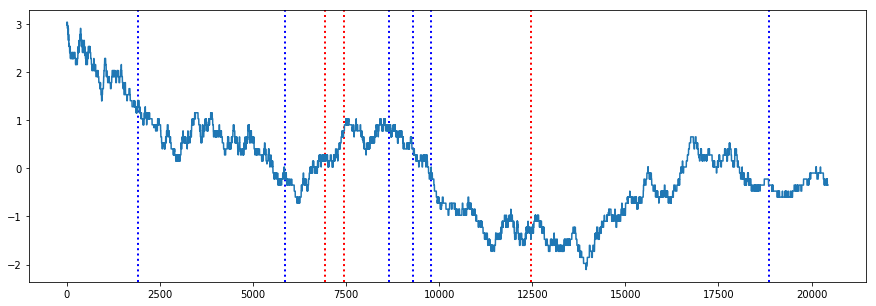

# Long  25785 25805 25775 25810
# Long Entry: 2016-12-12 10:17:50.958740 # Long Exit: 2016-12-12 10:25:32.447928 # Long_upper_threshold_profit: 20
#######################################################################################################
# Long  25810 25830 25800 25795
# Long Entry: 2016-12-12 10:25:32.666706 # Long Exit: 2016-12-12 10:25:32.666706 # Long_lower_threshold_profit: -10
#######################################################################################################
# Long  25725 25745 25715 25730
# Long Entry: 2016-12-12 11:48:34.644154 # Long Exit: 2016-12-12 11:57:00.609127 # Long_time_threshold_profit: 5
#######################################################################################################
# Short  25825 25835 25805 25815
# Short Entry: 2016-12-12 09:10:12.700405 # Short Exit: 2016-12-12 09:10:12.707536 # Short_upper_threshold_profit: -10
################################################################################################

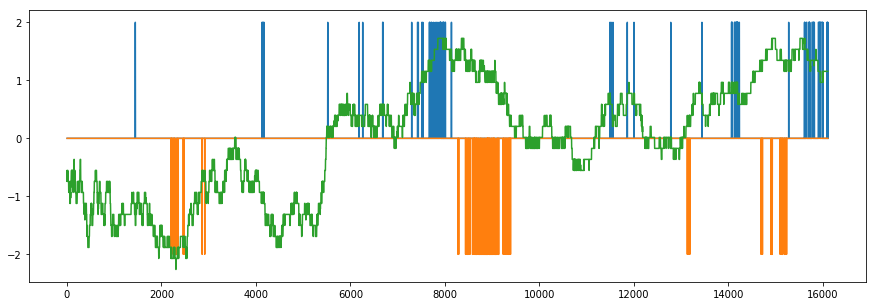

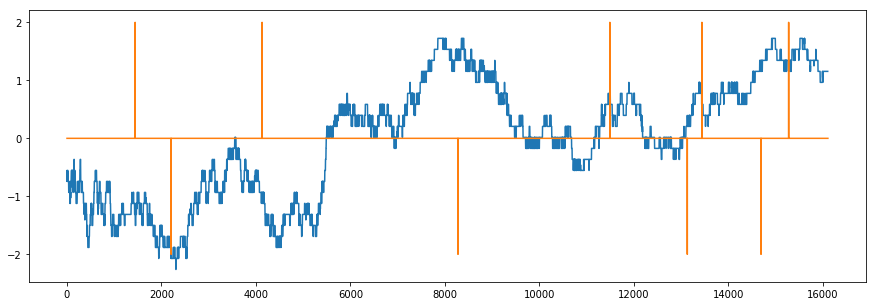

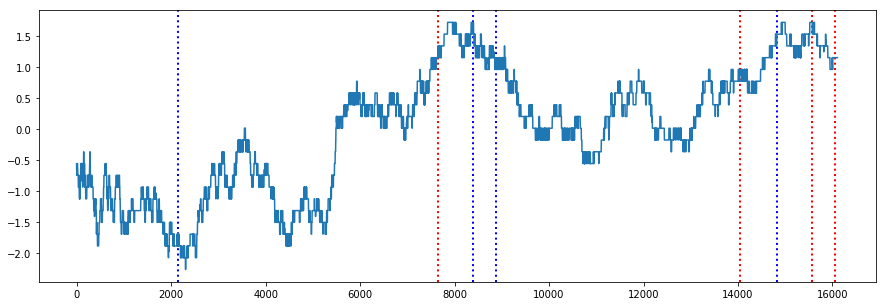

# Long  25830 25850 25820 25835
# Long Entry: 2016-12-13 10:23:38.738351 # Long Exit: 2016-12-13 10:23:38.773404 # Long_lower_threshold_profit: -10
#######################################################################################################
# Long  25815 25835 25805 25805
# Long Entry: 2016-12-13 14:38:39.003841 # Long Exit: 2016-12-13 14:42:59.184432 # Long_lower_threshold_profit: -10
#######################################################################################################
# Long  25840 25860 25830 25825
# Long Entry: 2016-12-13 15:23:49.295793 # Long Exit: 2016-12-13 15:24:49.020093 # Long_lower_threshold_profit: -10
#######################################################################################################
# Long  25825 25845 25815 25800
# Long Entry: 2016-12-13 15:34:44.093934 # Long Exit: 2016-12-13 15:45:00.216607 # Long_lower_threshold_profit: -10
################################################################################################

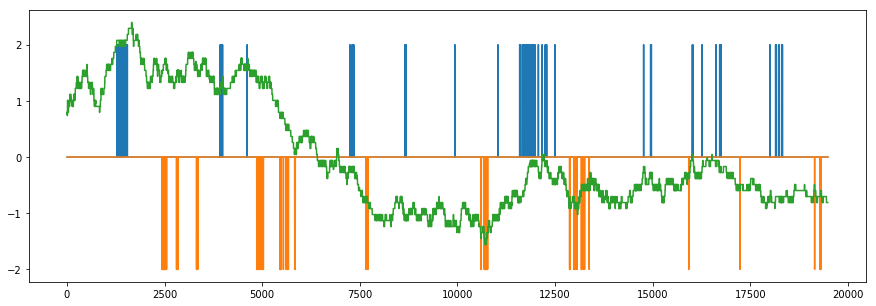

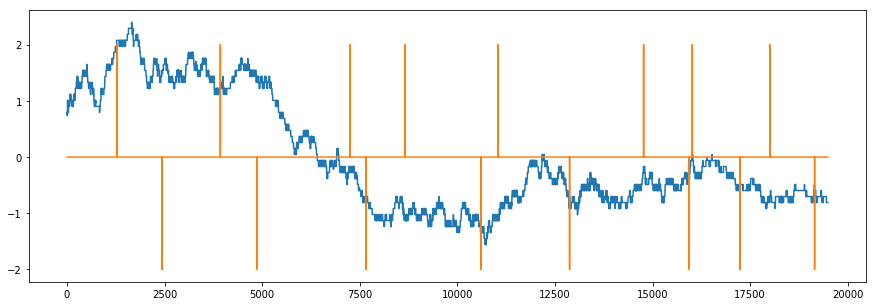

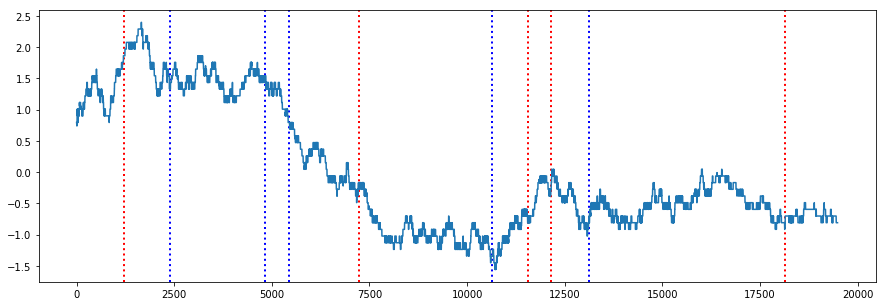

# Long  25980 26000 25970 25955
# Long Entry: 2016-12-14 09:05:15.181269 # Long Exit: 2016-12-14 09:06:10.784325 # Long_upper_threshold_profit: 20
#######################################################################################################
# Long  25885 25905 25875 25840
# Long Entry: 2016-12-14 10:04:48.210825 # Long Exit: 2016-12-14 10:04:48.216625 # Long_lower_threshold_profit: -10
#######################################################################################################
# Long  25860 25880 25850 25880
# Long Entry: 2016-12-14 10:45:50.824855 # Long Exit: 2016-12-14 10:50:54.118765 # Long_upper_threshold_profit: 20
#######################################################################################################
# Long  25885 25905 25875 25870
# Long Entry: 2016-12-14 10:52:49.680492 # Long Exit: 2016-12-14 10:55:13.969353 # Long_lower_threshold_profit: -10
##################################################################################################

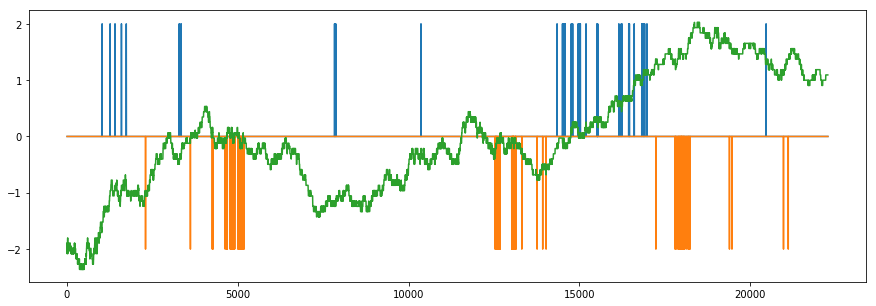

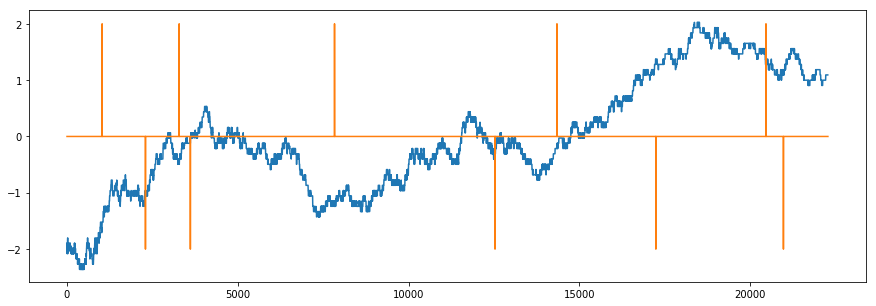

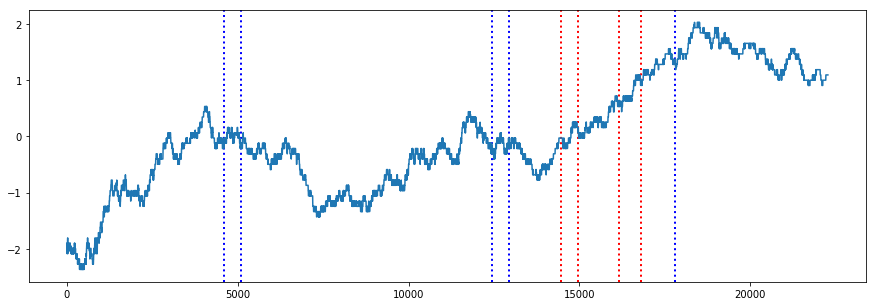

# Long  25780 25800 25770 25770
# Long Entry: 2016-12-15 11:47:35.484067 # Long Exit: 2016-12-15 11:48:50.168541 # Long_lower_threshold_profit: -10
#######################################################################################################
# Long  25790 25810 25780 25780
# Long Entry: 2016-12-15 12:00:13.975191 # Long Exit: 2016-12-15 12:00:16.939095 # Long_lower_threshold_profit: -10
#######################################################################################################
# Long  25815 25835 25805 25810
# Long Entry: 2016-12-15 12:36:47.068073 # Long Exit: 2016-12-15 12:36:53.759534 # Long_lower_threshold_profit: -10
#######################################################################################################
# Long  25835 25855 25825 25840
# Long Entry: 2016-12-15 12:53:24.659377 # Long Exit: 2016-12-15 12:53:24.702581 # Long_lower_threshold_profit: -10
################################################################################################

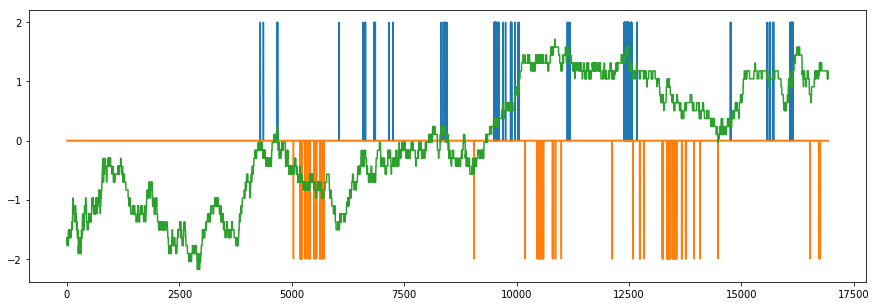

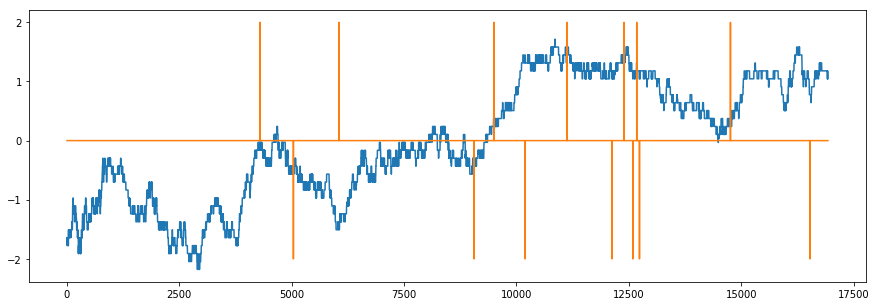

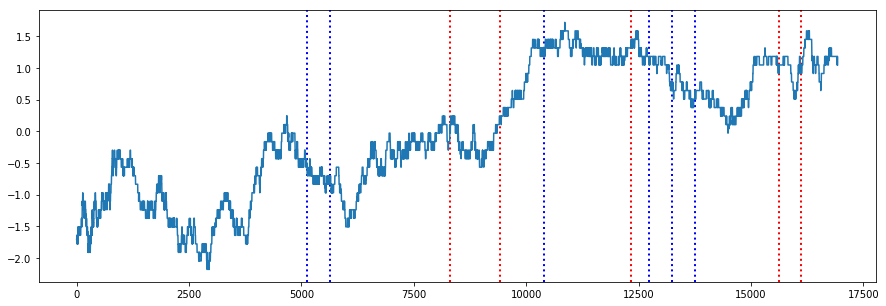

# Long  25860 25880 25850 25845
# Long Entry: 2016-12-16 10:36:20.889842 # Long Exit: 2016-12-16 10:36:25.522570 # Long_lower_threshold_profit: -10
#######################################################################################################
# Long  25865 25885 25855 25870
# Long Entry: 2016-12-16 11:04:11.467226 # Long Exit: 2016-12-16 11:05:36.447292 # Long_lower_threshold_profit: -10
#######################################################################################################
# Long  25905 25925 25895 25905
# Long Entry: 2016-12-16 12:37:31.439775 # Long Exit: 2016-12-16 12:45:55.953754 # Long_time_threshold_profit: 0
#######################################################################################################
# Long  25895 25915 25885 25895
# Long Entry: 2016-12-16 15:07:30.256188 # Long Exit: 2016-12-16 15:07:31.558224 # Long_lower_threshold_profit: -10
###################################################################################################

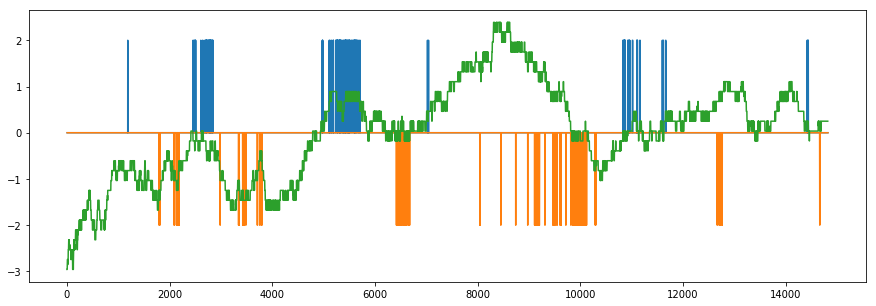

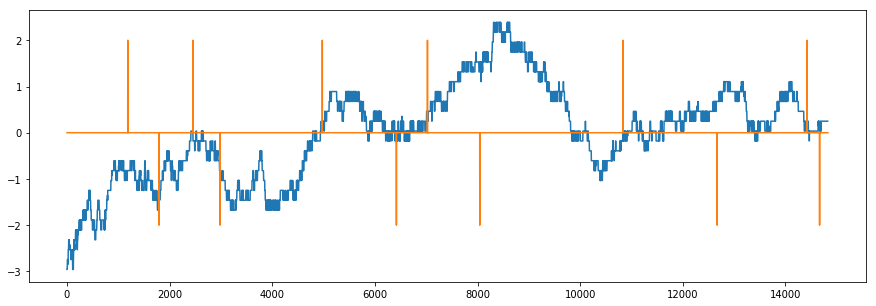

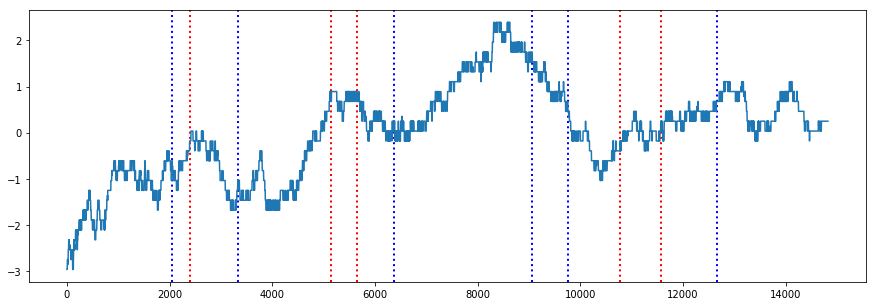

# Long  25885 25905 25875 25870
# Long Entry: 2016-12-19 09:26:00.918574 # Long Exit: 2016-12-19 09:26:43.397677 # Long_lower_threshold_profit: -10
#######################################################################################################
# Long  25905 25925 25895 25895
# Long Entry: 2016-12-19 10:16:11.032126 # Long Exit: 2016-12-19 10:17:25.603027 # Long_lower_threshold_profit: -10
#######################################################################################################
# Long  25905 25925 25895 25890
# Long Entry: 2016-12-19 10:20:47.608291 # Long Exit: 2016-12-19 10:23:18.988689 # Long_lower_threshold_profit: -10
#######################################################################################################
# Long  25880 25900 25870 25885
# Long Entry: 2016-12-19 12:26:11.768532 # Long Exit: 2016-12-19 12:34:33.457332 # Long_time_threshold_profit: 5
###################################################################################################

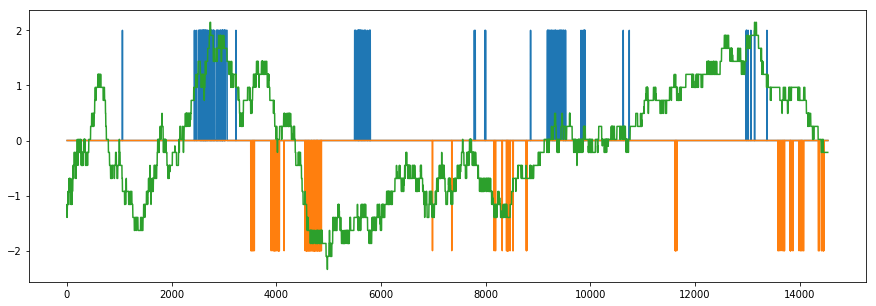

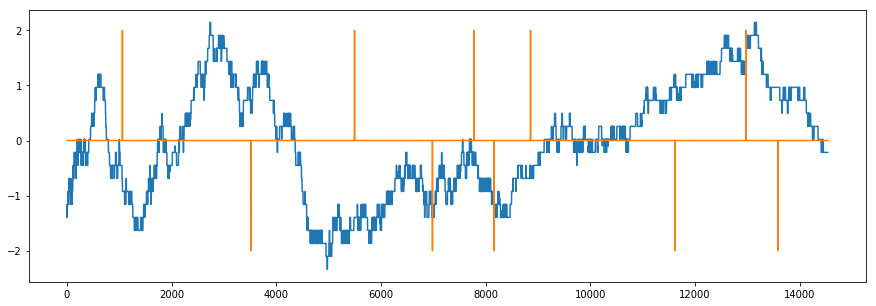

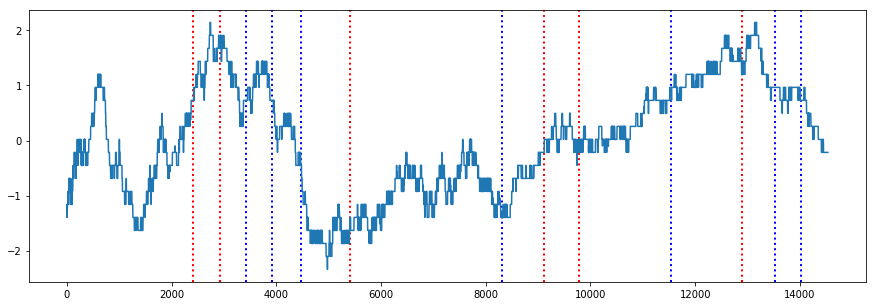

# Long  25960 25980 25950 25975
# Long Entry: 2016-12-20 09:25:01.243368 # Long Exit: 2016-12-20 09:27:07.392389 # Long_upper_threshold_profit: 20
#######################################################################################################
# Long  25980 26000 25970 25960
# Long Entry: 2016-12-20 09:29:26.524885 # Long Exit: 2016-12-20 09:29:59.838883 # Long_lower_threshold_profit: -10
#######################################################################################################
# Long  25915 25935 25905 25910
# Long Entry: 2016-12-20 10:08:05.847070 # Long Exit: 2016-12-20 10:08:05.977788 # Long_lower_threshold_profit: -10
#######################################################################################################
# Long  25940 25960 25930 25940
# Long Entry: 2016-12-20 11:39:13.866912 # Long Exit: 2016-12-20 11:47:36.134125 # Long_time_threshold_profit: 0
####################################################################################################

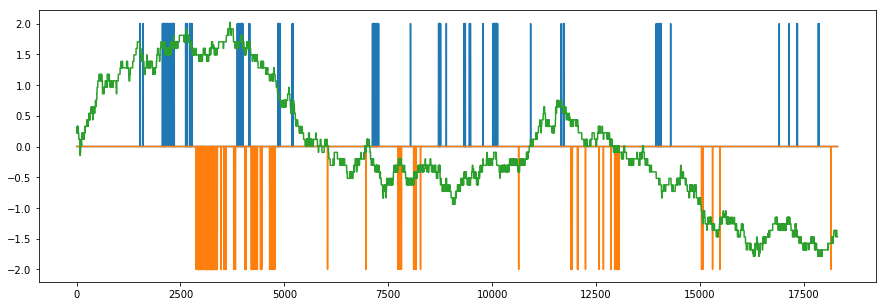

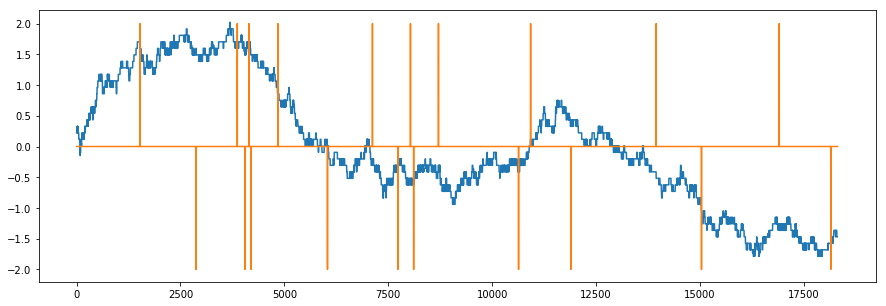

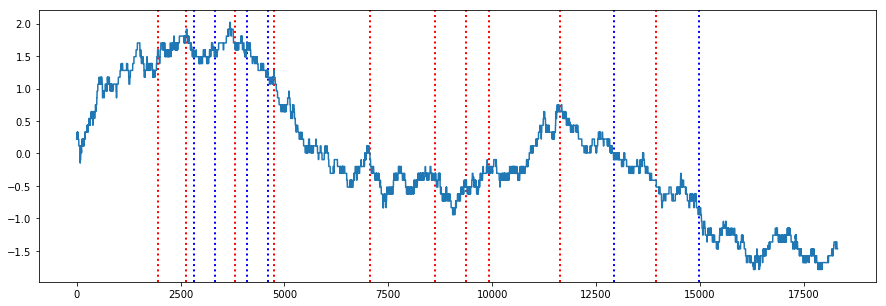

# Long  26075 26095 26065 26070
# Long Entry: 2016-12-21 09:10:00.215525 # Long Exit: 2016-12-21 09:10:03.049458 # Long_lower_threshold_profit: -10
#######################################################################################################
# Long  26090 26110 26080 26070
# Long Entry: 2016-12-21 09:15:01.624821 # Long Exit: 2016-12-21 09:15:04.998896 # Long_lower_threshold_profit: -10
#######################################################################################################
# Long  26085 26105 26075 26075
# Long Entry: 2016-12-21 09:39:22.147837 # Long Exit: 2016-12-21 09:39:22.176809 # Long_lower_threshold_profit: -10
#######################################################################################################
# Long  26065 26085 26055 25985
# Long Entry: 2016-12-21 09:56:27.370038 # Long Exit: 2016-12-21 09:56:43.389246 # Long_lower_threshold_profit: -10
################################################################################################

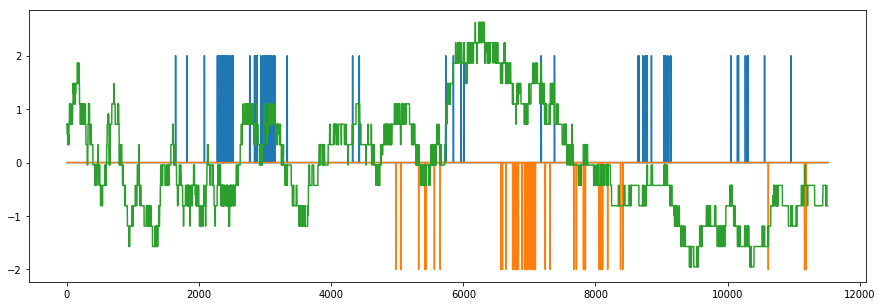

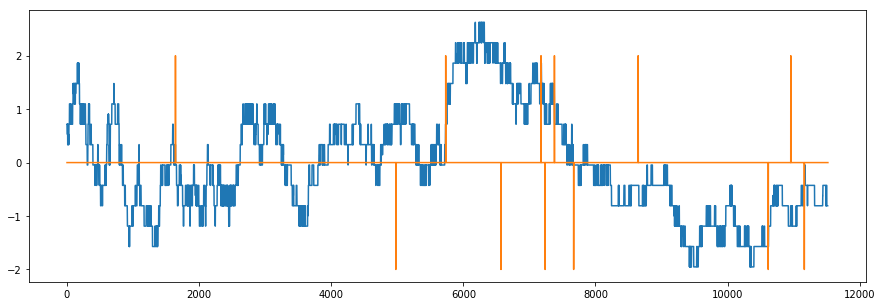

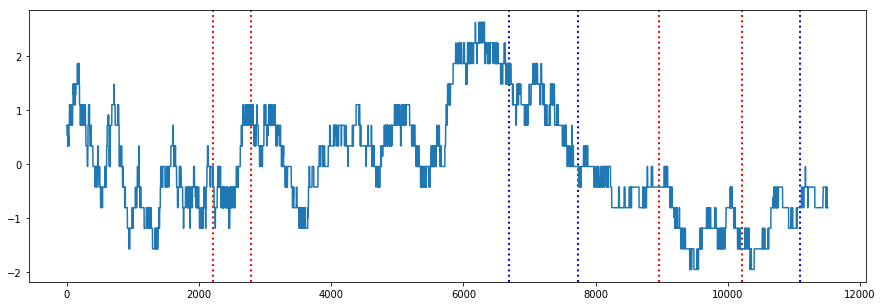

# Long  25870 25890 25860 25880
# Long Entry: 2016-12-23 09:24:15.648363 # Long Exit: 2016-12-23 09:25:17.418954 # Long_lower_threshold_profit: -10
#######################################################################################################
# Long  25885 25905 25875 25875
# Long Entry: 2016-12-23 09:32:23.399948 # Long Exit: 2016-12-23 09:32:37.428416 # Long_lower_threshold_profit: -10
#######################################################################################################
# Long  25870 25890 25860 25865
# Long Entry: 2016-12-23 13:29:28.154492 # Long Exit: 2016-12-23 13:37:54.378850 # Long_time_threshold_profit: -5
#######################################################################################################
# Long  25855 25875 25845 25845
# Long Entry: 2016-12-23 14:35:30.096154 # Long Exit: 2016-12-23 14:43:40.219056 # Long_lower_threshold_profit: -10
##################################################################################################

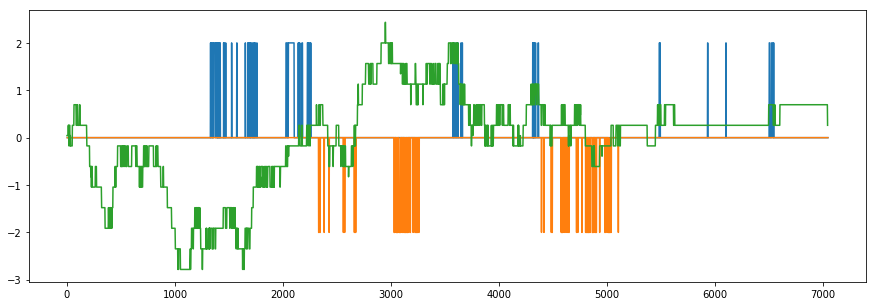

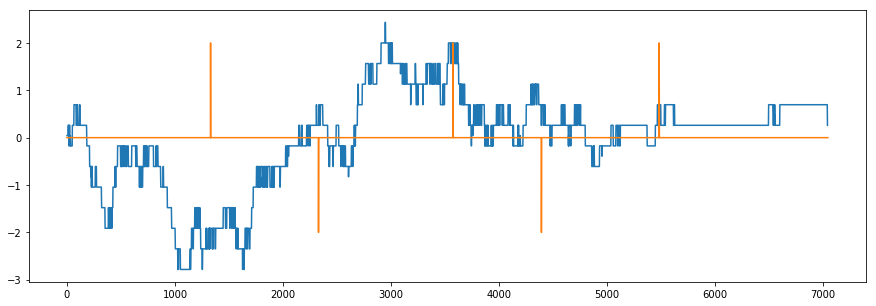

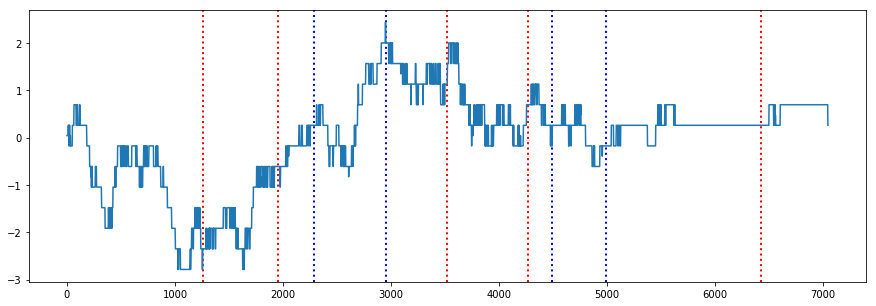

# Long  25855 25875 25845 25860
# Long Entry: 2016-12-26 09:23:55.658987 # Long Exit: 2016-12-26 09:32:21.841683 # Long_time_threshold_profit: 5
#######################################################################################################
# Long  25880 25900 25870 25885
# Long Entry: 2016-12-26 09:39:01.683751 # Long Exit: 2016-12-26 09:39:49.528311 # Long_lower_threshold_profit: -10
#######################################################################################################
# Long  25900 25920 25890 25890
# Long Entry: 2016-12-26 10:28:11.909272 # Long Exit: 2016-12-26 10:31:03.646194 # Long_lower_threshold_profit: -10
#######################################################################################################
# Long  25895 25915 25885 25890
# Long Entry: 2016-12-26 11:05:33.766237 # Long Exit: 2016-12-26 11:14:16.397999 # Long_time_threshold_profit: -5
#####################################################################################################

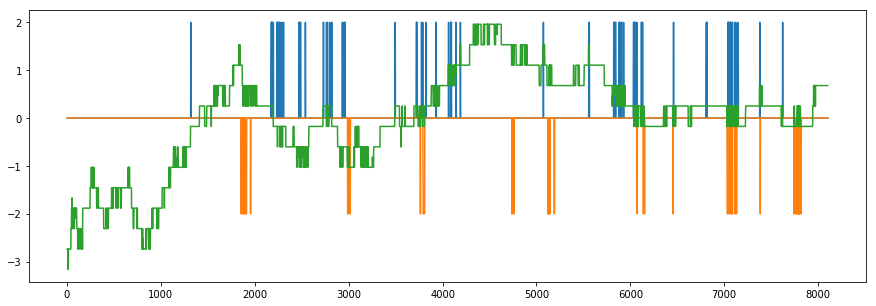

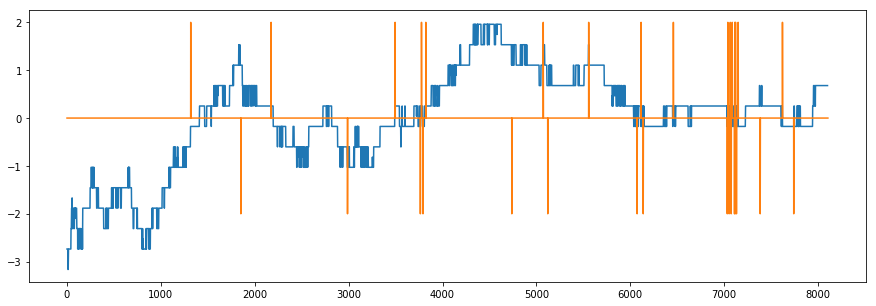

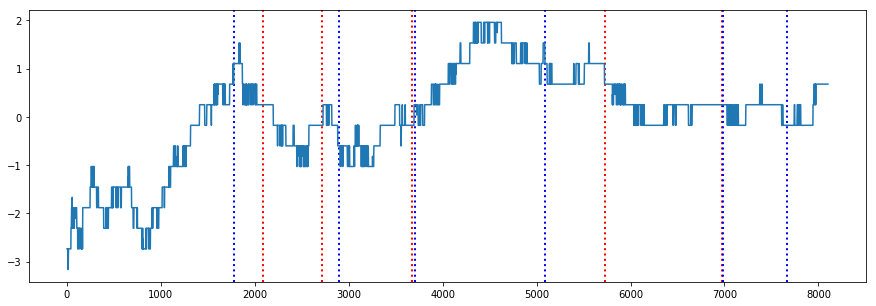

# Long  25930 25950 25920 25915
# Long Entry: 2016-12-27 09:40:05.044090 # Long Exit: 2016-12-27 09:45:26.089961 # Long_lower_threshold_profit: -10
#######################################################################################################
# Long  25925 25945 25915 25920
# Long Entry: 2016-12-27 10:02:02.896753 # Long Exit: 2016-12-27 10:10:34.155319 # Long_time_threshold_profit: -5
#######################################################################################################
# Long  25925 25945 25915 25920
# Long Entry: 2016-12-27 11:07:34.224667 # Long Exit: 2016-12-27 11:15:54.731661 # Long_time_threshold_profit: -5
#######################################################################################################
# Long  25935 25955 25925 25925
# Long Entry: 2016-12-27 13:31:05.736516 # Long Exit: 2016-12-27 13:34:58.991444 # Long_lower_threshold_profit: -10
####################################################################################################

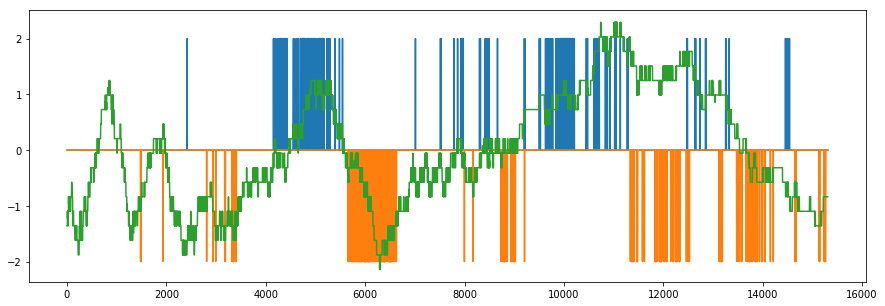

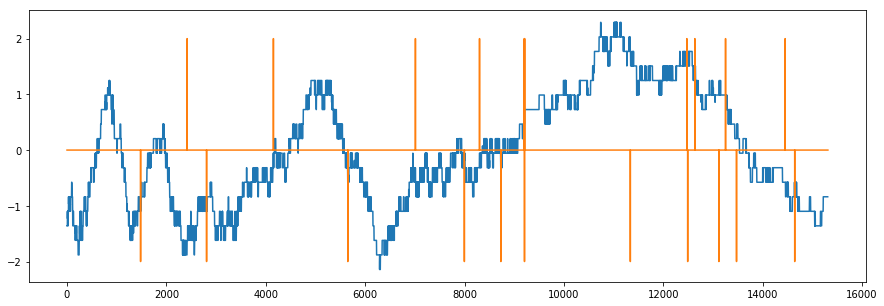

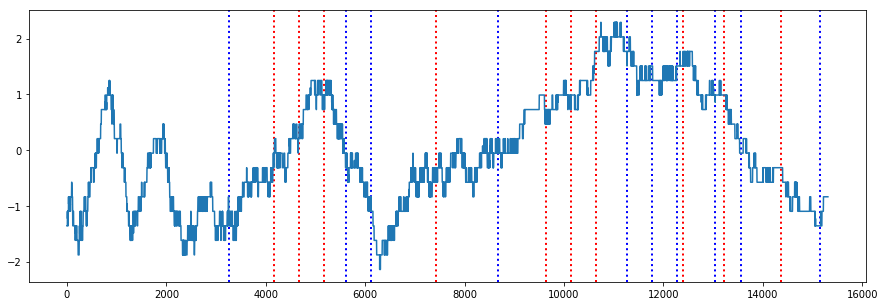

# Long  26035 26055 26025 26030
# Long Entry: 2016-12-28 09:38:06.916558 # Long Exit: 2016-12-28 09:38:37.367492 # Long_lower_threshold_profit: -10
#######################################################################################################
# Long  26040 26060 26030 26040
# Long Entry: 2016-12-28 09:48:31.676989 # Long Exit: 2016-12-28 09:56:55.465616 # Long_time_threshold_profit: 0
#######################################################################################################
# Long  26055 26075 26045 26020
# Long Entry: 2016-12-28 09:54:20.103330 # Long Exit: 2016-12-28 09:54:32.088173 # Long_lower_threshold_profit: -10
#######################################################################################################
# Long  26025 26045 26015 26030
# Long Entry: 2016-12-28 10:28:31.094851 # Long Exit: 2016-12-28 10:31:59.818625 # Long_lower_threshold_profit: -10
###################################################################################################

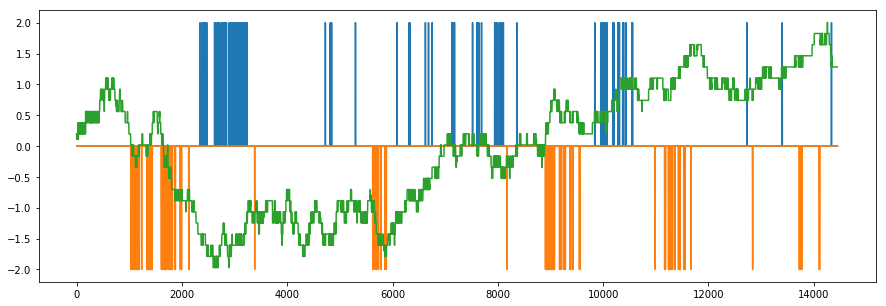

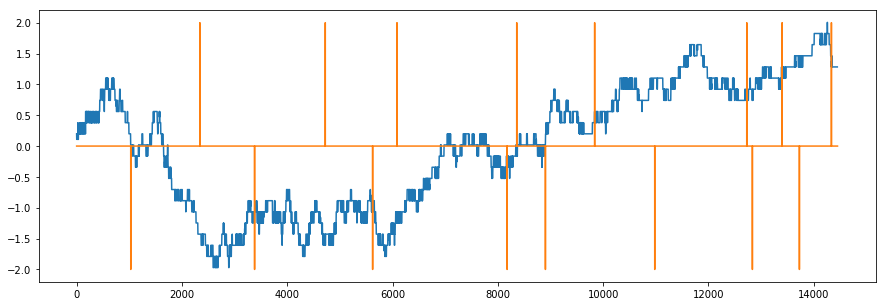

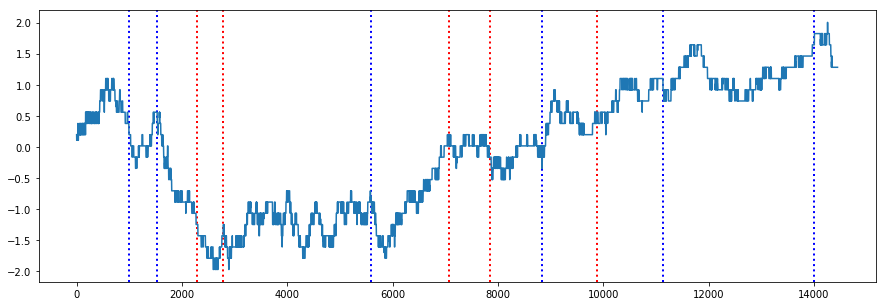

# Long  25950 25970 25940 25945
# Long Entry: 2016-12-29 09:15:22.847409 # Long Exit: 2016-12-29 09:15:29.274263 # Long_lower_threshold_profit: -10
#######################################################################################################
# Long  25945 25965 25935 25945
# Long Entry: 2016-12-29 09:18:50.571540 # Long Exit: 2016-12-29 09:19:06.903276 # Long_lower_threshold_profit: -10
#######################################################################################################
# Long  25990 26010 25980 25980
# Long Entry: 2016-12-29 10:42:07.092301 # Long Exit: 2016-12-29 10:42:07.133399 # Long_lower_threshold_profit: -10
#######################################################################################################
# Long  25980 26000 25970 25970
# Long Entry: 2016-12-29 11:02:18.061375 # Long Exit: 2016-12-29 11:05:00.478405 # Long_lower_threshold_profit: -10
################################################################################################

In [8]:
dates = []
cum_long_profits = []
cum_short_profits = []

for i in train_parameters['prd_date']:

    tmp_date = i
    
    # Read threshold that calculated with the previous data set.
    long_spread_threshold = train_parameters['prd_long_thresh'][train_parameters['prd_date'] == i].iloc[0]
    short_spread_threshold = train_parameters['prd_short_thresh'][train_parameters['prd_date'] == i].iloc[0]
    print(tmp_date, long_spread_threshold, short_spread_threshold)
    
    # Read Test data
    test = pd.read_csv(read_path + 'DIOB__data_A3_G7_{}.csv'.format(i))
    test['short_time'] = test['time'].apply(lambda x: x[0:8])
    test = test[(test['code'] == 'A3') | (test['code'] == 'G7')].reset_index(drop=True)
    test['date_time'] = test['time'].apply(lambda x: i[:4] + '-' + i[4:6] + '-' + i[6:] + ' ' +  x[:8] + '.' + x[9:])

    # 초기값 Reset # 
    spreads= [0] 
    ask_exe_q = 0
    bid_exe_q = 0
    current_long_lvl_1_q = 0
    current_long_lvl_2_q = 0
    current_long_lvl_3_q = 0
    current_long_lvl_4_q = 0
    current_long_lvl_5_q = 0

    current_short_lvl_1_q = 0
    current_short_lvl_2_q = 0
    current_short_lvl_3_q = 0
    current_short_lvl_4_q = 0
    current_short_lvl_5_q = 0

    previous_long_lvl_1_q = 0
    previous_long_lvl_2_q = 0
    previous_long_lvl_3_q = 0
    previous_long_lvl_4_q = 0
    previous_long_lvl_5_q = 0 

    previous_short_lvl_1_q = 0
    previous_short_lvl_2_q = 0
    previous_short_lvl_3_q = 0
    previous_short_lvl_4_q = 0
    previous_short_lvl_5_q = 0    
    
    ## Dynamic Order Book Imbalance Caclulation ## 
    for i in test.index + 1:

        if i == len(test):
            break

        exe_q = test.get_value(i, 'exe_q')
        long_or_short = test.get_value(i, 'long_or_short')

        if long_or_short == 2:
            ask_exe_q = exe_q
            bid_exe_q = 0

        elif long_or_short == 1:
            ask_exe_q = 0
            bid_exe_q = exe_q

        current_long_lvl_1_q = test.get_value(i, 'long_lvl_1_q')
        current_long_lvl_2_q = test.get_value(i, 'long_lvl_2_q')
        current_long_lvl_3_q = test.get_value(i, 'long_lvl_3_q')
        current_long_lvl_4_q = test.get_value(i, 'long_lvl_4_q')
        current_long_lvl_5_q = test.get_value(i, 'long_lvl_5_q')

        current_short_lvl_1_q = test.get_value(i, 'short_lvl_1_q')
        current_short_lvl_2_q = test.get_value(i, 'short_lvl_2_q')
        current_short_lvl_3_q = test.get_value(i, 'short_lvl_3_q')
        current_short_lvl_4_q = test.get_value(i, 'short_lvl_4_q')
        current_short_lvl_5_q = test.get_value(i, 'short_lvl_5_q')

        previous_long_lvl_1_q = test.get_value(i - 1, 'long_lvl_1_q')
        previous_long_lvl_2_q = test.get_value(i - 1, 'long_lvl_2_q')
        previous_long_lvl_3_q = test.get_value(i - 1, 'long_lvl_3_q')
        previous_long_lvl_4_q = test.get_value(i - 1, 'long_lvl_4_q')
        previous_long_lvl_5_q = test.get_value(i - 1, 'long_lvl_5_q')

        previous_short_lvl_1_q = test.get_value(i - 1, 'short_lvl_1_q')
        previous_short_lvl_2_q = test.get_value(i - 1, 'short_lvl_2_q')
        previous_short_lvl_3_q = test.get_value(i - 1, 'short_lvl_3_q')
        previous_short_lvl_4_q = test.get_value(i - 1, 'short_lvl_4_q')
        previous_short_lvl_5_q = test.get_value(i - 1, 'short_lvl_5_q')


        netAsk = (current_long_lvl_1_q - previous_long_lvl_1_q) + \
        (current_long_lvl_2_q - previous_long_lvl_2_q) + \
        (current_long_lvl_3_q - previous_long_lvl_3_q) + \
        (current_long_lvl_4_q - previous_long_lvl_4_q) + \
        (current_long_lvl_5_q - previous_long_lvl_5_q) - ask_exe_q

        netBid = (current_short_lvl_1_q - previous_short_lvl_1_q) + \
        (current_short_lvl_2_q - previous_short_lvl_2_q) + \
        (current_short_lvl_3_q - previous_short_lvl_3_q) + \
        (current_short_lvl_4_q - previous_short_lvl_4_q) + \
        (current_short_lvl_5_q - previous_short_lvl_5_q) - bid_exe_q
    
        spread = netBid - netAsk
        spreads.append(spread)
        
    test['spreads'] = spreads
    test['mid_price'] = (test['long_lvl_1_p'] + test['short_lvl_1_p']) / 2
    test['rolling_spreads_mean'] = test['spreads'].rolling(1000).mean()
    test['rolling_spreads_mean'] = test['rolling_spreads_mean'].replace(np.nan, 0)
    test['long_spread_signal'] = test['rolling_spreads_mean'] >= long_spread_threshold
    test['short_spread_signal'] = test['rolling_spreads_mean'] <= short_spread_threshold

    #######################################################################################
    accum_val = pd.DataFrame((test['long_spread_signal'] * 1 + test['short_spread_signal'] * -1).cumsum())

    result = [0]

    for i in range(len(accum_val)):
        if len(accum_val) == i:
            break

        if i == 0:
            continue

        past_value = accum_val.get_value(i-1, 0)
        cur_value  = accum_val.get_value(i, 0)

        if past_value == cur_value:
            result.append(0)
            continue

        elif cur_value > past_value:
            result.append(1)

        elif cur_value < past_value:
            result.append(-1)

    result = pd.DataFrame(result)

    ls = [0]

    for i in range(len(result)):
        if len(result) == i+1:
            break

        if i == 0:
            continue

        pre_val = result.get_value(i-1, 0)
        cur_val = result.get_value(i, 0)
        next_val = result.get_value(i+1, 0)

        if (pre_val == 0 and cur_val == 1 and next_val == 0):
            ls.append(1)

        elif (pre_val == 0 and cur_val == -1 and next_val == 0):
            ls.append(-1)

        elif (pre_val == 0 and cur_val == 1 and next_val == 1):
            ls.append(1)

        elif (pre_val == 1 and cur_val == 1 and next_val == 1):
            ls.append(0)

        elif (pre_val == 0 and cur_val == -1 and next_val == -1):
            ls.append(-1)

        elif (pre_val == -1 and cur_val == -1 and next_val == -1):
            ls.append(0)

        else:
            ls.append(0)

    ls.append(0)
    ls = pd.DataFrame(ls)
    
    signal_test = ls[ls[0] != 0]
    signal_test_index = signal_test.index
    signal_test = signal_test.reset_index(drop=True)

    testing = []

    for i in range(len(signal_test)):
        if i == 0:
            cur_val = signal_test.get_value(i, 0)
            testing.append(cur_val)
            continue

        if len(signal_test) == i+1:
            prv_val = signal_test.get_value(i-1,0)
            cur_val = signal_test.get_value(i, 0)

            if prv_val == cur_val:
                testing.append(0)

            elif prv_val != cur_val:
                testing.append(cur_val)
            break

        prv_val = signal_test.get_value(i-1, 0)
        cur_val = signal_test.get_value(i, 0)
        nex_val = signal_test.get_value(i+1, 0)

        if prv_val == 1 and cur_val == 1 and nex_val == 1:
            testing.append(0)
        elif prv_val == 1 and cur_val == 1 and nex_val == -1:
            testing.append(0)
        elif prv_val == 1 and cur_val == 0 and nex_val == -1:
            testing.append(0)
        elif prv_val == -1 and cur_val == -1 and nex_val == 1:
            testing.append(0)
        elif prv_val == -1 and cur_val == 1 and nex_val == -1:
            testing.append(1)
        elif prv_val == -1 and cur_val == 1 and nex_val == 1:
            testing.append(1)

        elif prv_val == 1 and cur_val == 1 and nex_val == -1:
            testing.append(0)
        elif prv_val == 1 and cur_val == -1 and nex_val == 1:
            testing.append(-1)
        elif prv_val == 1 and cur_val == -1 and nex_val == -1:
            testing.append(-1)
        else:
            testing.append(0)
    
    ###############################
    
    testing = pd.DataFrame(testing, index=signal_test_index)
    
    try:
        test['real_signal'] = pd.concat([ls, testing], axis=1).iloc[:, 1].fillna(0)
    except IndexError:
        continue
    
    plt.figure(figsize=(15,5))
    plt.plot(test['long_spread_signal'].iloc[3:-1] * 2)
    plt.plot(test['short_spread_signal'].iloc[3:-1] * -2)
    plt.plot(scale(test['mid_price'].iloc[3:-1]))
    plt.show()
    
    plt.figure(figsize=(15,5))
    plt.plot(scale(test['mid_price'][3:-1]))
    plt.plot((test['real_signal']*2))
    plt.show()
    
    ######################
    ## Added Filtering ###
    ######################
    
    sample_long = (test['long_spread_signal'] * 1).to_frame()
    sample_short = (test['short_spread_signal'] * -1).to_frame()
    
    count_long = 0
    count_short = 0

    count_long_index = []
    count_short_index = []

    for i in sample_long.index:

        limit_long = count_long + 100
        limit_short = count_short + 100

        if (sample_long['long_spread_signal'].iloc[count_long:limit_long].sum() >= 10):
    #         print('## Long', count_long)
            count_long_index.append(count_long)
            count_long += 500

        if (sample_short['short_spread_signal'].iloc[count_short:limit_short].sum() <= -10):
    #         print('## Short', count_short)
            count_short_index.append(count_short)
            count_short +=500

        count_long += 1
        count_short += 1

    plt.figure(figsize=(15,5))
    for i in count_long_index:
        plt.axvline(test.index[i], color='r', linestyle=':', linewidth=2)
    for i in count_short_index:
        plt.axvline(test.index[i], color='b', linestyle=':', linewidth=2)
    plt.plot(scale(test['mid_price'].iloc[3:-1]))
    plt.show()
    
    ## 추가 부분 ##
    long_events = test.iloc[count_long_index, 26].to_frame()
    short_events = test.iloc[count_short_index, 26].to_frame()

    long_events = long_events.set_index('date_time')
    short_events = short_events.set_index('date_time')

    long_events.index = pd.to_datetime(long_events.index)
    short_events.index = pd.to_datetime(short_events.index)

    long_events = long_events.index
    short_events = short_events.index
    
    test_df = test.copy(deep=True)
    test_df['side'] = np.nan

    for i in count_long_index:
        test_df.loc[i, 'side'] = 1
    for i in count_short_index:
        test_df.loc[i, 'side'] = -1

    test_df = test_df.set_index('date_time')
    test_df.index = pd.to_datetime(test_df.index)
    
    # num_days is a parameter (actually seconds)
    long_vertical_barriers = add_vertical_barrier(t_events=long_events, close=test_df['mid_price'], num_days=500)
    short_vertical_barriers = add_vertical_barrier(t_events=short_events, close=test_df['mid_price'], num_days=500)    

    # Future Product => 1 price level == 5
    price_gap = 5

    # two_horizontal_barriers : profit_cut / loss_cut #

    profit_cut_param = price_gap * 4
    loss_cut_param = price_gap * 2

    # vertical_barriers
    horizon_param = long_vertical_barriers # 500 seconds

    long_profits = []
    short_profits = []

    ## Long Case ## 
    value_count = 0

    for i in long_events:
        trading_term = test_df.loc[i: long_vertical_barriers[value_count]]

        long_entrance_price = trading_term['short_lvl_1_p'].iloc[0]
        long_entrance_time = trading_term['short_lvl_1_p'].index[0]

        upper_threshold_price = long_entrance_price + profit_cut_param

        lower_threshold_price = long_entrance_price - loss_cut_param

        time_threshold_price = trading_term['long_lvl_1_p'].iloc[-1]

        if time_threshold_price == 0:
            time_threshold_price = trading_term['cur_price'].iloc[-1]

        print('# Long ', long_entrance_price, upper_threshold_price, lower_threshold_price, time_threshold_price)

        # 0. Upper Threshold was hitted case (Limit order was sent at upper threshold price, and the price went above it)
        # profit taking line
        if len(trading_term[trading_term['short_lvl_1_p'] > upper_threshold_price]) > 0:
            long_exit_price = upper_threshold_price
            long_exit_time = trading_term[trading_term['short_lvl_1_p'] > upper_threshold_price].index[0]

            profit = long_exit_price - long_entrance_price
            print('# Long Entry:', long_entrance_time, '# Long Exit:', long_exit_time, '# Long_upper_threshold_profit:', profit)
            print('#######################################################################################################')

        # 1. Lower Threshold was hitted case (if long_lvl_1_price hits lower threshold price, then execute it immediately)
        # loss_cut taking line
        elif len(trading_term[trading_term['long_lvl_1_p'] <= lower_threshold_price]) > 0:
            long_exit_price = lower_threshold_price
            long_exit_time = trading_term[trading_term['long_lvl_1_p'] <= lower_threshold_price].index[0]

            profit = long_exit_price - long_entrance_price
            print('# Long Entry:', long_entrance_time, '# Long Exit:', long_exit_time, '# Long_lower_threshold_profit:', profit)
            print('#######################################################################################################')

        # 2. Time_threshold_was hitted case
        # Random profit taking line
        else:
            long_exit_price = time_threshold_price
            long_exit_time = long_vertical_barriers[value_count]

            profit = long_exit_price - long_entrance_price
            print('# Long Entry:', long_entrance_time, '# Long Exit:', long_exit_time, '# Long_time_threshold_profit:', profit)
            print('#######################################################################################################')

        long_profits.append(profit)

        value_count += 1

    ## Short Case ##
    value_count = 0

    for i in short_events:
        trading_term = test_df.loc[i: short_vertical_barriers[value_count]]

        short_entrance_price = trading_term['long_lvl_1_p'].iloc[0]
        short_entrance_time = trading_term['long_lvl_1_p'].index[0]

        upper_threshold_price = short_entrance_price + loss_cut_param

        lower_threshold_price = short_entrance_price - profit_cut_param

        time_threshold_price = trading_term['short_lvl_1_p'].iloc[-1]

        if time_threshold_price == 0:
            time_threshold_price = trading_term['cur_price'].iloc[-1]

        print('# Short ', short_entrance_price, upper_threshold_price, lower_threshold_price, time_threshold_price)

        # 0. Upper Threshold was hitted case (if short_lvl_1_price hits upper threshold price, then execute it immediately)
        # loss_cut taking line
        if len(trading_term[trading_term['short_lvl_1_p'] >= upper_threshold_price]) > 0:
            short_exit_price = upper_threshold_price
            short_exit_time = trading_term[trading_term['short_lvl_1_p'] >= upper_threshold_price].index[0]

            profit = short_entrance_price - short_exit_price
            print('# Short Entry:', short_entrance_time, '# Short Exit:', short_exit_time, '# Short_upper_threshold_profit:', profit)
            print('#######################################################################################################')

        # 1. Lower threshold was hitted case (Limit order was sent at lower threshold price. and the price went below it)
        elif len(trading_term[trading_term['long_lvl_1_p'] < lower_threshold_price]) > 0:
            short_exit_price = lower_threshold_price
            short_exit_time = trading_term[trading_term['long_lvl_1_p'] < lower_threshold_price].index[0]

            profit = short_entrance_price - short_exit_price
            print('# Short Entry:', short_entrance_time, '# Short Exit:', short_exit_time, '# Short_lower_threshold_profit:', profit)
            print('#######################################################################################################')

        # 2. Time_Threshold_was hitted case
        else:
            short_exit_price = time_threshold_price
            short_exit_time = short_vertical_barriers[value_count]

            profit = short_entrance_price - short_exit_price
            print('# Short Entry:', short_entrance_time, '# Short Exit:', short_exit_time, '# Short_time_threshold_profit:', profit)
            print('#######################################################################################################')

        short_profits.append(profit)        

        value_count += 1
    
    print('LONG P&L:', np.sum(long_profits), 'SHORT P&L:', np.sum(short_profits), 'TOTAL P&L:', np.sum(long_profits) + np.sum(short_profits))
    print('#######################################################################################################')
    
    dates.append(tmp_date)
    cum_long_profits.append(np.sum(long_profits))
    cum_short_profits.append(np.sum(short_profits))
    
    print('###############')
    print('Cum_Long_profit: ', np.sum(cum_long_profits))
    print('Cum_Short_profit: ', np.sum(cum_short_profits))
    print('###############')
    
#     if tmp_date >= '20151001':
#         break

In [17]:
profit_results = pd.concat([pd.Series(dates, name='date'),
                            pd.Series(cum_long_profits, name='long_profit'),
                            pd.Series(cum_short_profits, name='short_profit')], axis=1)

In [18]:
profit_results['long_profit'][profit_results['date'] >= '20161001'].sum()

-435.0

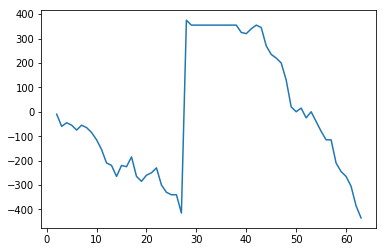

In [19]:
profit_results['long_profit'][profit_results['date'] >= '20161001'].cumsum().plot()

20160929 0.537 -0.542


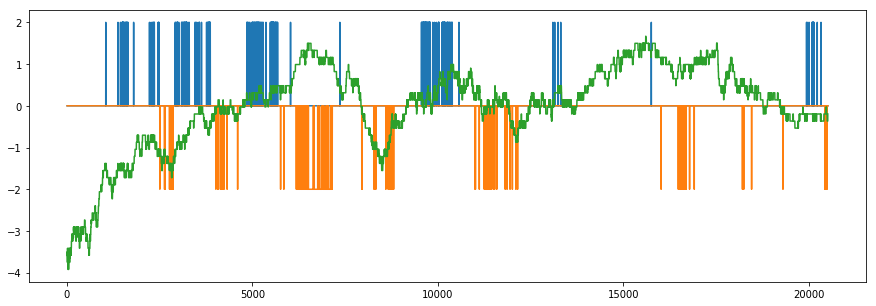

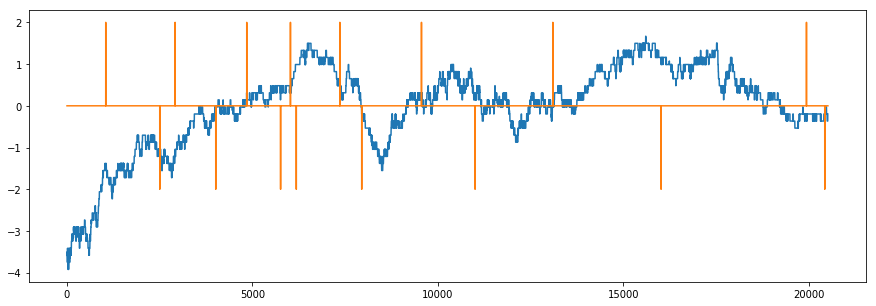

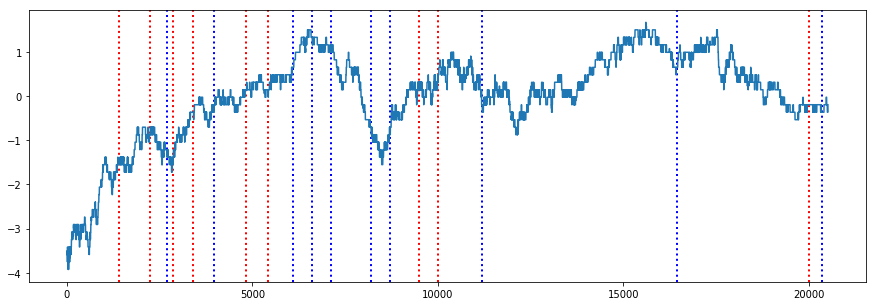

# Long  26075 26095 26065 26090
Long Entry: 2016-09-29 09:04:04.474951 # Long Exit: 2016-09-29 09:12:26.301142 # Long_time_threshold_profit: 15
#######################################################################################################
# Long  26095 26115 26085 26105
Long Entry: 2016-09-29 09:08:00.534051 # Long Exit: 2016-09-29 09:16:21.012051 # Long_time_threshold_profit: 10
#######################################################################################################
# Long  26080 26100 26070 26110
Long Entry: 2016-09-29 09:11:35.083664 # Long Exit: 2016-09-29 09:19:57.052833 # Long_time_threshold_profit: 30
#######################################################################################################
# Long  26110 26130 26100 26110
Long Entry: 2016-09-29 09:14:31.124149 # Long Exit: 2016-09-29 09:22:54.943318 # Long_time_threshold_profit: 0
#######################################################################################################
# Long  2

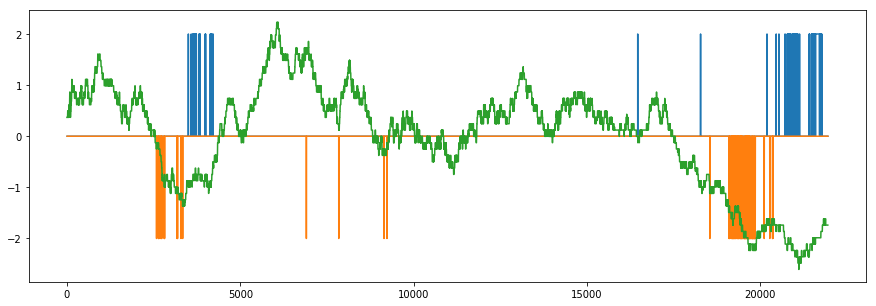

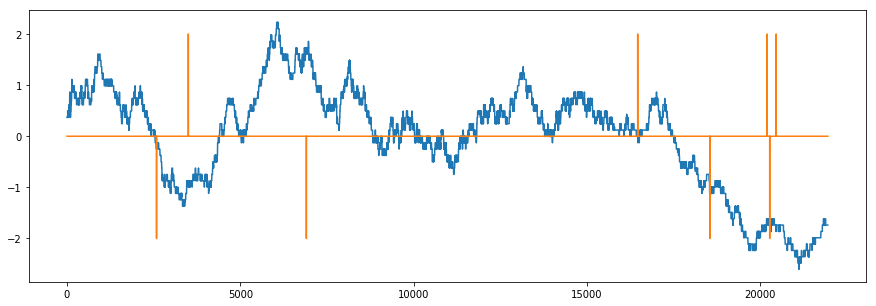

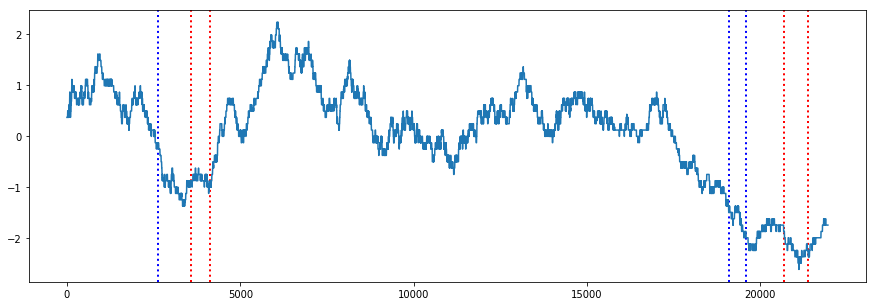

# Long  25850 25870 25840 25880
Long Entry: 2016-09-30 09:12:54.047638 # Long Exit: 2016-09-30 09:21:15.067931 # Long_time_threshold_profit: 30
#######################################################################################################
# Long  25845 25865 25835 25900
Long Entry: 2016-09-30 09:17:14.939999 # Long Exit: 2016-09-30 09:25:35.821692 # Long_time_threshold_profit: 55
#######################################################################################################
# Long  25810 25830 25800 25785
Long Entry: 2016-09-30 15:20:28.025077 # Long Exit: 2016-09-30 15:28:48.967622 # Long_time_threshold_profit: -25
#######################################################################################################
# Long  25795 25815 25785 25820
Long Entry: 2016-09-30 15:30:03.917302 # Long Exit: 2016-09-30 15:45:00.218805 # Long_time_threshold_profit: 25
#######################################################################################################
LONG P&

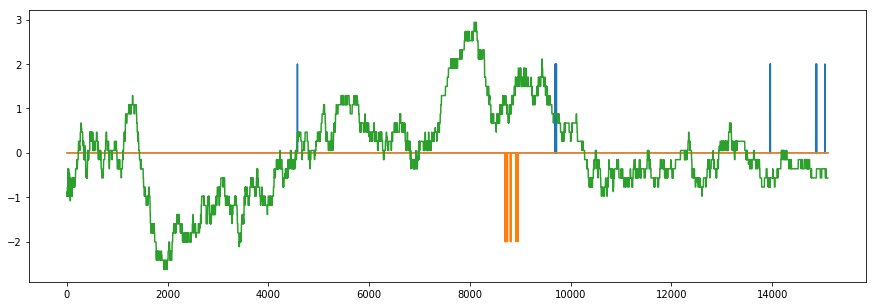

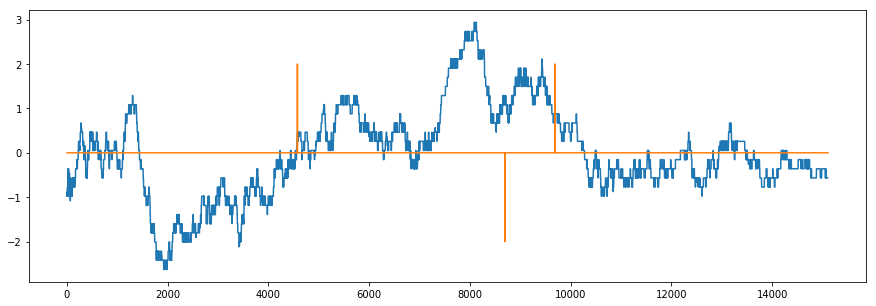

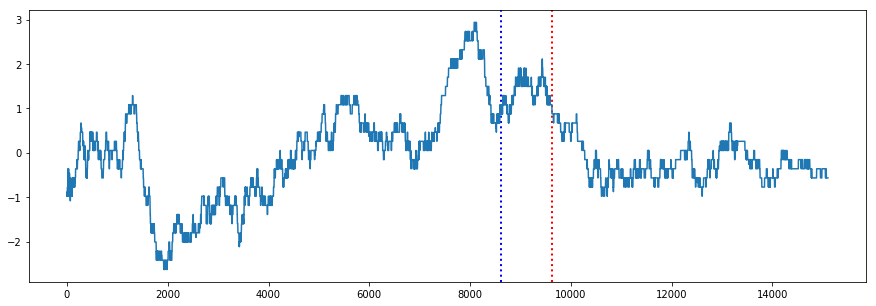

# Long  25995 26015 25985 25980
Long Entry: 2016-10-04 11:15:00.609944 # Long Exit: 2016-10-04 11:23:26.263060 # Long_time_threshold_profit: -15
#######################################################################################################
LONG P&L: -15 SHORT P&L: 0.0 TOTAL P&L: -15.0
#######################################################################################################
###############
Cum_Long_profit:  120
20161005 0.542 -0.563


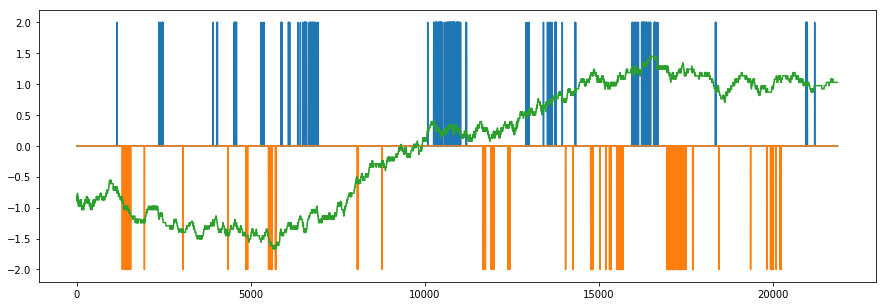

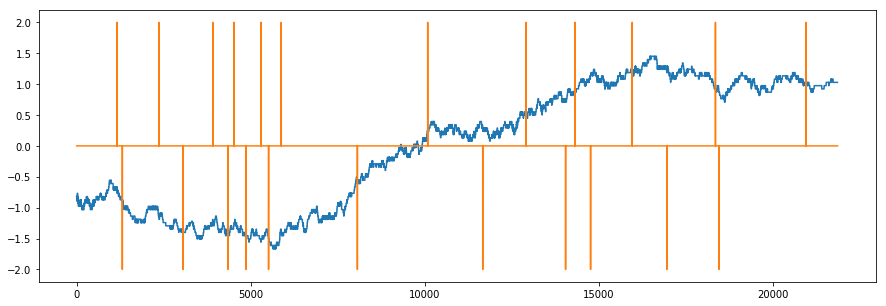

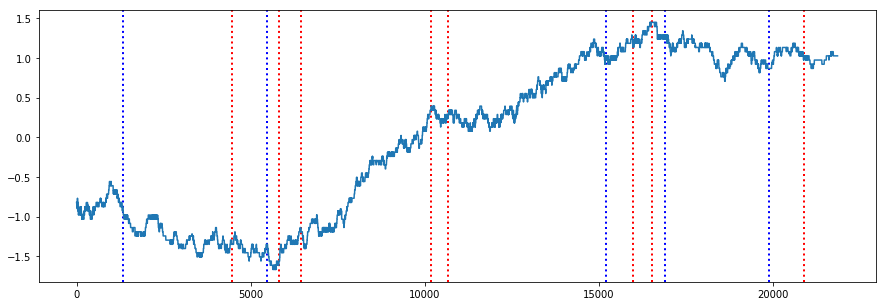

# Long  25735 25755 25725 25725
Long Entry: 2016-10-05 09:23:09.314562 # Long Exit: 2016-10-05 09:31:31.272492 # Long_time_threshold_profit: -10
#######################################################################################################
# Long  25710 25730 25700 25735
Long Entry: 2016-10-05 09:43:17.225415 # Long Exit: 2016-10-05 09:51:38.323437 # Long_time_threshold_profit: 25
#######################################################################################################
# Long  25750 25770 25740 25745
Long Entry: 2016-10-05 09:53:26.824584 # Long Exit: 2016-10-05 10:01:47.909335 # Long_time_threshold_profit: -5
#######################################################################################################
# Long  25895 25915 25885 25870
Long Entry: 2016-10-05 10:16:59.630712 # Long Exit: 2016-10-05 10:25:21.148252 # Long_time_threshold_profit: -25
#######################################################################################################
# Long

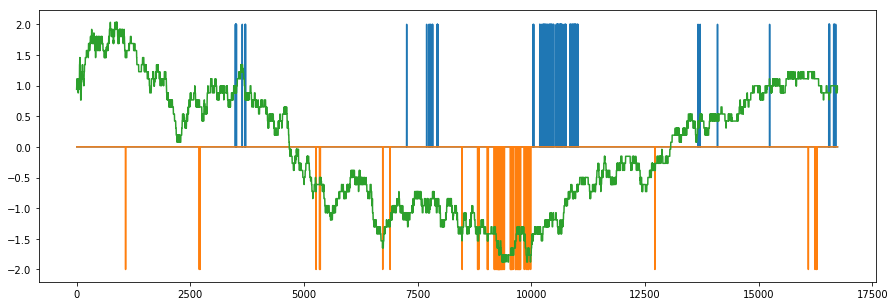

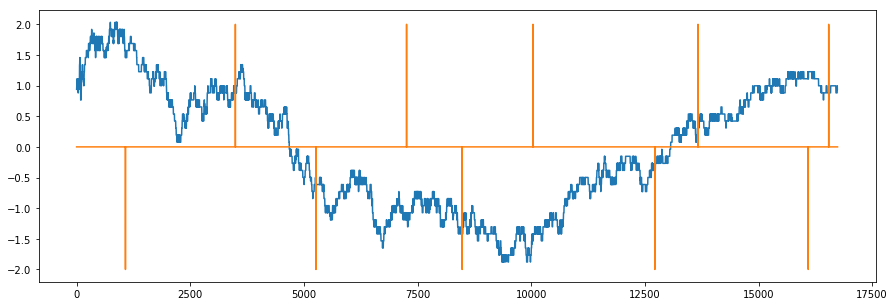

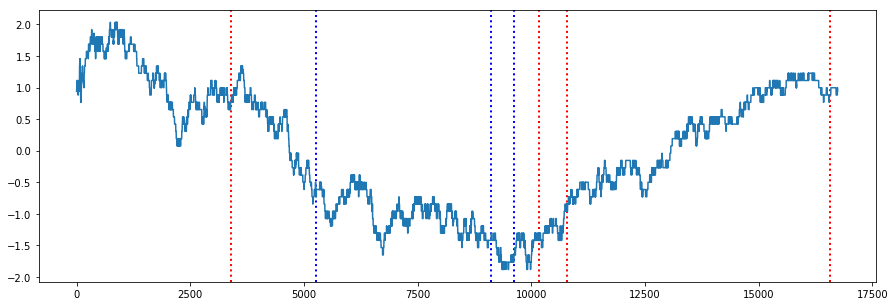

# Long  26125 26145 26115 26125
Long Entry: 2016-10-06 09:19:59.284130 # Long Exit: 2016-10-06 09:28:22.960051 # Long_time_threshold_profit: 0
#######################################################################################################
# Long  26035 26055 26025 26030
Long Entry: 2016-10-06 11:33:01.608674 # Long Exit: 2016-10-06 11:41:21.775575 # Long_time_threshold_profit: -5
#######################################################################################################
# Long  26050 26070 26040 26065
Long Entry: 2016-10-06 11:55:55.084788 # Long Exit: 2016-10-06 12:04:15.884184 # Long_time_threshold_profit: 15
#######################################################################################################
# Long  26130 26150 26120 26110
Long Entry: 2016-10-06 15:31:23.944545 # Long Exit: 2016-10-06 15:45:00.222435 # Long_time_threshold_profit: -20
#######################################################################################################
LONG P&L

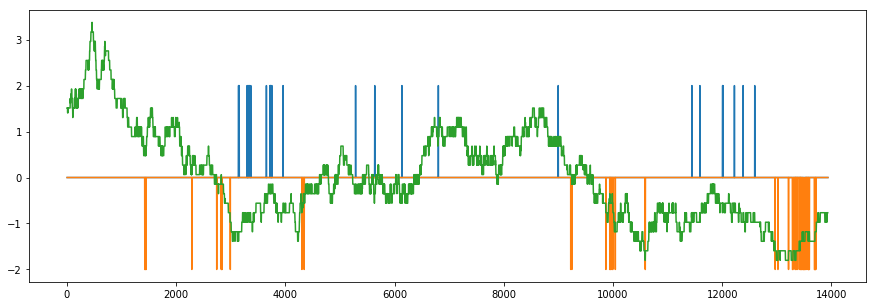

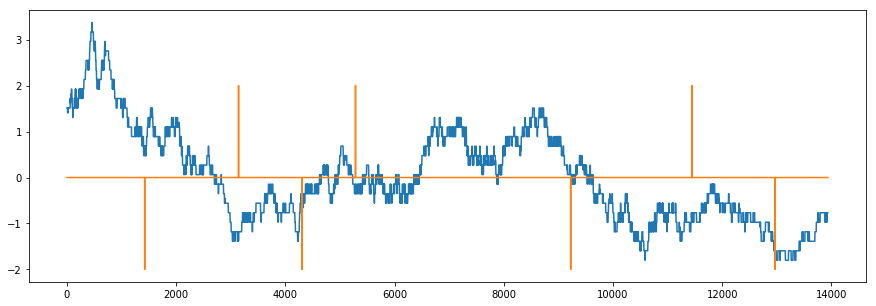

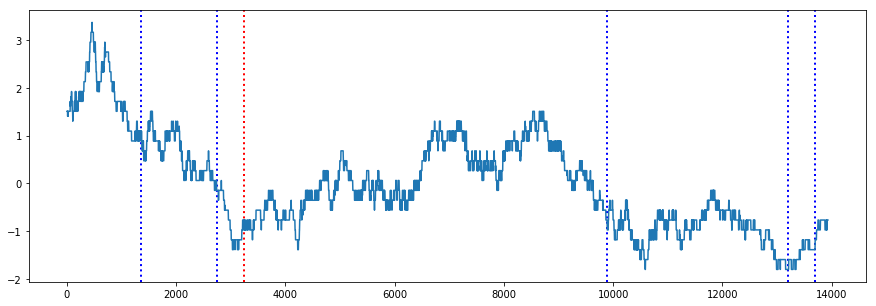

# Long  26060 26080 26050 26065
Long Entry: 2016-10-07 09:32:30.060775 # Long Exit: 2016-10-07 09:40:55.754817 # Long_time_threshold_profit: 5
#######################################################################################################
LONG P&L: 5 SHORT P&L: 0.0 TOTAL P&L: 5.0
#######################################################################################################
###############
Cum_Long_profit:  50
20161010 0.535 -0.547


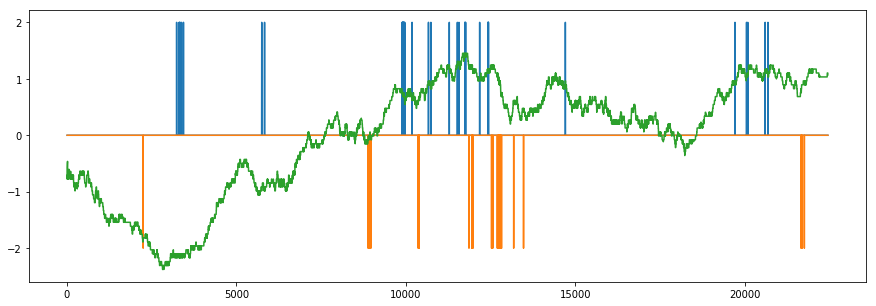

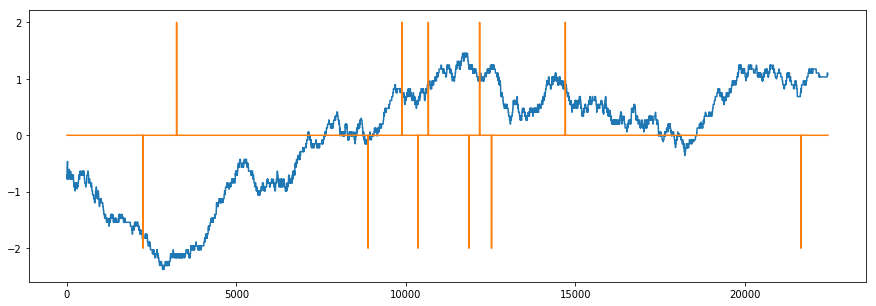

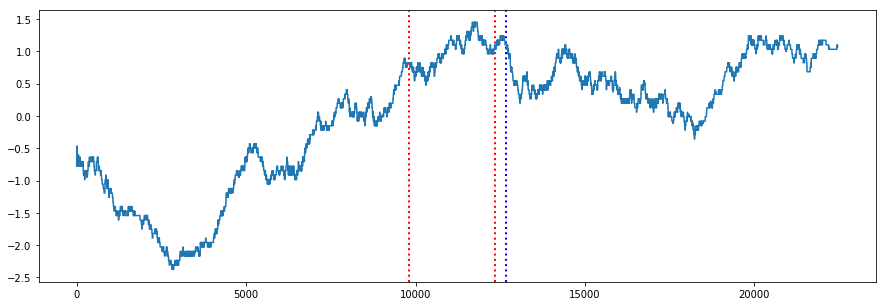

# Long  26070 26090 26060 26065
Long Entry: 2016-10-10 09:48:52.108399 # Long Exit: 2016-10-10 09:57:12.301036 # Long_time_threshold_profit: -5
#######################################################################################################
# Long  26090 26110 26080 26075
Long Entry: 2016-10-10 10:21:50.792910 # Long Exit: 2016-10-10 10:30:11.019116 # Long_time_threshold_profit: -15
#######################################################################################################
LONG P&L: -20 SHORT P&L: 0.0 TOTAL P&L: -20.0
#######################################################################################################
###############
Cum_Long_profit:  30
20161011 0.524 -0.541


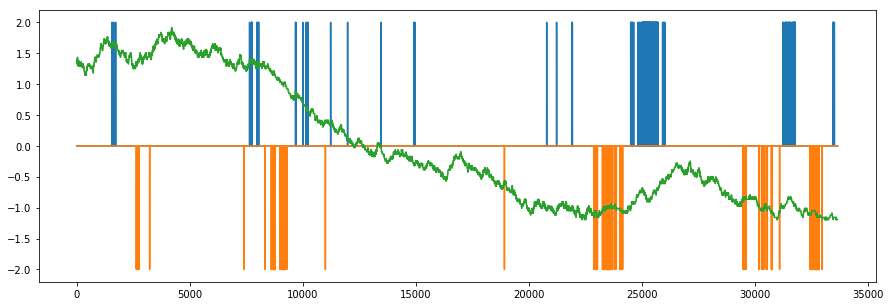

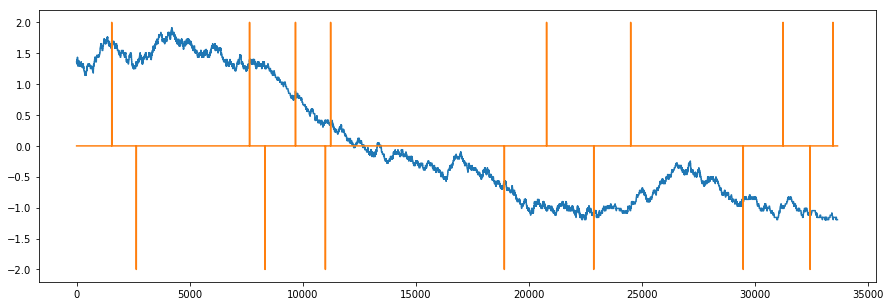

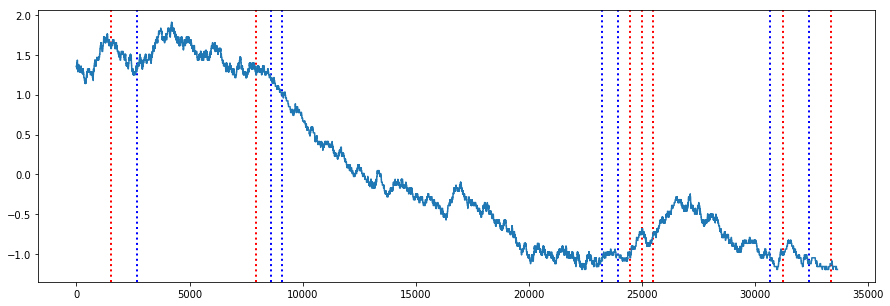

# Long  26070 26090 26060 26035
Long Entry: 2016-10-11 09:04:01.258014 # Long Exit: 2016-10-11 09:12:21.280234 # Long_time_threshold_profit: -35
#######################################################################################################
# Long  26030 26050 26020 26025
Long Entry: 2016-10-11 10:28:05.713607 # Long Exit: 2016-10-11 10:36:29.895802 # Long_time_threshold_profit: -5
#######################################################################################################
# Long  25710 25730 25700 25740
Long Entry: 2016-10-11 13:23:43.699716 # Long Exit: 2016-10-11 13:32:12.471048 # Long_time_threshold_profit: 30
#######################################################################################################
# Long  25755 25775 25745 25735
Long Entry: 2016-10-11 13:30:26.773654 # Long Exit: 2016-10-11 13:38:47.154480 # Long_time_threshold_profit: -20
#######################################################################################################
# Long

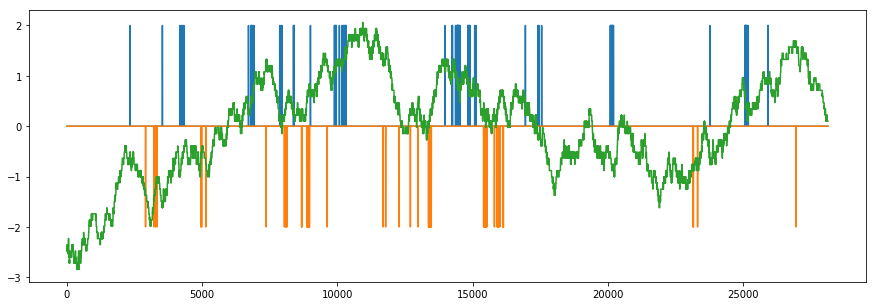

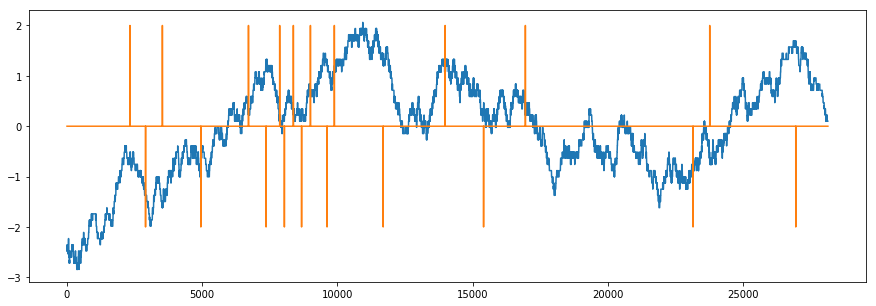

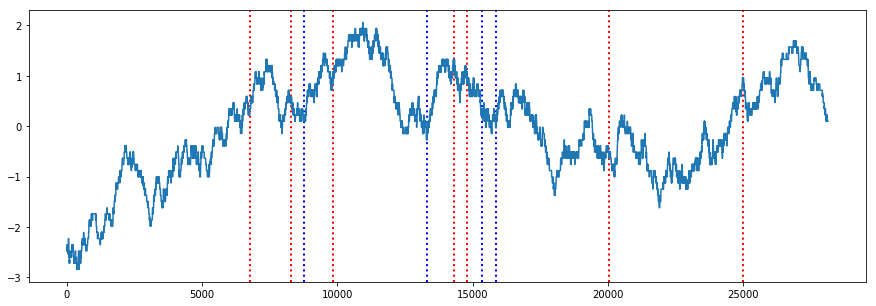

# Long  25665 25685 25655 25660
Long Entry: 2016-10-12 09:33:59.348901 # Long Exit: 2016-10-12 09:42:21.117753 # Long_time_threshold_profit: -5
#######################################################################################################
# Long  25680 25700 25670 25680
Long Entry: 2016-10-12 09:44:24.645180 # Long Exit: 2016-10-12 09:52:47.026480 # Long_time_threshold_profit: 0
#######################################################################################################
# Long  25695 25715 25685 25730
Long Entry: 2016-10-12 09:57:40.264679 # Long Exit: 2016-10-12 10:06:01.680272 # Long_time_threshold_profit: 35
#######################################################################################################
# Long  25710 25730 25700 25680
Long Entry: 2016-10-12 10:34:20.834262 # Long Exit: 2016-10-12 10:42:40.865171 # Long_time_threshold_profit: -30
#######################################################################################################
# Long  

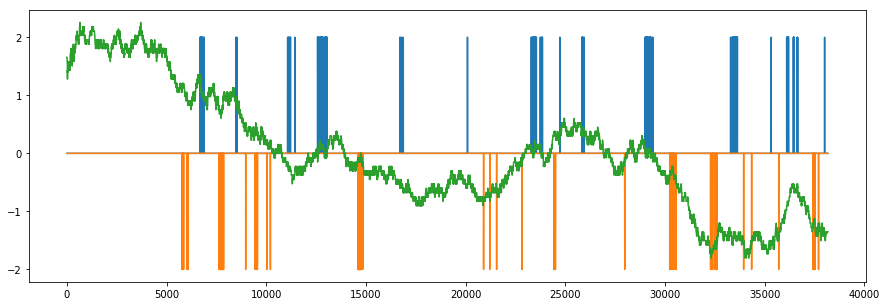

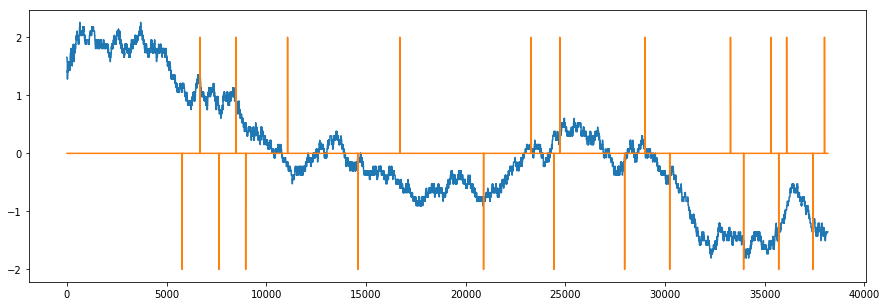

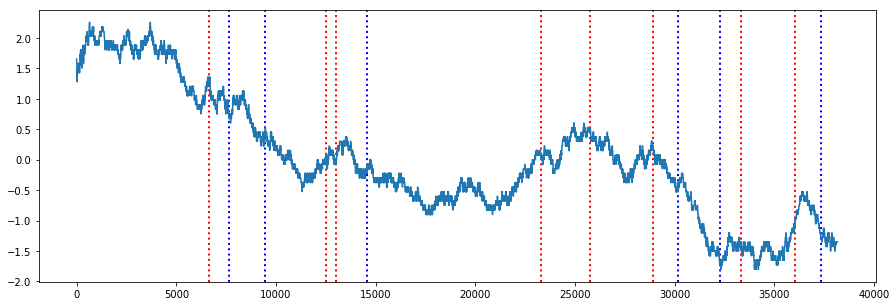

# Long  25610 25630 25600 25590
Long Entry: 2016-10-13 09:46:12.061116 # Long Exit: 2016-10-13 09:54:32.096671 # Long_time_threshold_profit: -20
#######################################################################################################
# Long  25530 25550 25520 25540
Long Entry: 2016-10-13 10:36:31.972290 # Long Exit: 2016-10-13 10:44:54.779458 # Long_time_threshold_profit: 10
#######################################################################################################
# Long  25525 25545 25515 25535
Long Entry: 2016-10-13 10:41:32.015235 # Long Exit: 2016-10-13 10:49:52.655491 # Long_time_threshold_profit: 10
#######################################################################################################
# Long  25535 25555 25525 25535
Long Entry: 2016-10-13 12:22:29.730483 # Long Exit: 2016-10-13 12:30:49.775625 # Long_time_threshold_profit: 0
#######################################################################################################
# Long  

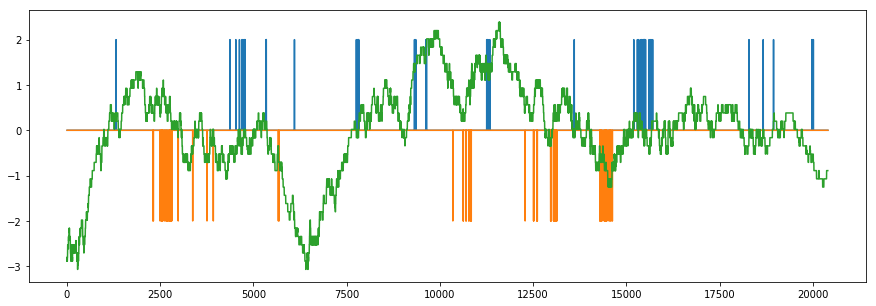

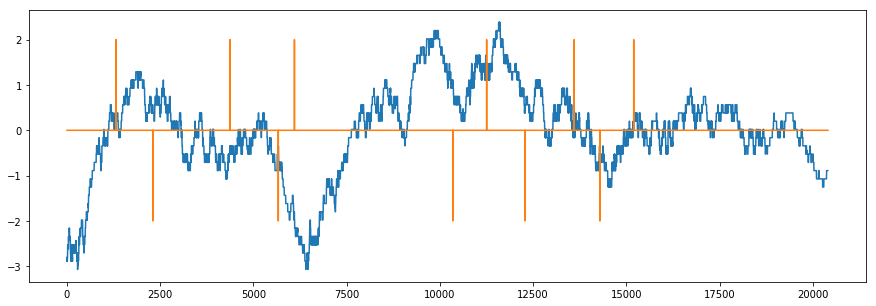

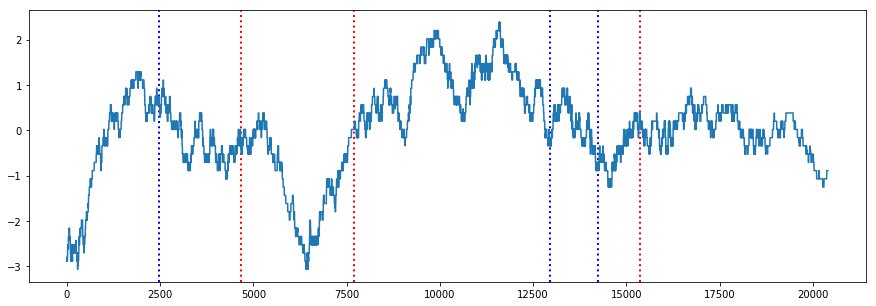

# Long  25585 25605 25575 25590
Long Entry: 2016-10-14 09:29:46.523408 # Long Exit: 2016-10-14 09:38:07.185797 # Long_time_threshold_profit: 5
#######################################################################################################
# Long  25595 25615 25585 25595
Long Entry: 2016-10-14 10:07:02.735861 # Long Exit: 2016-10-14 10:15:26.247154 # Long_time_threshold_profit: 0
#######################################################################################################
# Long  25600 25620 25590 25580
Long Entry: 2016-10-14 12:00:27.096688 # Long Exit: 2016-10-14 12:09:25.104083 # Long_time_threshold_profit: -20
#######################################################################################################
LONG P&L: -15 SHORT P&L: 0.0 TOTAL P&L: -15.0
#######################################################################################################
###############
Cum_Long_profit:  -105
20161017 0.451 -0.45


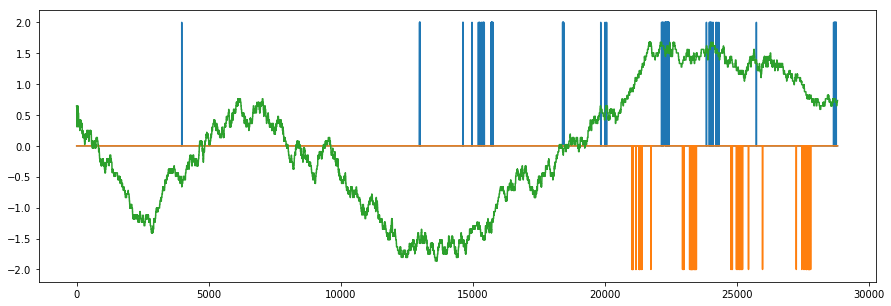

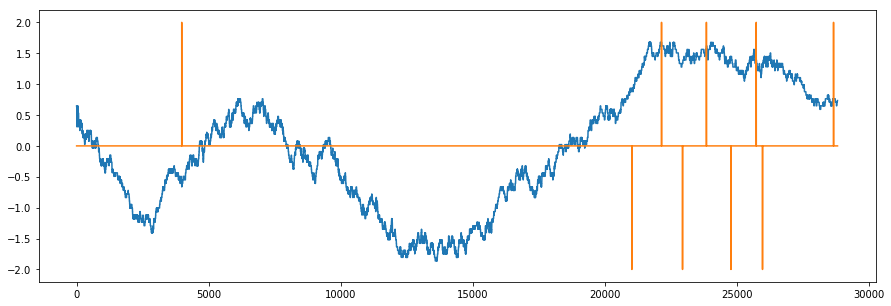

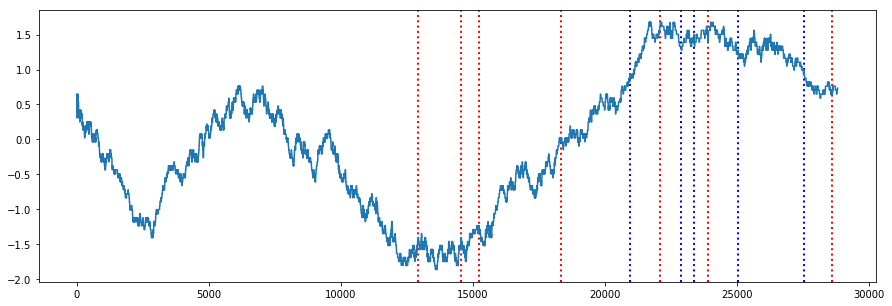

# Long  25435 25455 25425 25415
Long Entry: 2016-10-17 10:24:00.166559 # Long Exit: 2016-10-17 10:32:20.479787 # Long_time_threshold_profit: -20
#######################################################################################################
# Long  25425 25445 25415 25440
Long Entry: 2016-10-17 10:39:05.635445 # Long Exit: 2016-10-17 10:47:29.958917 # Long_time_threshold_profit: 15
#######################################################################################################
# Long  25450 25470 25440 25440
Long Entry: 2016-10-17 10:46:45.956548 # Long Exit: 2016-10-17 10:55:06.721901 # Long_time_threshold_profit: -10
#######################################################################################################
# Long  25560 25580 25550 25565
Long Entry: 2016-10-17 11:21:06.333544 # Long Exit: 2016-10-17 11:29:28.430421 # Long_time_threshold_profit: 5
#######################################################################################################
# Long 

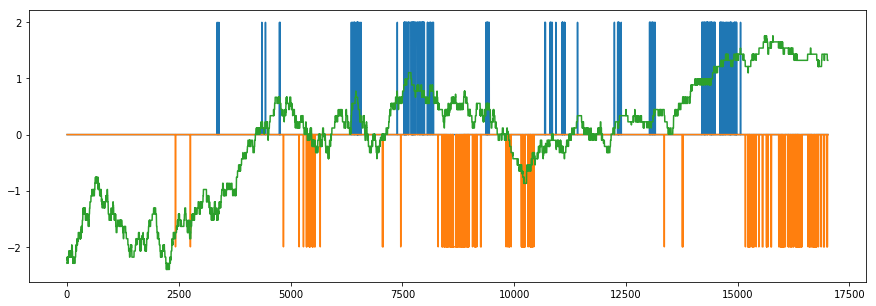

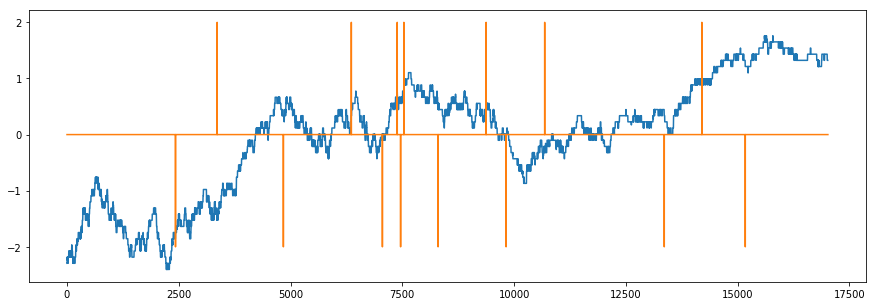

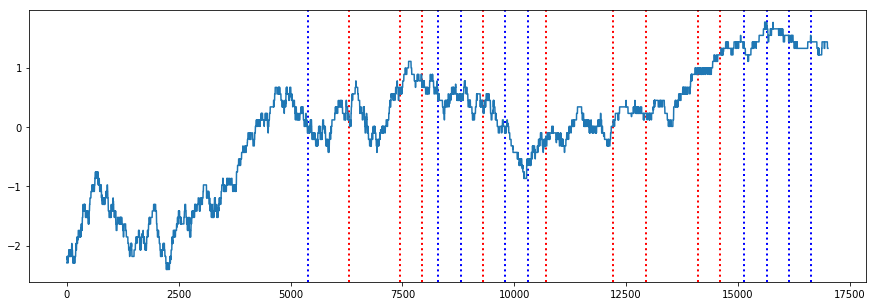

# Long  25750 25770 25740 25735
Long Entry: 2016-10-18 10:03:58.238340 # Long Exit: 2016-10-18 10:12:27.583096 # Long_time_threshold_profit: -15
#######################################################################################################
# Long  25775 25795 25765 25765
Long Entry: 2016-10-18 10:23:16.992697 # Long Exit: 2016-10-18 10:31:38.904341 # Long_time_threshold_profit: -10
#######################################################################################################
# Long  25775 25795 25765 25770
Long Entry: 2016-10-18 10:31:00.580476 # Long Exit: 2016-10-18 10:39:22.273062 # Long_time_threshold_profit: -5
#######################################################################################################
# Long  25760 25780 25750 25750
Long Entry: 2016-10-18 11:04:51.599895 # Long Exit: 2016-10-18 11:13:18.552147 # Long_time_threshold_profit: -10
#######################################################################################################
# Lon

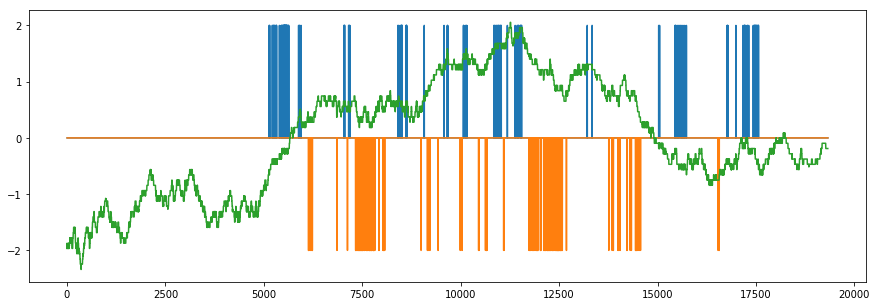

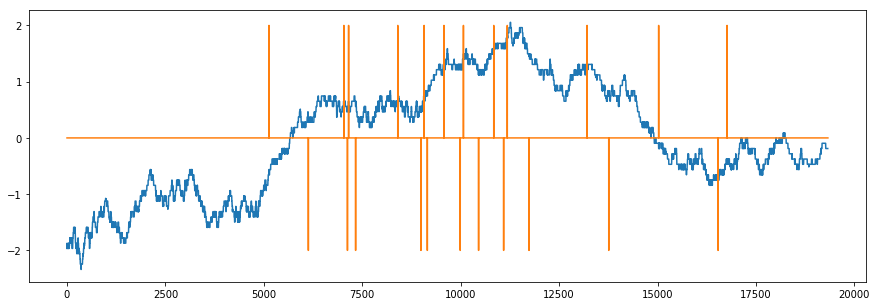

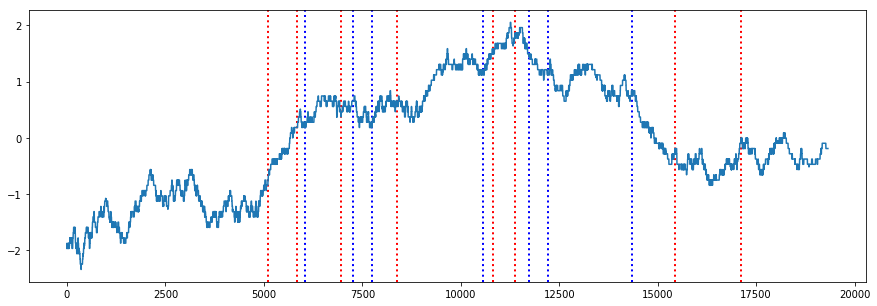

# Long  25820 25840 25810 25895
Long Entry: 2016-10-19 10:04:55.437372 # Long Exit: 2016-10-19 10:13:16.852305 # Long_time_threshold_profit: 75
#######################################################################################################
# Long  25870 25890 25860 25885
Long Entry: 2016-10-19 10:08:06.201965 # Long Exit: 2016-10-19 10:16:30.640370 # Long_time_threshold_profit: 15
#######################################################################################################
# Long  25885 25905 25875 25885
Long Entry: 2016-10-19 10:20:11.216104 # Long Exit: 2016-10-19 10:28:33.784988 # Long_time_threshold_profit: 0
#######################################################################################################
# Long  25890 25910 25880 25875
Long Entry: 2016-10-19 10:55:45.374712 # Long Exit: 2016-10-19 11:04:06.116535 # Long_time_threshold_profit: -15
#######################################################################################################
# Long  

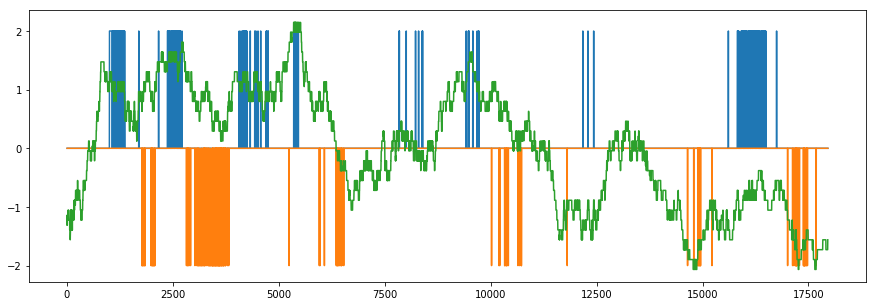

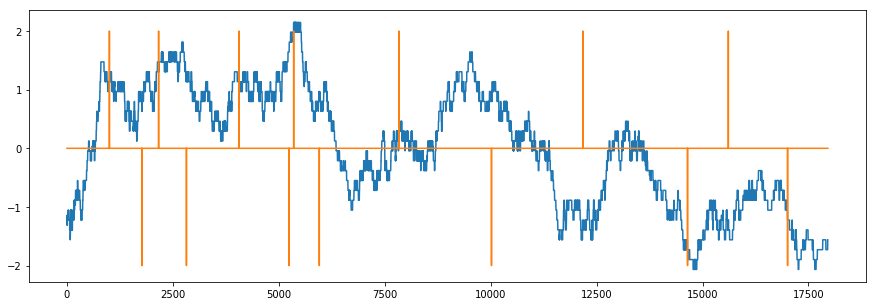

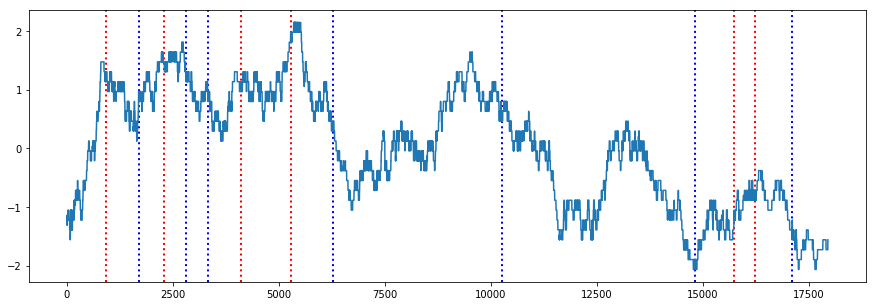

# Long  25935 25955 25925 25940
Long Entry: 2016-10-20 09:02:50.185682 # Long Exit: 2016-10-20 09:11:10.407164 # Long_time_threshold_profit: 5
#######################################################################################################
# Long  25945 25965 25935 25930
Long Entry: 2016-10-20 09:10:28.199537 # Long Exit: 2016-10-20 09:18:50.960482 # Long_time_threshold_profit: -15
#######################################################################################################
# Long  25930 25950 25920 25925
Long Entry: 2016-10-20 09:33:35.441628 # Long Exit: 2016-10-20 09:41:56.885470 # Long_time_threshold_profit: -5
#######################################################################################################
# Long  25955 25975 25945 25885
Long Entry: 2016-10-20 09:55:37.859815 # Long Exit: 2016-10-20 10:03:58.147197 # Long_time_threshold_profit: -70
#######################################################################################################
# Long 

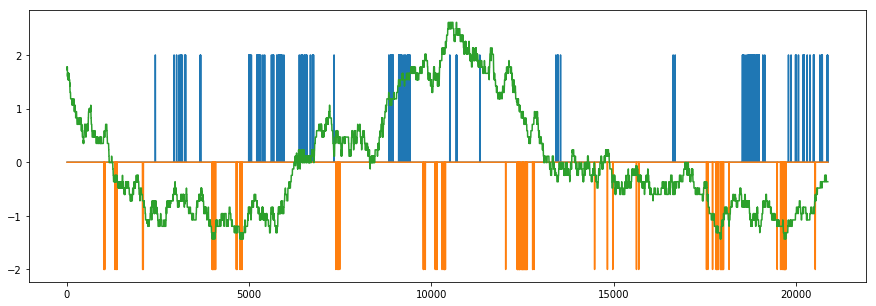

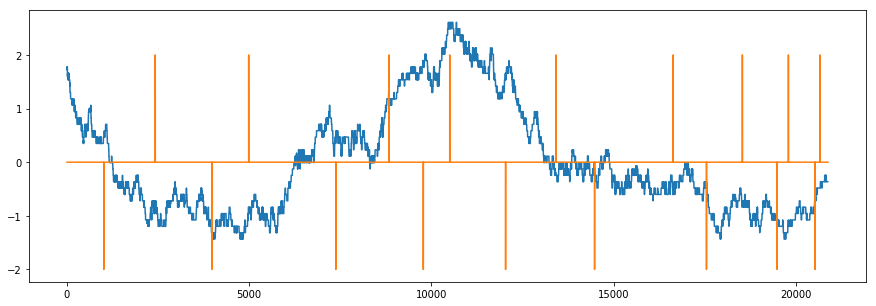

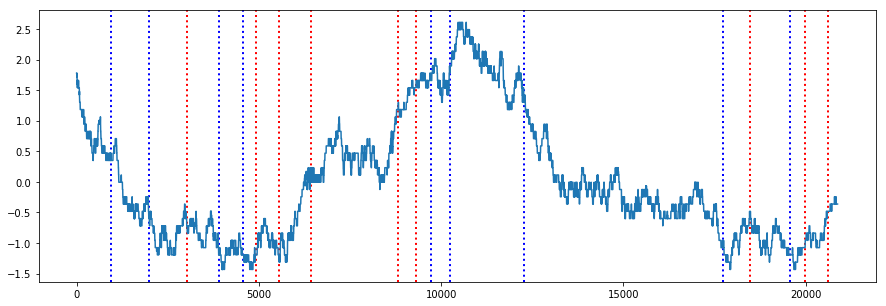

# Long  25750 25770 25740 25735
Long Entry: 2016-10-21 09:10:04.205680 # Long Exit: 2016-10-21 09:18:27.020632 # Long_time_threshold_profit: -15
#######################################################################################################
# Long  25730 25750 25720 25730
Long Entry: 2016-10-21 09:30:01.696194 # Long Exit: 2016-10-21 09:38:26.087568 # Long_time_threshold_profit: 0
#######################################################################################################
# Long  25730 25750 25720 25795
Long Entry: 2016-10-21 09:42:09.035065 # Long Exit: 2016-10-21 09:50:31.231688 # Long_time_threshold_profit: 65
#######################################################################################################
# Long  25785 25805 25775 25785
Long Entry: 2016-10-21 09:48:46.340144 # Long Exit: 2016-10-21 09:57:08.696472 # Long_time_threshold_profit: 0
#######################################################################################################
# Long  2

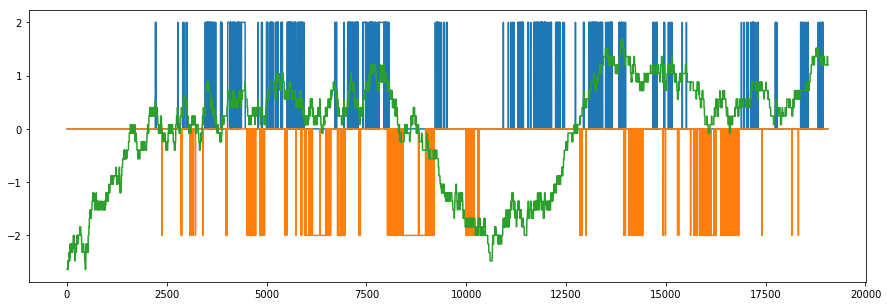

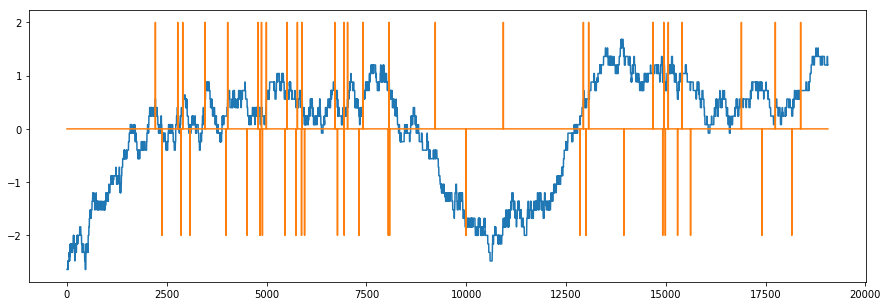

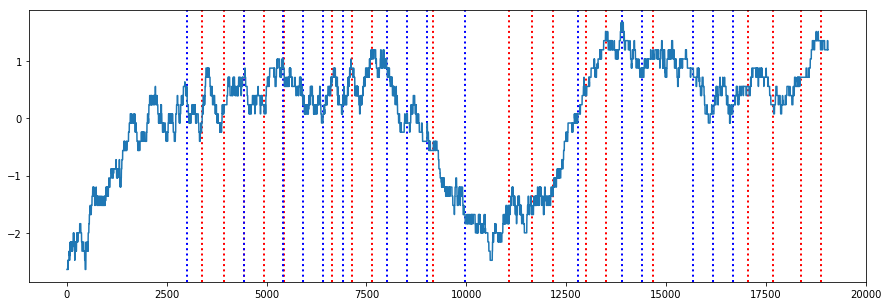

# Long  25905 25925 25895 25920
Long Entry: 2016-10-24 09:19:32.212301 # Long Exit: 2016-10-24 09:27:53.588428 # Long_time_threshold_profit: 15
#######################################################################################################
# Long  25920 25940 25910 25930
Long Entry: 2016-10-24 09:24:28.454684 # Long Exit: 2016-10-24 09:32:50.123889 # Long_time_threshold_profit: 10
#######################################################################################################
# Long  25935 25955 25925 25920
Long Entry: 2016-10-24 09:32:40.644908 # Long Exit: 2016-10-24 09:41:08.687700 # Long_time_threshold_profit: -15
#######################################################################################################
# Long  25920 25940 25910 25925
Long Entry: 2016-10-24 09:46:39.771888 # Long Exit: 2016-10-24 09:55:00.918436 # Long_time_threshold_profit: 5
#######################################################################################################
# Long  

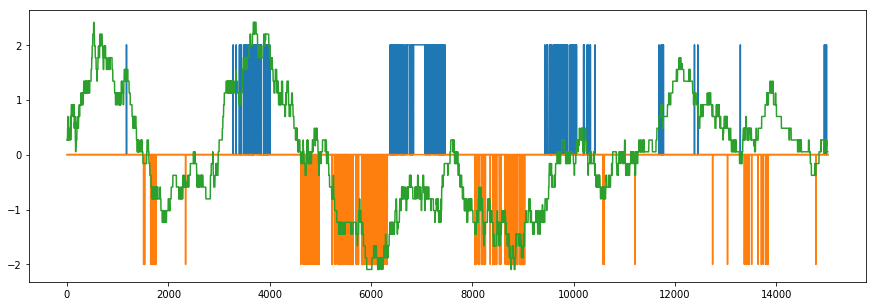

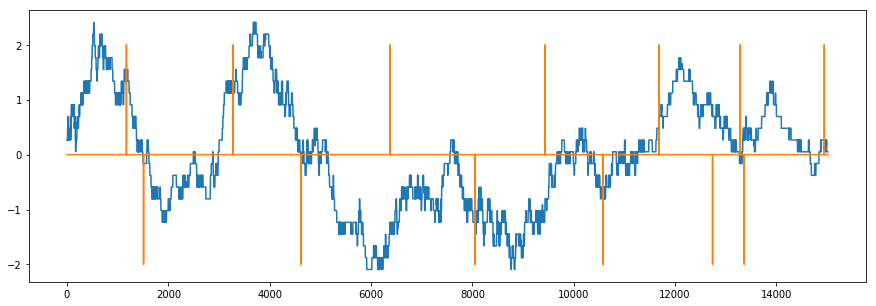

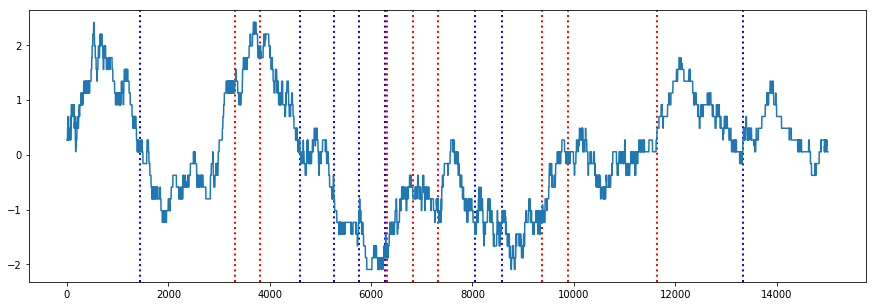

# Long  25915 25935 25905 25900
Long Entry: 2016-10-25 09:23:08.172104 # Long Exit: 2016-10-25 09:31:29.777623 # Long_time_threshold_profit: -15
#######################################################################################################
# Long  25925 25945 25915 25895
Long Entry: 2016-10-25 09:23:47.729786 # Long Exit: 2016-10-25 09:32:10.411278 # Long_time_threshold_profit: -30
#######################################################################################################
# Long  25840 25860 25830 25860
Long Entry: 2016-10-25 09:56:10.523919 # Long Exit: 2016-10-25 10:04:32.102325 # Long_time_threshold_profit: 20
#######################################################################################################
# Long  25870 25890 25860 25860
Long Entry: 2016-10-25 10:03:47.761587 # Long Exit: 2016-10-25 10:12:11.269246 # Long_time_threshold_profit: -10
#######################################################################################################
# Lon

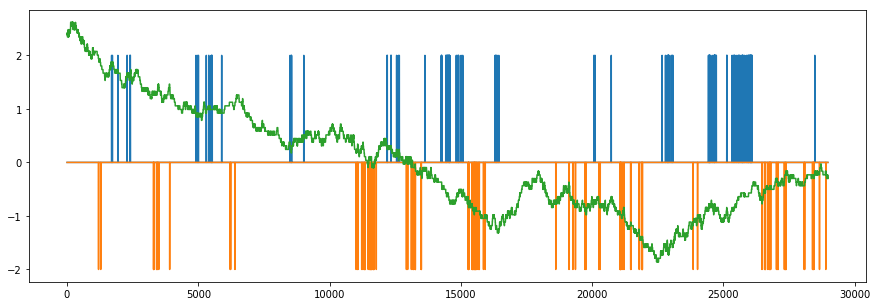

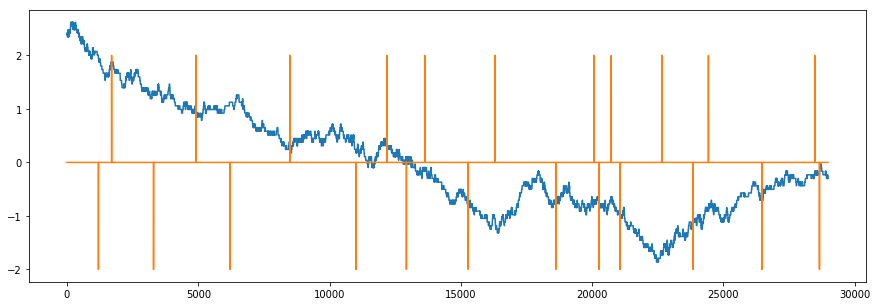

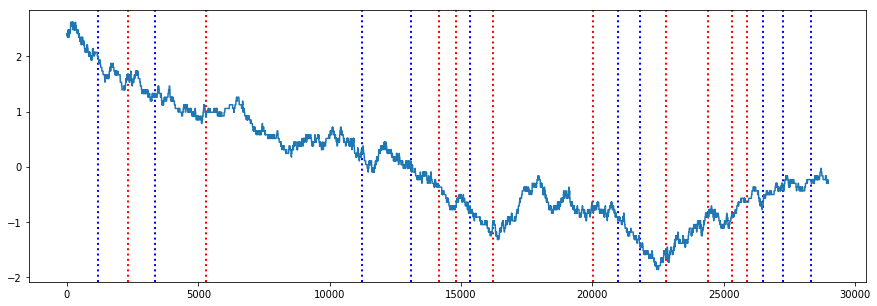

# Long  25705 25725 25695 25675
Long Entry: 2016-10-26 09:06:33.575529 # Long Exit: 2016-10-26 09:14:53.628368 # Long_time_threshold_profit: -30
#######################################################################################################
# Long  25650 25670 25640 25655
Long Entry: 2016-10-26 09:23:32.849557 # Long Exit: 2016-10-26 09:31:53.441408 # Long_time_threshold_profit: 5
#######################################################################################################
# Long  25555 25575 25545 25535
Long Entry: 2016-10-26 11:05:55.002449 # Long Exit: 2016-10-26 11:14:18.242674 # Long_time_threshold_profit: -20
#######################################################################################################
# Long  25530 25550 25520 25515
Long Entry: 2016-10-26 11:11:22.448014 # Long Exit: 2016-10-26 11:19:43.238185 # Long_time_threshold_profit: -15
#######################################################################################################
# Long

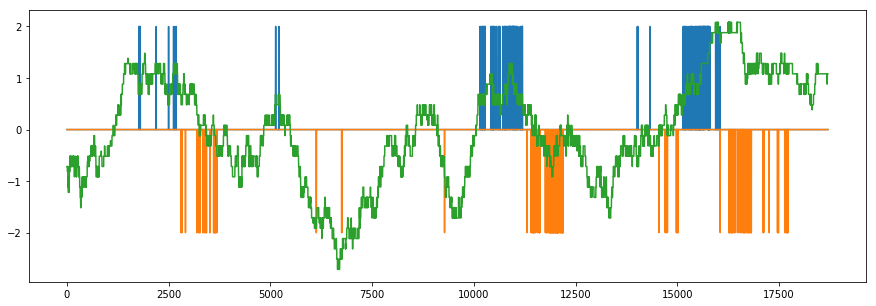

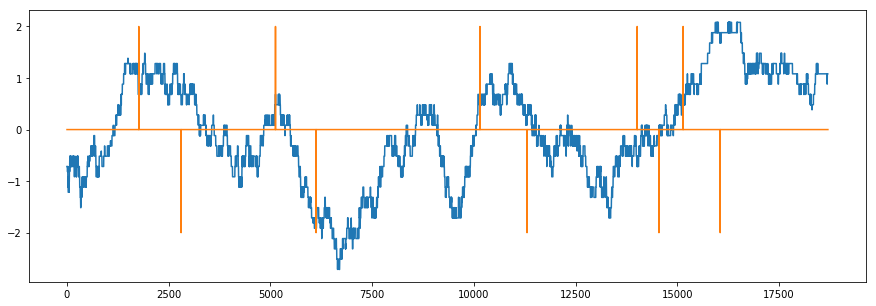

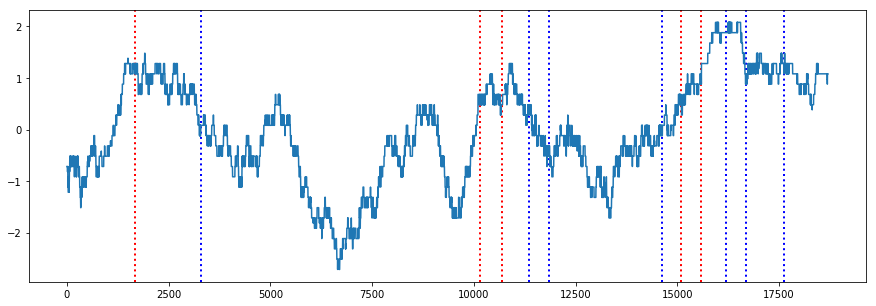

# Long  25690 25710 25680 25675
Long Entry: 2016-10-27 09:06:08.469828 # Long Exit: 2016-10-27 09:14:28.493008 # Long_time_threshold_profit: -15
#######################################################################################################
# Long  25675 25695 25665 25665
Long Entry: 2016-10-27 10:53:44.518270 # Long Exit: 2016-10-27 11:02:08.051266 # Long_time_threshold_profit: -10
#######################################################################################################
# Long  25675 25695 25665 25665
Long Entry: 2016-10-27 10:55:58.283013 # Long Exit: 2016-10-27 11:04:35.116718 # Long_time_threshold_profit: -10
#######################################################################################################
# Long  25675 25695 25665 25680
Long Entry: 2016-10-27 14:02:17.034780 # Long Exit: 2016-10-27 14:10:37.892044 # Long_time_threshold_profit: 5
#######################################################################################################
# Long

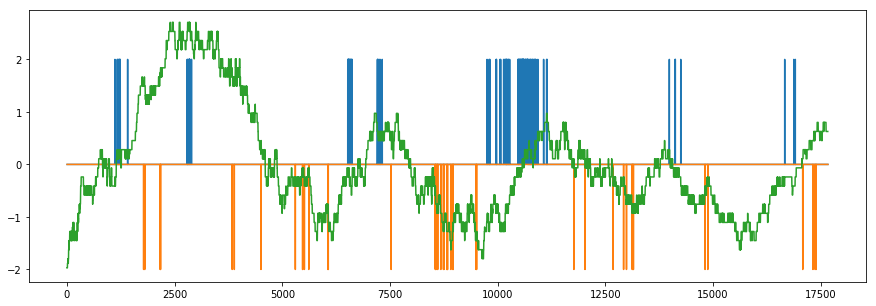

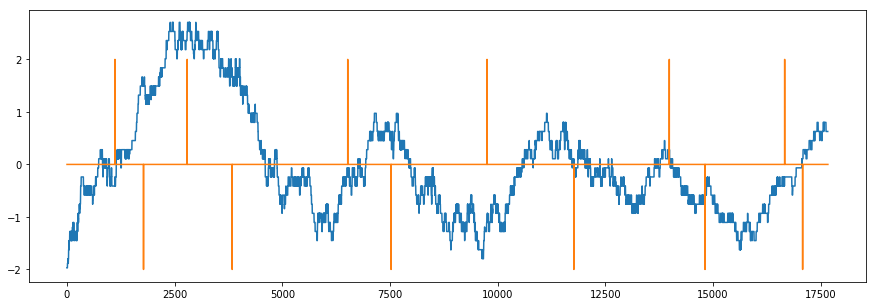

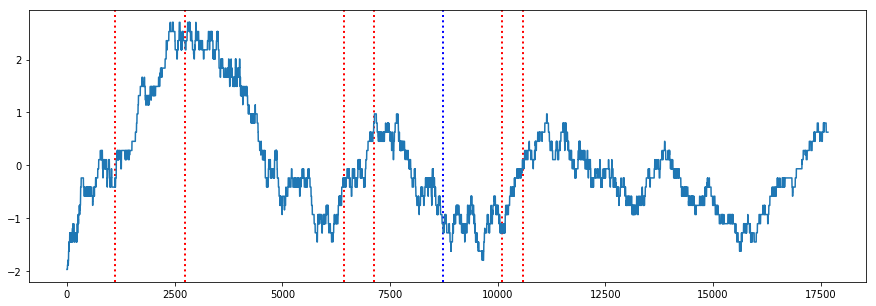

# Long  25670 25690 25660 25745
Long Entry: 2016-10-28 09:04:14.002516 # Long Exit: 2016-10-28 09:12:41.168720 # Long_time_threshold_profit: 75
#######################################################################################################
# Long  25750 25770 25740 25740
Long Entry: 2016-10-28 09:12:01.994516 # Long Exit: 2016-10-28 09:20:22.150136 # Long_time_threshold_profit: -10
#######################################################################################################
# Long  25675 25695 25665 25690
Long Entry: 2016-10-28 09:44:58.710751 # Long Exit: 2016-10-28 09:53:20.644450 # Long_time_threshold_profit: 15
#######################################################################################################
# Long  25700 25720 25690 25700
Long Entry: 2016-10-28 09:52:17.724100 # Long Exit: 2016-10-28 10:00:38.874379 # Long_time_threshold_profit: 0
#######################################################################################################
# Long  

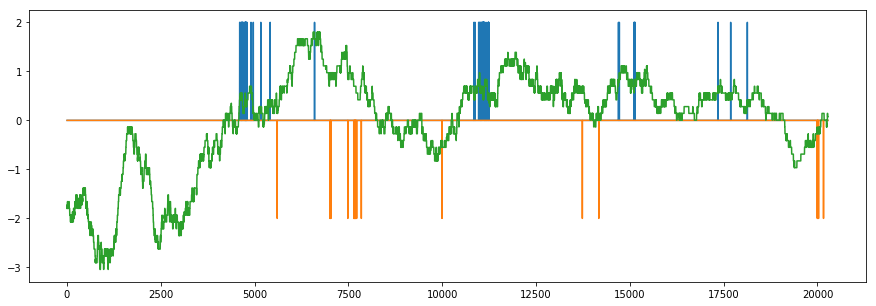

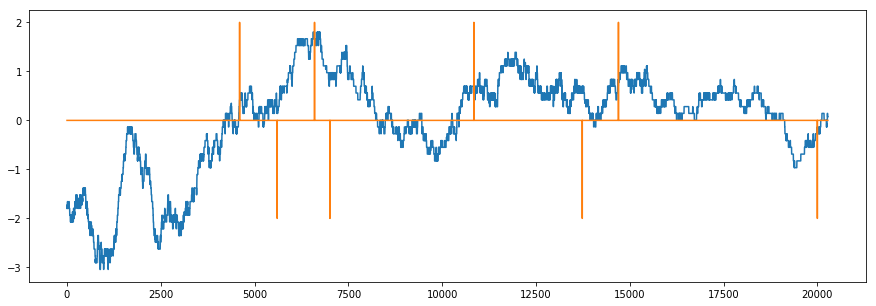

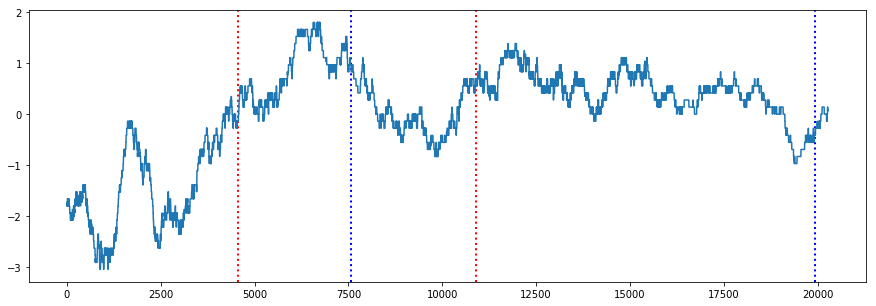

# Long  25635 25655 25625 25645
Long Entry: 2016-10-31 09:13:33.588771 # Long Exit: 2016-10-31 09:21:54.029759 # Long_time_threshold_profit: 10
#######################################################################################################
# Long  25660 25680 25650 25675
Long Entry: 2016-10-31 10:28:06.940026 # Long Exit: 2016-10-31 10:36:28.418138 # Long_time_threshold_profit: 15
#######################################################################################################
LONG P&L: 25 SHORT P&L: 0.0 TOTAL P&L: 25.0
#######################################################################################################
###############
Cum_Long_profit:  -150
20161101 0.516 -0.51


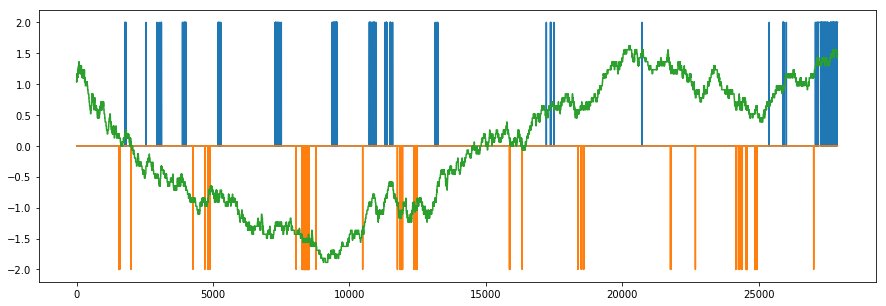

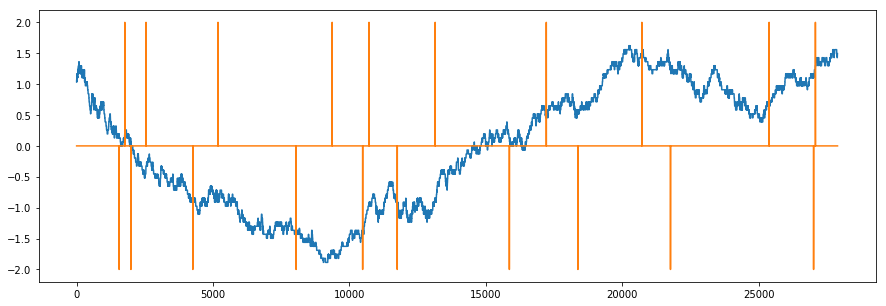

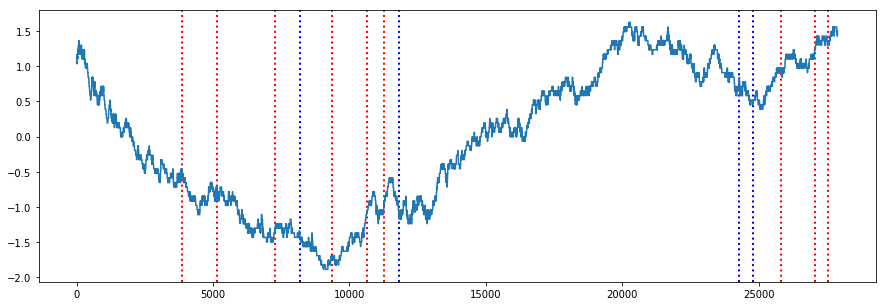

# Long  25495 25515 25485 25455
Long Entry: 2016-11-01 09:08:48.036608 # Long Exit: 2016-11-01 09:17:08.711767 # Long_time_threshold_profit: -40
#######################################################################################################
# Long  25470 25490 25460 25425
Long Entry: 2016-11-01 09:12:40.772483 # Long Exit: 2016-11-01 09:21:01.513225 # Long_time_threshold_profit: -45
#######################################################################################################
# Long  25425 25445 25415 25415
Long Entry: 2016-11-01 09:28:39.471985 # Long Exit: 2016-11-01 09:37:01.976563 # Long_time_threshold_profit: -10
#######################################################################################################
# Long  25395 25415 25385 25415
Long Entry: 2016-11-01 09:52:16.208338 # Long Exit: 2016-11-01 10:00:36.229199 # Long_time_threshold_profit: 20
#######################################################################################################
# Lon

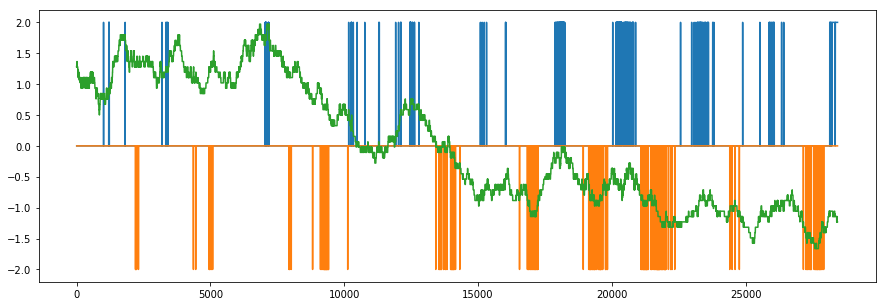

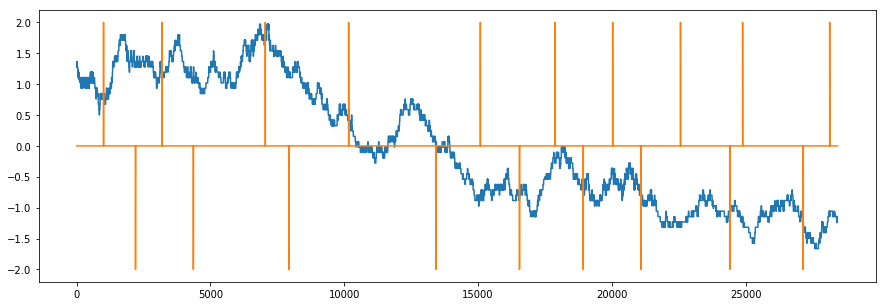

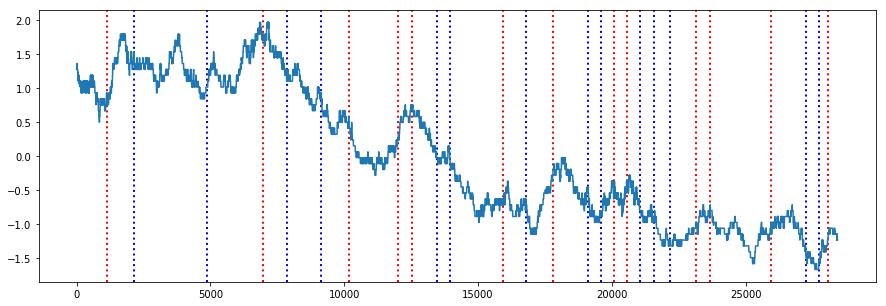

# Long  25435 25455 25425 25455
Long Entry: 2016-11-02 09:01:46.521302 # Long Exit: 2016-11-02 09:10:07.863110 # Long_time_threshold_profit: 20
#######################################################################################################
# Long  25480 25500 25470 25465
Long Entry: 2016-11-02 09:48:49.729853 # Long Exit: 2016-11-02 09:57:15.191326 # Long_time_threshold_profit: -15
#######################################################################################################
# Long  25410 25430 25400 25385
Long Entry: 2016-11-02 10:25:50.570697 # Long Exit: 2016-11-02 10:34:12.861430 # Long_time_threshold_profit: -25
#######################################################################################################
# Long  25395 25415 25385 25415
Long Entry: 2016-11-02 10:36:28.181781 # Long Exit: 2016-11-02 10:44:56.750785 # Long_time_threshold_profit: 20
#######################################################################################################
# Long

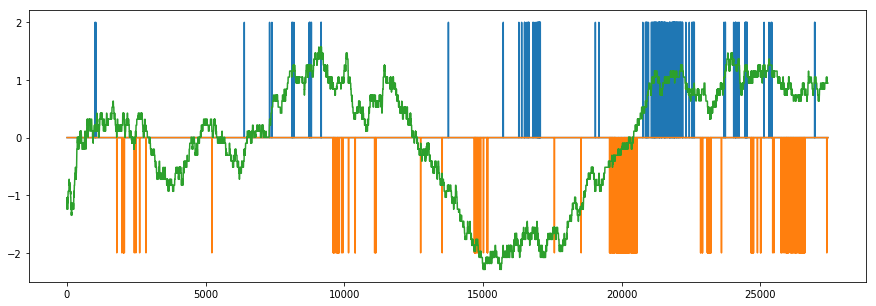

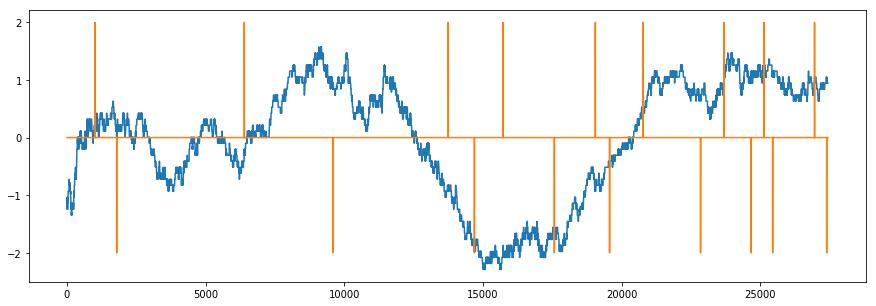

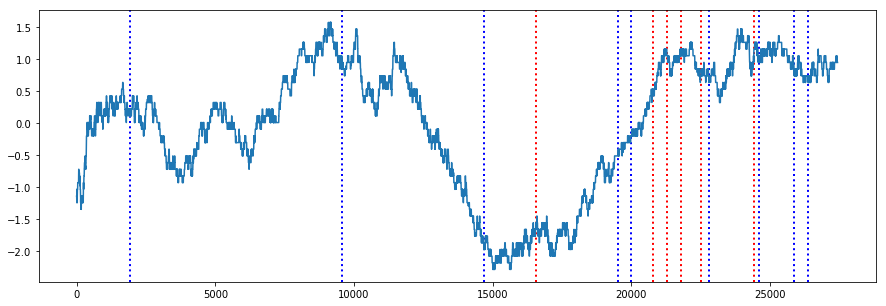

# Long  25245 25265 25235 25240
Long Entry: 2016-11-03 12:22:48.840937 # Long Exit: 2016-11-03 12:31:10.031771 # Long_time_threshold_profit: -5
#######################################################################################################
# Long  25350 25370 25340 25360
Long Entry: 2016-11-03 13:29:02.824645 # Long Exit: 2016-11-03 13:37:23.206817 # Long_time_threshold_profit: 10
#######################################################################################################
# Long  25380 25400 25370 25355
Long Entry: 2016-11-03 13:30:11.020974 # Long Exit: 2016-11-03 13:38:32.812892 # Long_time_threshold_profit: -25
#######################################################################################################
# Long  25375 25395 25365 25355
Long Entry: 2016-11-03 13:32:19.873981 # Long Exit: 2016-11-03 13:40:45.995376 # Long_time_threshold_profit: -20
#######################################################################################################
# Long

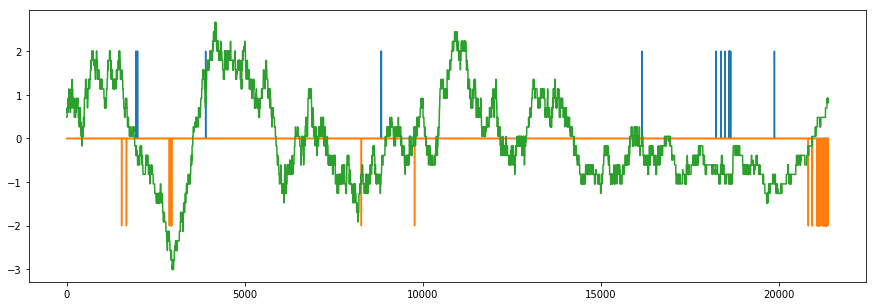

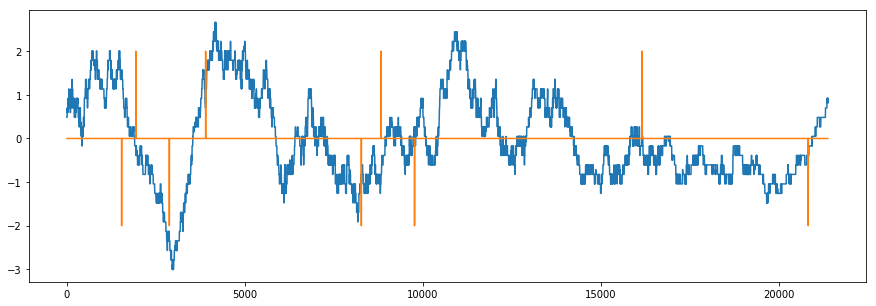

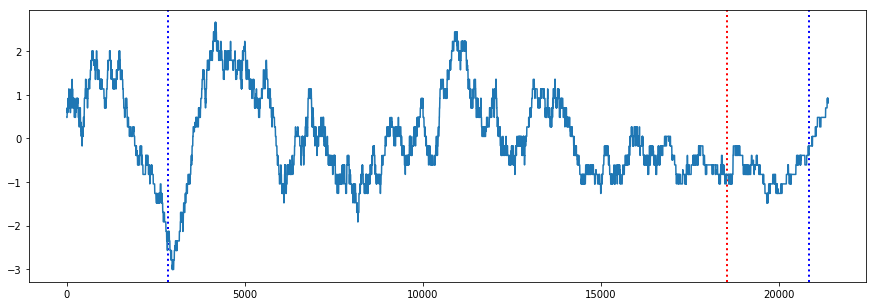

# Long  25280 25300 25270 25285
Long Entry: 2016-11-04 14:20:05.317516 # Long Exit: 2016-11-04 14:28:25.680831 # Long_time_threshold_profit: 5
#######################################################################################################
LONG P&L: 5 SHORT P&L: 0.0 TOTAL P&L: 5.0
#######################################################################################################
###############
Cum_Long_profit:  -330
20161107 0.524 -0.529


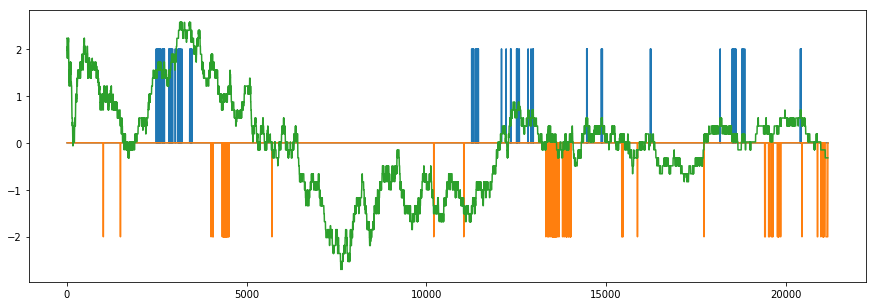

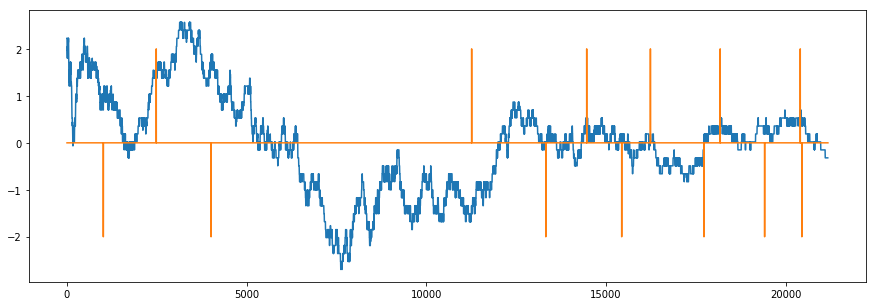

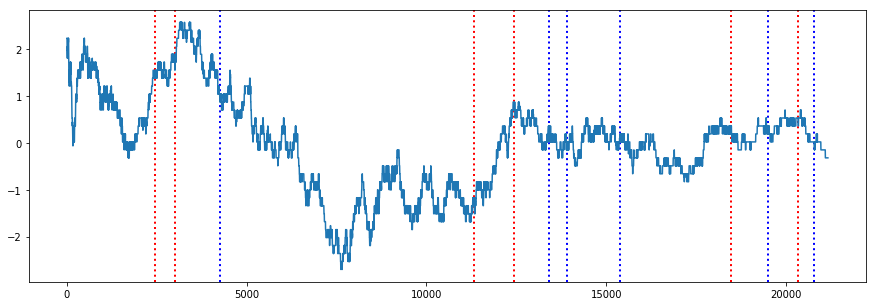

# Long  25555 25575 25545 25540
Long Entry: 2016-11-07 09:04:02.694183 # Long Exit: 2016-11-07 09:12:24.517790 # Long_time_threshold_profit: -15
#######################################################################################################
# Long  25565 25585 25555 25540
Long Entry: 2016-11-07 09:05:16.863994 # Long Exit: 2016-11-07 09:13:37.091700 # Long_time_threshold_profit: -25
#######################################################################################################
# Long  25480 25500 25470 25480
Long Entry: 2016-11-07 10:30:48.695133 # Long Exit: 2016-11-07 10:39:24.172679 # Long_time_threshold_profit: 0
#######################################################################################################
# Long  25535 25555 25525 25510
Long Entry: 2016-11-07 10:45:44.500274 # Long Exit: 2016-11-07 10:54:04.754790 # Long_time_threshold_profit: -25
#######################################################################################################
# Long

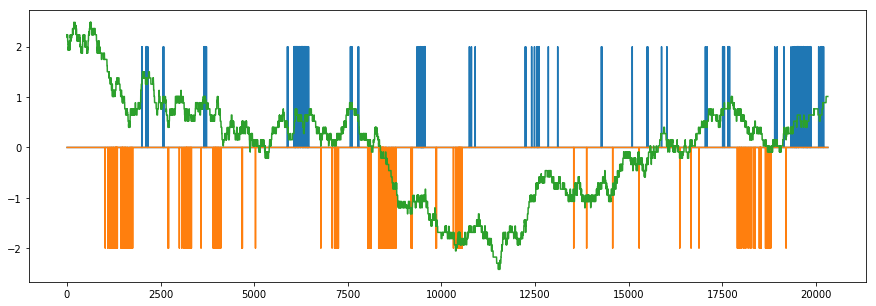

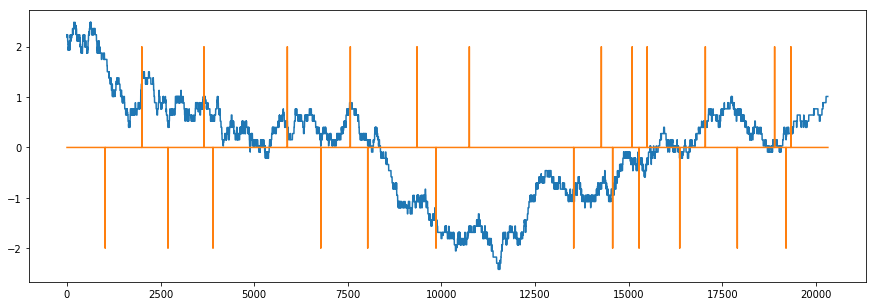

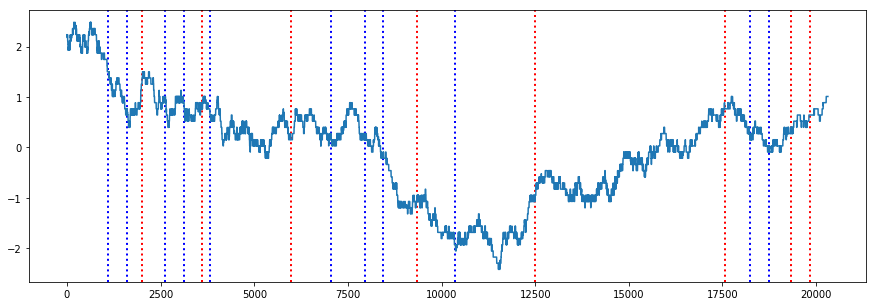

# Long  25595 25615 25585 25565
Long Entry: 2016-11-08 09:05:27.538849 # Long Exit: 2016-11-08 09:13:49.453415 # Long_time_threshold_profit: -30
#######################################################################################################
# Long  25575 25595 25565 25540
Long Entry: 2016-11-08 09:17:44.848901 # Long Exit: 2016-11-08 09:26:07.031888 # Long_time_threshold_profit: -35
#######################################################################################################
# Long  25550 25570 25540 25555
Long Entry: 2016-11-08 09:45:46.554410 # Long Exit: 2016-11-08 09:54:22.507853 # Long_time_threshold_profit: 5
#######################################################################################################
# Long  25495 25515 25485 25465
Long Entry: 2016-11-08 10:39:17.830281 # Long Exit: 2016-11-08 10:47:42.920527 # Long_time_threshold_profit: -30
#######################################################################################################
# Long

C:\Users\Jay\lib\site-packages\IPython\core\interactiveshell.py:2785: DtypeWarning: Columns (4) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


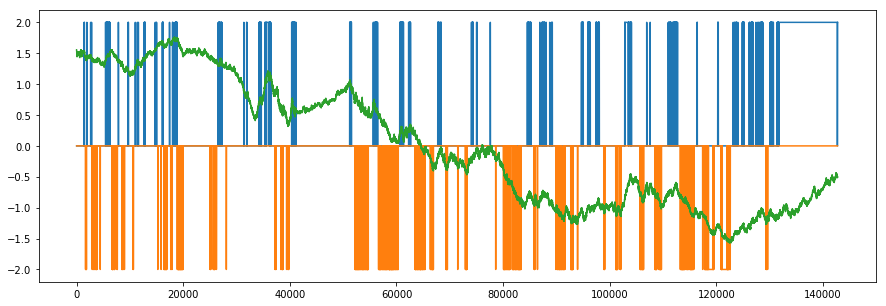

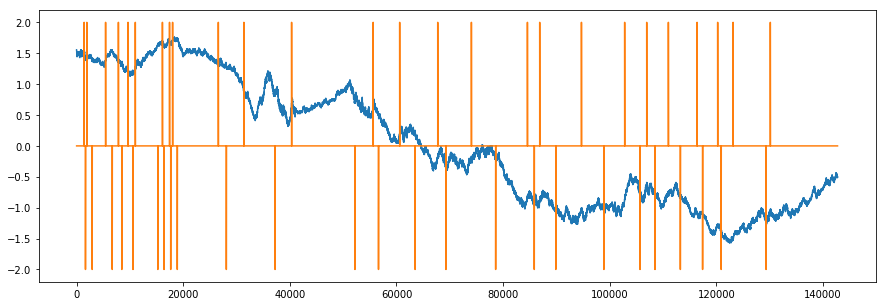

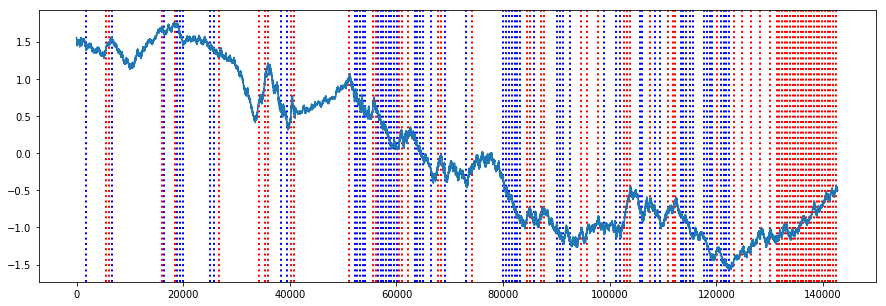

# Long  25635 25655 25625 25650
Long Entry: 2016-11-09 09:26:02.406903 # Long Exit: 2016-11-09 09:34:28.702044 # Long_time_threshold_profit: 15
#######################################################################################################
# Long  25655 25675 25645 25640
Long Entry: 2016-11-09 09:27:36.887121 # Long Exit: 2016-11-09 09:35:57.431686 # Long_time_threshold_profit: -15
#######################################################################################################
# Long  25720 25740 25710 25725
Long Entry: 2016-11-09 10:01:19.067289 # Long Exit: 2016-11-09 10:09:39.203680 # Long_time_threshold_profit: 5
#######################################################################################################
# Long  25735 25755 25725 25675
Long Entry: 2016-11-09 10:10:28.668744 # Long Exit: 2016-11-09 10:18:51.200219 # Long_time_threshold_profit: -60
#######################################################################################################
# Long 

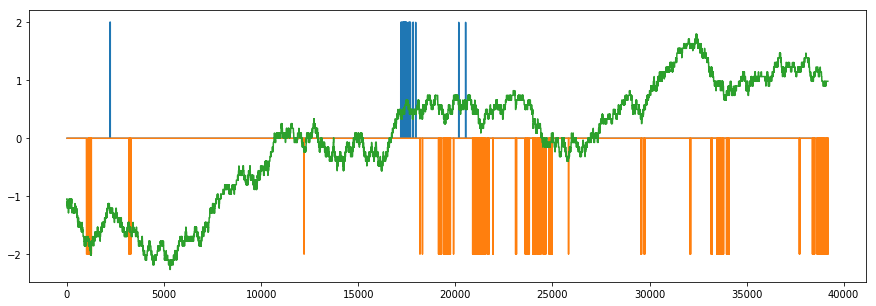

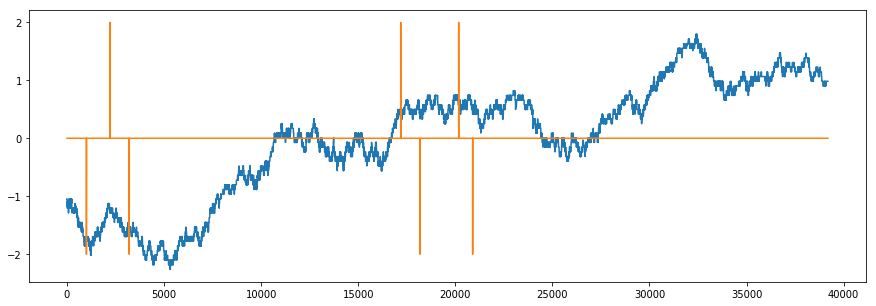

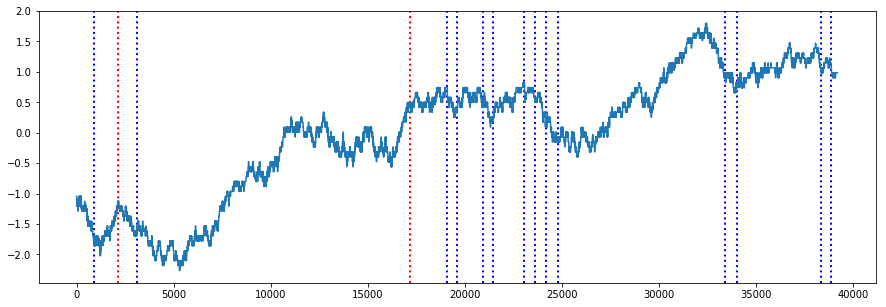

# Long  25385 25405 25375 25335
Long Entry: 2016-11-10 09:03:55.474387 # Long Exit: 2016-11-10 09:12:16.129439 # Long_time_threshold_profit: -50
#######################################################################################################
# Long  25485 25505 25475 25480
Long Entry: 2016-11-10 10:37:53.779010 # Long Exit: 2016-11-10 10:46:15.012839 # Long_time_threshold_profit: -5
#######################################################################################################
LONG P&L: -55 SHORT P&L: 0.0 TOTAL P&L: -55.0
#######################################################################################################
###############
Cum_Long_profit:  -1580
20161111 1.204 -0.592


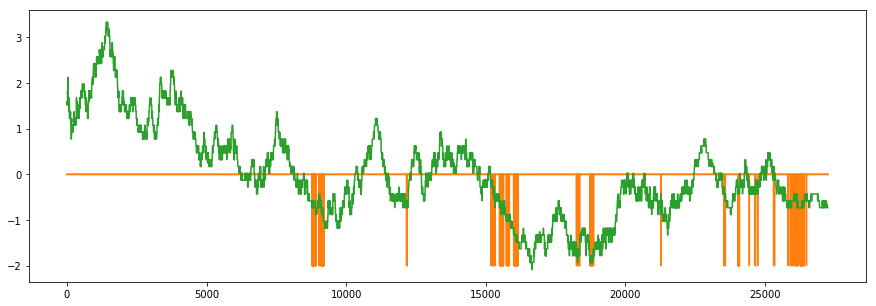

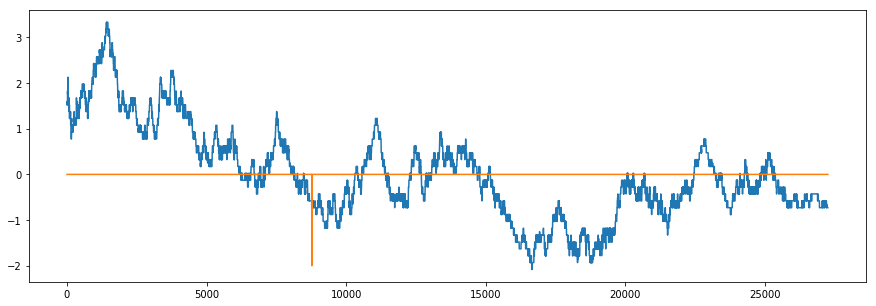

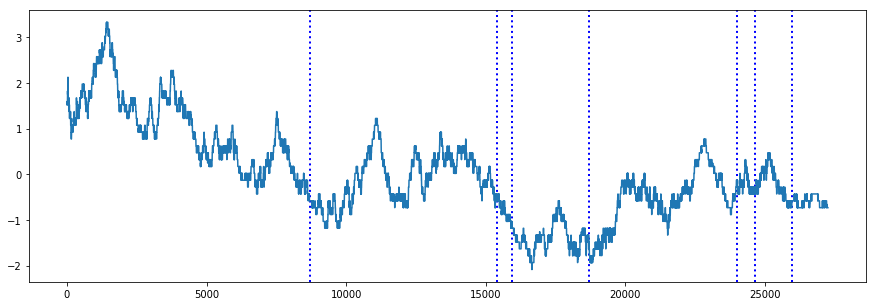

LONG P&L: 0.0 SHORT P&L: 0.0 TOTAL P&L: 0.0
#######################################################################################################
###############
Cum_Long_profit:  -1580.0
20161114 1.294 -0.586


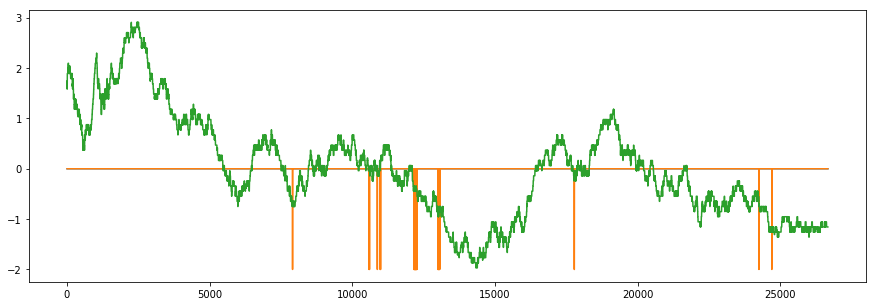

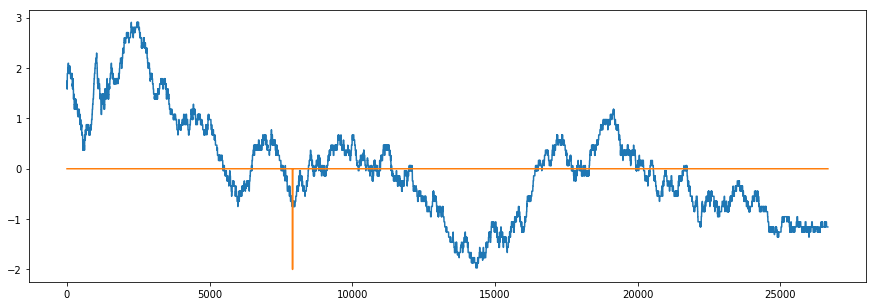

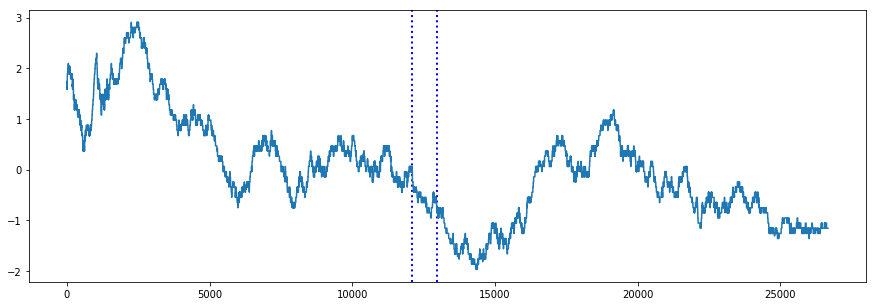

LONG P&L: 0.0 SHORT P&L: 0.0 TOTAL P&L: 0.0
#######################################################################################################
###############
Cum_Long_profit:  -1580.0
20161115 1.33 -0.583


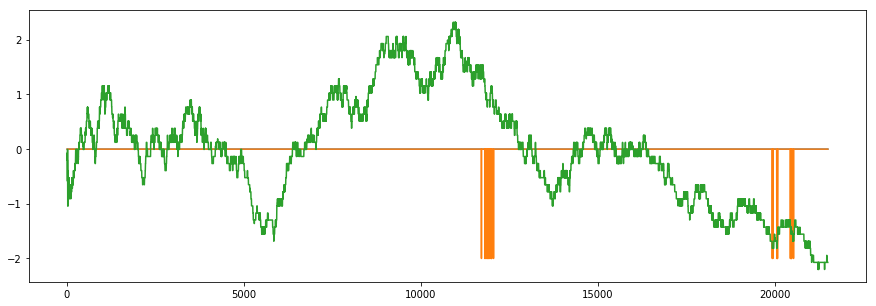

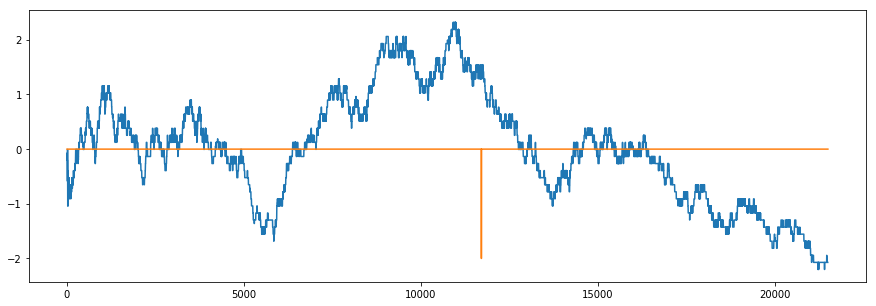

KeyboardInterrupt: 

In [23]:
dates = []
cum_long_profits = []
cum_short_profits = []

for i in train_parameters['prd_date']:

    tmp_date = i
    
    # Read threshold that calculated with the previous data set.
    long_spread_threshold = train_parameters['prd_long_thresh'][train_parameters['prd_date'] == i].iloc[0]
    short_spread_threshold = train_parameters['prd_short_thresh'][train_parameters['prd_date'] == i].iloc[0]
    print(tmp_date, long_spread_threshold, short_spread_threshold)
    
    # Read Test data
    test = pd.read_csv(read_path + 'DIOB__data_A3_G7_{}.csv'.format(i))
    test['short_time'] = test['time'].apply(lambda x: x[0:8])
    test = test[(test['code'] == 'A3') | (test['code'] == 'G7')].reset_index(drop=True)
    test['date_time'] = test['time'].apply(lambda x: i[:4] + '-' + i[4:6] + '-' + i[6:] + ' ' +  x[:8] + '.' + x[9:])

    # 초기값 Reset # 
    spreads= [0] 
    ask_exe_q = 0
    bid_exe_q = 0
    current_long_lvl_1_q = 0
    current_long_lvl_2_q = 0
    current_long_lvl_3_q = 0
    current_long_lvl_4_q = 0
    current_long_lvl_5_q = 0

    current_short_lvl_1_q = 0
    current_short_lvl_2_q = 0
    current_short_lvl_3_q = 0
    current_short_lvl_4_q = 0
    current_short_lvl_5_q = 0

    previous_long_lvl_1_q = 0
    previous_long_lvl_2_q = 0
    previous_long_lvl_3_q = 0
    previous_long_lvl_4_q = 0
    previous_long_lvl_5_q = 0 

    previous_short_lvl_1_q = 0
    previous_short_lvl_2_q = 0
    previous_short_lvl_3_q = 0
    previous_short_lvl_4_q = 0
    previous_short_lvl_5_q = 0    
    
    ## Dynamic Order Book Imbalance Caclulation ## 
    for i in test.index + 1:

        if i == len(test):
            break

        exe_q = test.get_value(i, 'exe_q')
        long_or_short = test.get_value(i, 'long_or_short')

        if long_or_short == 2:
            ask_exe_q = exe_q
            bid_exe_q = 0

        elif long_or_short == 1:
            ask_exe_q = 0
            bid_exe_q = exe_q

        current_long_lvl_1_q = test.get_value(i, 'long_lvl_1_q')
        current_long_lvl_2_q = test.get_value(i, 'long_lvl_2_q')
        current_long_lvl_3_q = test.get_value(i, 'long_lvl_3_q')
        current_long_lvl_4_q = test.get_value(i, 'long_lvl_4_q')
        current_long_lvl_5_q = test.get_value(i, 'long_lvl_5_q')

        current_short_lvl_1_q = test.get_value(i, 'short_lvl_1_q')
        current_short_lvl_2_q = test.get_value(i, 'short_lvl_2_q')
        current_short_lvl_3_q = test.get_value(i, 'short_lvl_3_q')
        current_short_lvl_4_q = test.get_value(i, 'short_lvl_4_q')
        current_short_lvl_5_q = test.get_value(i, 'short_lvl_5_q')

        previous_long_lvl_1_q = test.get_value(i - 1, 'long_lvl_1_q')
        previous_long_lvl_2_q = test.get_value(i - 1, 'long_lvl_2_q')
        previous_long_lvl_3_q = test.get_value(i - 1, 'long_lvl_3_q')
        previous_long_lvl_4_q = test.get_value(i - 1, 'long_lvl_4_q')
        previous_long_lvl_5_q = test.get_value(i - 1, 'long_lvl_5_q')

        previous_short_lvl_1_q = test.get_value(i - 1, 'short_lvl_1_q')
        previous_short_lvl_2_q = test.get_value(i - 1, 'short_lvl_2_q')
        previous_short_lvl_3_q = test.get_value(i - 1, 'short_lvl_3_q')
        previous_short_lvl_4_q = test.get_value(i - 1, 'short_lvl_4_q')
        previous_short_lvl_5_q = test.get_value(i - 1, 'short_lvl_5_q')


        netAsk = (current_long_lvl_1_q - previous_long_lvl_1_q) + \
        (current_long_lvl_2_q - previous_long_lvl_2_q) + \
        (current_long_lvl_3_q - previous_long_lvl_3_q) + \
        (current_long_lvl_4_q - previous_long_lvl_4_q) + \
        (current_long_lvl_5_q - previous_long_lvl_5_q) - ask_exe_q

        netBid = (current_short_lvl_1_q - previous_short_lvl_1_q) + \
        (current_short_lvl_2_q - previous_short_lvl_2_q) + \
        (current_short_lvl_3_q - previous_short_lvl_3_q) + \
        (current_short_lvl_4_q - previous_short_lvl_4_q) + \
        (current_short_lvl_5_q - previous_short_lvl_5_q) - bid_exe_q
    
        spread = netBid - netAsk
        spreads.append(spread)
        
    test['spreads'] = spreads
    test['mid_price'] = (test['long_lvl_1_p'] + test['short_lvl_1_p']) / 2
    test['rolling_spreads_mean'] = test['spreads'].rolling(1000).mean()
    test['rolling_spreads_mean'] = test['rolling_spreads_mean'].replace(np.nan, 0)
    test['long_spread_signal'] = test['rolling_spreads_mean'] >= long_spread_threshold
    test['short_spread_signal'] = test['rolling_spreads_mean'] <= short_spread_threshold

    #######################################################################################
    accum_val = pd.DataFrame((test['long_spread_signal'] * 1 + test['short_spread_signal'] * -1).cumsum())

    result = [0]

    for i in range(len(accum_val)):
        if len(accum_val) == i:
            break

        if i == 0:
            continue

        past_value = accum_val.get_value(i-1, 0)
        cur_value  = accum_val.get_value(i, 0)

        if past_value == cur_value:
            result.append(0)
            continue

        elif cur_value > past_value:
            result.append(1)

        elif cur_value < past_value:
            result.append(-1)

    result = pd.DataFrame(result)

    ls = [0]

    for i in range(len(result)):
        if len(result) == i+1:
            break

        if i == 0:
            continue

        pre_val = result.get_value(i-1, 0)
        cur_val = result.get_value(i, 0)
        next_val = result.get_value(i+1, 0)

        if (pre_val == 0 and cur_val == 1 and next_val == 0):
            ls.append(1)

        elif (pre_val == 0 and cur_val == -1 and next_val == 0):
            ls.append(-1)

        elif (pre_val == 0 and cur_val == 1 and next_val == 1):
            ls.append(1)

        elif (pre_val == 1 and cur_val == 1 and next_val == 1):
            ls.append(0)

        elif (pre_val == 0 and cur_val == -1 and next_val == -1):
            ls.append(-1)

        elif (pre_val == -1 and cur_val == -1 and next_val == -1):
            ls.append(0)

        else:
            ls.append(0)

    ls.append(0)
    ls = pd.DataFrame(ls)
    
    signal_test = ls[ls[0] != 0]
    signal_test_index = signal_test.index
    signal_test = signal_test.reset_index(drop=True)

    testing = []

    for i in range(len(signal_test)):
        if i == 0:
            cur_val = signal_test.get_value(i, 0)
            testing.append(cur_val)
            continue

        if len(signal_test) == i+1:
            prv_val = signal_test.get_value(i-1,0)
            cur_val = signal_test.get_value(i, 0)

            if prv_val == cur_val:
                testing.append(0)

            elif prv_val != cur_val:
                testing.append(cur_val)
            break

        prv_val = signal_test.get_value(i-1, 0)
        cur_val = signal_test.get_value(i, 0)
        nex_val = signal_test.get_value(i+1, 0)

        if prv_val == 1 and cur_val == 1 and nex_val == 1:
            testing.append(0)
        elif prv_val == 1 and cur_val == 1 and nex_val == -1:
            testing.append(0)
        elif prv_val == 1 and cur_val == 0 and nex_val == -1:
            testing.append(0)
        elif prv_val == -1 and cur_val == -1 and nex_val == 1:
            testing.append(0)
        elif prv_val == -1 and cur_val == 1 and nex_val == -1:
            testing.append(1)
        elif prv_val == -1 and cur_val == 1 and nex_val == 1:
            testing.append(1)

        elif prv_val == 1 and cur_val == 1 and nex_val == -1:
            testing.append(0)
        elif prv_val == 1 and cur_val == -1 and nex_val == 1:
            testing.append(-1)
        elif prv_val == 1 and cur_val == -1 and nex_val == -1:
            testing.append(-1)
        else:
            testing.append(0)
    
    ###############################
    
    testing = pd.DataFrame(testing, index=signal_test_index)
    
    try:
        test['real_signal'] = pd.concat([ls, testing], axis=1).iloc[:, 1].fillna(0)
    except IndexError:
        continue
    
    plt.figure(figsize=(15,5))
    plt.plot(test['long_spread_signal'].iloc[3:-1] * 2)
    plt.plot(test['short_spread_signal'].iloc[3:-1] * -2)
    plt.plot(scale(test['mid_price'].iloc[3:-1]))
    plt.show()
    
    plt.figure(figsize=(15,5))
    plt.plot(scale(test['mid_price'][3:-1]))
    plt.plot((test['real_signal']*2))
    plt.show()
    
    ######################
    ## Added Filtering ###
    ######################
    
    sample_long = (test['long_spread_signal'] * 1).to_frame()
    sample_short = (test['short_spread_signal'] * -1).to_frame()
    
    count_long = 0
    count_short = 0

    count_long_index = []
    count_short_index = []

    for i in sample_long.index:

        limit_long = count_long + 100
        limit_short = count_short + 100

        if (sample_long['long_spread_signal'].iloc[count_long:limit_long].sum() >= 10):
    #         print('## Long', count_long)
            count_long_index.append(count_long)
            count_long += 500

        if (sample_short['short_spread_signal'].iloc[count_short:limit_short].sum() <= -10):
    #         print('## Short', count_short)
            count_short_index.append(count_short)
            count_short +=500

        count_long += 1
        count_short += 1

    plt.figure(figsize=(15,5))
    for i in count_long_index:
        plt.axvline(test.index[i], color='r', linestyle=':', linewidth=2)
    for i in count_short_index:
        plt.axvline(test.index[i], color='b', linestyle=':', linewidth=2)
    plt.plot(scale(test['mid_price'].iloc[3:-1]))
    plt.show()
    
    ## 추가 부분 ##
    long_events = test.iloc[count_long_index, 26].to_frame()
    short_events = test.iloc[count_short_index, 26].to_frame()

    long_events = long_events.set_index('date_time')
    short_events = short_events.set_index('date_time')

    long_events.index = pd.to_datetime(long_events.index)
    short_events.index = pd.to_datetime(short_events.index)

    long_events = long_events.index
    short_events = short_events.index
    
    test_df = test.copy(deep=True)
    test_df['side'] = np.nan

    for i in count_long_index:
        test_df.loc[i, 'side'] = 1
    for i in count_short_index:
        test_df.loc[i, 'side'] = -1

    test_df = test_df.set_index('date_time')
    test_df.index = pd.to_datetime(test_df.index)
    
    # num_days is a parameter (actually seconds)
    long_vertical_barriers = add_vertical_barrier(t_events=long_events, close=test_df['mid_price'], num_days=500)
    short_vertical_barriers = add_vertical_barrier(t_events=short_events, close=test_df['mid_price'], num_days=500)    

    # Future Product => 1 price level == 5
    price_gap = 5

    # two_horizontal_barriers : profit_cut / loss_cut #

    profit_cut_param = price_gap * 4
    loss_cut_param = price_gap * 2

    # vertical_barriers
    horizon_param = long_vertical_barriers # 500 seconds

    long_profits = []
    short_profits = []

    ### 문제가 있어 보임 ###
    ### 시간 순서가 고려 되어 있지 않은것으로 보임 ###
    ### 이를 어떻게 해결해야 하나... 
    
    
    ## Long Case ## 
    value_count = 0

    for i in long_events:
        
        short_lvl_1_p = 0
        long_lvl_1_p = 0
        
        long_upper_index_count = 0
        long_lower_index_count = 0
        
        trading_term = test_df.loc[i: long_vertical_barriers[value_count]]

        long_entrance_price = trading_term['short_lvl_1_p'].iloc[0]
        long_entrance_time = trading_term['short_lvl_1_p'].index[0]

        upper_threshold_price = long_entrance_price + profit_cut_param

        lower_threshold_price = long_entrance_price - loss_cut_param

        time_threshold_price = trading_term['long_lvl_1_p'].iloc[-1]

        if time_threshold_price == 0:
            time_threshold_price = trading_term['cur_price'].iloc[-1]

        print('# Long ', long_entrance_price, upper_threshold_price, lower_threshold_price, time_threshold_price)

        ######### 시간 순으로 고려해야 함.
        # 그러기 위해서, 이안에서 다시 for loop을 돌리면서, 가격을 뽑으면서 어디 방향 threshold를 먼저 치는지 보고
        # 결정해야 하는 것으로 보임
        
#         for idx in trading_term.reset_index(drop=True).index:
#             short_lvl_1_p = trading_term.reset_index(drop=True).get_value(idx, 'short_lvl_1_p')
#             long_lvl_1_p = trading_term.reset_index(drop=True).get_value(idx, 'long_lvl_1_p')

#             print('short_lvl_1_p', short_lvl_1_p, 'long_lvl_1_p', long_lvl_1_p)
            
#             if short_lvl_1_p > upper_threshold_price and long_upper_index_count == 0:
                
#                 long_upper_index_count = 1
                
#                 long_upper_thresh_hit_index = idx
                
#                 long_exit_price = upper_threshold_price
#                 long_exit_time = trading_term.iloc[idx:idx+1].index[0]
                
#                 if long_lower_index_count == 0:
#                     profit = long_exit_price - long_entrance_price
                    
#                     print('Long Entry:', long_entrance_time, '# Long Exit:', long_exit_time, '# Long_upper_threshold_profit:', profit)
#                     print('#######################################################################################################')
#                     break
                    
#             if long_lvl_1_p <= lower_threshold_price and long_lower_index_count == 0:
                
#                 long_lower_index_count = 1
                
#                 long_lower_thresh_hit_index = idx
                
#                 long_exit_price = lower_threshold_price
#                 long_exit_time = trading_term.iloc[idx:idx+1].index[0]
            
#                 if long_upper_index_count == 0:
#                     profit = long_exit_price - long_entrance_price
                    
#                     print('Long Entry:', long_entrance_time, '# Long Exit:', long_exit_time, '# Long_lower_threshold_profit:', profit)
#                     print('#######################################################################################################')
#                     break
            
        if long_upper_index_count == 0 and long_lower_index_count == 0:
            long_exit_price = time_threshold_price
            long_exit_time = long_vertical_barriers[value_count]
            
            profit = long_exit_price - long_entrance_price
            print('Long Entry:', long_entrance_time, '# Long Exit:', long_exit_time, '# Long_time_threshold_profit:', profit)
            print('#######################################################################################################')
        
        long_profits.append(profit)
        value_count += 1
    
    print('LONG P&L:', np.sum(long_profits), 'SHORT P&L:', np.sum(short_profits), 'TOTAL P&L:', np.sum(long_profits) + np.sum(short_profits))
    print('#######################################################################################################')
    
    dates.append(tmp_date)
    cum_long_profits.append(np.sum(long_profits))
    
    print('###############')
    print('Cum_Long_profit: ', np.sum(cum_long_profits))